In [1]:
import numpy as np 
import pandas as pd
import glob
import os

from matplotlib import pyplot as plt, pylab as pl
%matplotlib inline
plt.style.use("bmh")
plt.rcParams["figure.figsize"] = (12,4)
import seaborn as sns
import plotly.express as px

#loading:
from base64 import b64decode, b64encode
from gzip import decompress, compress
import json

In [2]:
import plotly.graph_objects as go
import plotly.express as px
import tkinter as tk

In [3]:
import warnings 
warnings.filterwarnings("ignore") # `do not disturbe` mode

In [4]:
from datetime import datetime, timedelta

In [5]:
import pyarrow.parquet as pq
import pyarrow as pa

In [6]:
import pathlib
from pathlib import Path

In [8]:
# pip install xgboost

In [9]:
# pip install catboost

In [10]:
# Vectors and Metrics
PT_LARGE_SYN = 'PT_LARGE_SYN'
PT_SYN = 'PT_SYN'
PT_TCP = 'PT_TCP'
PT_DNS = 'PT_DNS'
PT_DNS_RESPONSE = 'PT_DNS_RESPONSE'
PT_NTP = 'PT_NTP'
PT_SSDP = 'PT_SSDP'
PT_ICMP = 'PT_ICMP'
PT_GENERAL = 'PT_GENERAL'
PT_TOTAL = 'PT_TOTAL'
PT_UDP = 'PT_UDP'
PT_FRAG = 'PT_FRAG'
PT_NTP = 'PT_NTP'
PT_GENERAL = 'PT_GENERAL'
PT_NETFLOW = 'PT_NETFLOW'

PPS = 'PPS'
BW = 'BW'

### Making sure all the prediction_ids in csv correspond between approved, request, all_prediction_ids_in_time_series_files_2


#### They correspond

In [11]:
# all_prediction_ids_in_time_series_files_2 = pd.read_csv('./all_prediction_ids_in_time_series_files_2.csv')
# all_prediction_ids_in_time_series_files_2 = all_prediction_ids_in_time_series_files_2.drop(columns=['Unnamed: 0'])
# all_prediction_ids_in_time_series_files_2

In [12]:
# gb = all_prediction_ids_in_time_series_files_2.groupby(['prediction_id', 'vector','metric','start_time','end_time']).file.nunique().reset_index()
# gb[gb.file>1]

In [13]:
# gb[gb.file>1].prediction_id.values[0]

In [14]:
# all_prediction_ids_in_time_series_files_2[(all_prediction_ids_in_time_series_files_2.prediction_id == '005bfaf34a790409e285ec342bb4781fc1a496e50141ca294cad138369601246') & (all_prediction_ids_in_time_series_files_2.vector == 'PT_DNS')]

We want to check a file ```TimeSeriesDataB64_3_1400_1500```, we see it is connected to:<br>
* ```PT_DNS	BW``` 2 times
* ```PT_DNS	PPS``` 2 times

That shouldn't happen. So I'm going to check the content of the file.

Edit: After checking each file hold multiple vector and metric, so it's fine.


In [15]:
# all_prediction_ids_in_time_series_files_no_dup = all_prediction_ids_in_time_series_files_2.drop_duplicates(subset=['prediction_id','vector','metric','start_time','end_time']).set_index('id')
# all_prediction_ids_in_time_series_files_no_dup

In [16]:
# all_prediction_ids_in_time_series_files_no_dup.to_csv('./all_prediction_ids_in_time_series_files_no_dup.csv')

So I have ```all_prediction_ids_in_time_series_files_no_dup.csv```<br>
Next I want to create a function that will get the data from the csv according to these parameters:
* vector
* metric
* prediction_id
* comment
* reason
* start_time, end_time

In [16]:
# pred_id_with_ts_file = pd.read_csv('./all_prediction_ids_in_time_series_files_no_dup.csv', index_col=['id'])
# pred_id_with_ts_file

In [17]:
#pred_id_with_ts_file.vector.value_counts()

### Manage SurveyAnswers:

In [18]:
# SurveyAnswers = pd.read_parquet('../../../Project/itay_and_mila_imperva_data/tables/SurveyAnswers.parquet', engine='pyarrow')
# SurveyAnswers['answer'] = SurveyAnswers['answer'].apply(lambda x: x.lower() if isinstance(x, str) else x)
# SurveyAnswers

In [19]:
# SurveyAnswers.to_csv('../../../Project/itay_and_mila_imperva_data/tables/SurveyAnswers.csv')

In [20]:
# SurveyAnswers.question_id.value_counts()

question_id: 0 - Did you use any other internal tool?
- If yes - the data that we have doesn’t explain the whole picture for this security policy

question_id: 1 - Did you use any external information such as pipe size, update from the customer, previous knowledge etc?
- If yes - the data that we have doesn’t explain the whole picture for this security policy

question_id: 2 - Could the model correctly predict this range’s policy using the time series traffic?
- If no - the data that we have doesn’t explain the whole picture for this security policy

Filter out: 

if ( question_id == 0 & answer == 'yes' ) or (question_id == 1 & answer == 'yes') or (question_id == 2 & answer == 'no')

In [21]:
# # Get the list of pred_ids which should be filtered out:
# SurveyAnswers_filter = SurveyAnswers[(SurveyAnswers['question_id']  == 0) & (SurveyAnswers['answer']  == 'yes') |
#                                      (SurveyAnswers['question_id']  == 1) & (SurveyAnswers['answer']  == 'yes') |
#                                      (SurveyAnswers['question_id']  == 2) & (SurveyAnswers['answer']  == 'no')                                                                    
#                                      ]

In [22]:
# #SurveyAnswers_filter.to_csv('../../../Project/itay_and_mila_imperva_data/tables/SurveyAnswers_filter.csv')
# SurveyAnswers_filter

In [37]:
#SurveyAnswers_filter_nodup = SurveyAnswers_filter.drop_duplicates(subset = 'prediction_id')
# SurveyAnswers_filter_nodup.to_csv('../../../Project/itay_and_mila_imperva_data/tables/SurveyAnswers_filter_nodup.csv')
SurveyAnswers_filter_nodup = pd.read_csv('../../../Project/itay_and_mila_imperva_data/tables/SurveyAnswers_filter_nodup.csv').drop(['Unnamed: 0'], axis = 1)
SurveyAnswers_filter_nodup


,id,request_id,prediction_id,question_id,answer
0,1,726,15fb3457ea914f5e31180e48ab856b163764b388a75263...,0,yes
1,7,728,09b71384834901ff8b7b938422d7fa0713b92583b45073...,0,yes
2,10,729,fa9dc10231290022a7b38d28d890bbe48fd1963bfefdde...,0,yes
3,16,731,28b9332e984ac80601778480c78000d4220e604faa5ef6...,0,yes
4,22,733,c6e8aaebabe01edfca5d26bf98d2e971469c4b1caef4b9...,0,yes
...,...,...,...,...,...
290,11250,5360,a58a7ea40749a97c8fa5b64409430fea5d5211b279ecf1...,2,no
291,11256,5392,2d9541d33d66230421cfd236170a9b41a866950a7f0935...,2,no
292,11259,5393,260f43a2ecc324149f85bb30d8b851b4d4783180c44204...,2,no
293,11505,5477,d70af02e3b02d4ecac528c15011ba3284f84bc93357aa6...,2,no


In [36]:
# Function merging df with pred_ids and SurveyAnswers_filter_nodup - to filter out data that doesn’t explain the whole picture for this security policy

def survey_filter(survey_df, df):
    filtered_df = df[~df['prediction_id'].isin(survey_df['prediction_id'])]
    return filtered_df

In [ ]:
# #This is for sanity check:
# # Find the intersection of df1 and df2 based on the key column
# intersection_df = pd.merge(df1, df2, on='KeyColumn')

### Filter out pred_ids with reasons containing "exclude ..." and comment "t_malicious"

#### Filter by 'reason':

In [16]:
# pred_id_with_ts_file.reason.value_counts()

                                             2099
prediction_too_loose                         1256
prediction_too_aggressive                     717
other                                         579
exclude_experienced_ddos                       83
exclude_change_in_traffic_expected             78
None                                           58
exclude_doesnt_reflect_potential_traffic       38
not_enough_traffic                             16
none                                            4
Name: reason, dtype: int64

In [17]:
#pred_id_with_ts_file[pred_id_with_ts_file['reason'] == 'exclude_change_in_traffic_expected ' ]

In [31]:
# options_reason = ['exclude_experienced_ddos ' ,
#            'exclude_change_in_traffic_expected ', 
#            'exclude_doesnt_reflect_potential_traffic ',
#            'not_enough_traffic '           
#            ] 

# df_exc = pred_id_with_ts_file[~pred_id_with_ts_file['reason'].isin(options_reason)]

In [32]:
# df_exc

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4722,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS_RESPONSE,BW,395,2.0,4.0,6.0,9.0,5.0,10.0,15.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4716,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_LARGE_SYN,BW,395,0.1,0.2,0.2,0.2,1.0,2.0,2.0,2.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4730,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_UDP,BW,395,7.0,12.0,16.0,30.0,16.0,22.0,28.0,40.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4720,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS,BW,395,1.0,2.0,3.0,4.0,1.0,2.0,3.0,4.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4732,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_ICMP,BW,395,5.0,7.5,10.0,20.0,5.0,7.5,10.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99635,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_LARGE_SYN,PPS,4941,0.4,0.6,0.6,0.6,1.2,2.0,2.0,2.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99629,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_ICMP,PPS,4941,5.0,7.0,9.0,15.0,9.0,10.0,12.0,15.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99631,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4941,10.0,12.0,18.0,20.0,20.0,24.0,30.0,35.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680


In [20]:
#df_exc.reason.value_counts()

#### Filter by 'comment':

In [21]:
# df_exc.comment.value_counts()

t_malicious                                                                                                                                                                  606
account for UDP decrease                                                                                                                                                     117
Logic Bug                                                                                                                                                                     43
did not consider peaks                                                                                                                                                        40
account for udp decrease                                                                                                                                                      38
                                                                                                                   

In [33]:
# options_comment = ['t_malicious'] 

# df_exc_c = df_exc[~pred_id_with_ts_file['comment'].isin(options_comment)]

In [34]:
# df_exc_c

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4722,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS_RESPONSE,BW,395,2.0,4.0,6.0,9.0,5.0,10.0,15.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4716,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_LARGE_SYN,BW,395,0.1,0.2,0.2,0.2,1.0,2.0,2.0,2.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4730,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_UDP,BW,395,7.0,12.0,16.0,30.0,16.0,22.0,28.0,40.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4720,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS,BW,395,1.0,2.0,3.0,4.0,1.0,2.0,3.0,4.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4732,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_ICMP,BW,395,5.0,7.5,10.0,20.0,5.0,7.5,10.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99635,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_LARGE_SYN,PPS,4941,0.4,0.6,0.6,0.6,1.2,2.0,2.0,2.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99629,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_ICMP,PPS,4941,5.0,7.0,9.0,15.0,9.0,10.0,12.0,15.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99631,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4941,10.0,12.0,18.0,20.0,20.0,24.0,30.0,35.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680


In [44]:
# # Search for Gray Log in "comment":
# pd.set_option('display.max_colwidth', None)
# GrayLog = df_exc_c[df_exc_c['comment'].str.contains(r'gray\s*log', na=False, case=False, regex=True)]
# print(GrayLog['comment'])
# pd.reset_option('display.max_colwidth')

id
6884     Based on GrayLog; the recent FP blocking was due to bandwidth. And the automation offered a lower bandwidth threshold than the threshold which created the FP. Also; in my opinon the gap between SC to Whitelist was too large. 
6883     Based on GrayLog; the recent FP blocking was due to bandwidth. And the automation offered a lower bandwidth threshold than the threshold which created the FP. Also; in my opinon the gap between SC to Whitelist was too large. 
9438                                                                                                   Looking at the traffic pattern and the gray log max IP I have lowered down the value a bit as the predicted ones seem a bit higher.
9437                                                                                                   Looking at the traffic pattern and the gray log max IP I have lowered down the value a bit as the predicted ones seem a bit higher.
30887                                                    

In [38]:
# Filter out Gray Log in "comment":
def graylog_filter(df):
    df_filtered = df[~df['comment'].str.contains(r'gray\s*log', na=False, case=False, regex=True)]
    return df_filtered

In [47]:
# df_exc_c = graylog_filter(df_exc_c)
# df_exc_c

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4722,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS_RESPONSE,BW,395,2.0,4.0,6.0,9.0,5.0,10.0,15.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4716,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_LARGE_SYN,BW,395,0.1,0.2,0.2,0.2,1.0,2.0,2.0,2.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4730,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_UDP,BW,395,7.0,12.0,16.0,30.0,16.0,22.0,28.0,40.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4720,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS,BW,395,1.0,2.0,3.0,4.0,1.0,2.0,3.0,4.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4732,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_ICMP,BW,395,5.0,7.5,10.0,20.0,5.0,7.5,10.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99635,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_LARGE_SYN,PPS,4941,0.4,0.6,0.6,0.6,1.2,2.0,2.0,2.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99629,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_ICMP,PPS,4941,5.0,7.0,9.0,15.0,9.0,10.0,12.0,15.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99631,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4941,10.0,12.0,18.0,20.0,20.0,24.0,30.0,35.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680


In [60]:
# df_exc_c = survey_filter(SurveyAnswers_filter_nodup, df_exc_c)
# df_exc_c

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4722,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS_RESPONSE,BW,395,2.0,4.0,6.0,9.0,5.0,10.0,15.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4716,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_LARGE_SYN,BW,395,0.1,0.2,0.2,0.2,1.0,2.0,2.0,2.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4730,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_UDP,BW,395,7.0,12.0,16.0,30.0,16.0,22.0,28.0,40.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4720,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS,BW,395,1.0,2.0,3.0,4.0,1.0,2.0,3.0,4.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4732,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_ICMP,BW,395,5.0,7.5,10.0,20.0,5.0,7.5,10.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99635,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_LARGE_SYN,PPS,4941,0.4,0.6,0.6,0.6,1.2,2.0,2.0,2.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99629,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_ICMP,PPS,4941,5.0,7.0,9.0,15.0,9.0,10.0,12.0,15.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99631,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4941,10.0,12.0,18.0,20.0,20.0,24.0,30.0,35.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680


### Choose VECTOR - METRIC

In [14]:
# VECTOR = 'PT_SYN'
# METRIC = 'PPS'

### Filter by Vector - Metric

In [26]:
# df_exc_c

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4722,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS_RESPONSE,BW,395,2.0,4.0,6.0,9.0,5.0,10.0,15.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4716,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_LARGE_SYN,BW,395,0.1,0.2,0.2,0.2,1.0,2.0,2.0,2.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4730,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_UDP,BW,395,7.0,12.0,16.0,30.0,16.0,22.0,28.0,40.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4720,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS,BW,395,1.0,2.0,3.0,4.0,1.0,2.0,3.0,4.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4732,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_ICMP,BW,395,5.0,7.5,10.0,20.0,5.0,7.5,10.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99635,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_LARGE_SYN,PPS,4941,0.4,0.6,0.6,0.6,1.2,2.0,2.0,2.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99629,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_ICMP,PPS,4941,5.0,7.0,9.0,15.0,9.0,10.0,12.0,15.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99631,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4941,10.0,12.0,18.0,20.0,20.0,24.0,30.0,35.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680


In [27]:
# def filter_data_frame(df, **kwargs):
#     filtered_df = df.copy()
#     for col, val in kwargs.items():
#         if isinstance(val, list):
#             filtered_df = filtered_df[filtered_df[col].isin(val)]
#         else:
#             filtered_df = filtered_df[filtered_df[col] == val]
#     return filtered_df



In [28]:
# filtered_df = filter_data_frame(df_exc_c, vector=VECTOR, metric=METRIC)
# filtered_df

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4713,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,395,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4741,5179ba85f65fdf9effc0c0a0ed3adf34e83287130bdfea...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,397,3.0,4.0,8.0,10.0,8.0,10.0,15.0,17.0,NaN,prediction_too_loose,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560195611,1562787611
4743,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,398,6.0,8.0,15.0,18.0,15.0,18.0,25.0,30.0,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628
4769,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,399,5.0,6.0,10.0,15.0,12.0,13.0,25.0,38.0,SYN traffic tends to be spiky; with one large ...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964
4795,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_SYN,PPS,400,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99527,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_SYN,PPS,4925,7.0,8.0,12.0,15.0,13.0,15.0,20.0,23.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620
99553,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4936,6.0,7.0,9.0,10.0,9.0,10.0,12.0,13.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320
99579,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4937,10.0,12.0,20.0,25.0,20.0,25.0,30.0,35.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140


In [131]:
# filtered_df.prediction_id.value_counts()

a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38ed176b7e993e7de776    1
833812894df3cac41067c284bdc028ad5d9bad9dbf55de96a4cb2ca3af3c5b77    1
82f6099e4503c22fe8abc0450fc5183e9833bbb0e14419b3fbfe74d8f201d2ab    1
f5feb1cd74cf65aab93099c7f25804422f714a62e650efeb960ace0ef9bb7641    1
5bca93319a8a97e79c584e6ba4a8b6d28259f61a65f922f189b2fc145c9ae896    1
                                                                   ..
f55cc6e11f191ea6b395798c95535c5b436b0438afca8976997d814095951ea5    1
98f1d340baf6d803742cbf74a812de5b6b5e3be23b14dcd73d57254b2ae4936c    1
11391bc7d417c668a44fc771dd1cb33db12d41c9767ad3d18b5a5dfc1215b870    1
a699a87f14794463878ffa959494efef6d601d542c8f3ef1e263b84324448962    1
a081170b6a3b5a899dc186b563488c5edd626214a9f310be72bd085c59f22a08    1
Name: prediction_id, Length: 3827, dtype: int64

### The below cell is to help identify the accounts with the a lot of prediction_ids.

In [133]:

# filtered_df.groupby('account_id').file.nunique()

account_id
00f264b5d55cd2b46b839eb1b6670a2cec616ed95638019583d5339e8d6ec8b5      5
02d13457f6034951c36bddb446a03c2febeeb84058f282596c754d6cad3d806e     95
02dd6d4abf57ee82912b4ebb8e22aaf518fb36359709c2255201e6bb42f8e4e1      1
036a7b04434f54d5d7a2a8b856a82cf586ad9b38a11f02fc94894bd835405674     13
052520f89d29eede6974013c109fafbf7428bbb0b4be557be864c77efbc30076    129
                                                                   ... 
fbfea6596c1a40e242b66563f97c65511b3a882e457c3be60a6a7501ff175680     57
fd9028ae1f3609db9cc16cc475d610a90600ba6d6e2011ce0f5c79a9ae5a1109      5
fdb74f668ad4cd51b260eb29fcc9cef61228c4e7cb66305e5de1eb4f68a2daeb      2
fe519543a0f9afc57aab7c5ef6ea662c380bf0f633ae754df162eaea31ec19db     21
ffd4399fdb5b10e252fbac5a27241b2cc046534528d2af2b52ad7c74af1a7aa5     44
Name: file, Length: 153, dtype: int64

### Next create a function that will take a list of files and will get the files content and concatenate them

### Drop duplicates from file names

In [134]:
# files_to_work = filtered_df.drop_duplicates(subset=['file'])

In [136]:
# #files_to_work = filtered_df[filtered_df.account_id == 'fe519543a0f9afc57aab7c5ef6ea662c380bf0f633ae754df162eaea31ec19db']
# files_to_work

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4713,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,395,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4795,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_SYN,PPS,400,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573
15767,ac5b3676bb10fc8ae4cd494e3724053321f533b28c3a64...,TimeSeriesDataB64_0_10000_10100.parquet,PT_SYN,PPS,991,70.0,80.0,90.0,110.0,90.0,110.0,150.0,180.0,NaN,NaN,b84d9d12c9267d1122b824dc978506d16ed9d36d2016c1...,1600452780,1603044780
15871,17127a10cc8e1a67e48fd95f543b00fe8a880448fecac5...,TimeSeriesDataB64_0_10100_10200.parquet,PT_SYN,PPS,995,4.0,5.0,8.0,12.0,9.0,12.0,15.0,18.0,NaN,NaN,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1600493880,1603085880
5733,f2aaac805d12d3e124aeeda569508f41baec16f6ba84b4...,TimeSeriesDataB64_0_1000_1100.parquet,PT_SYN,PPS,458,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,b1b94e4da3359fb82ece774c29f9f17e84632018a791d4...,1559270913,1561862913
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105197,a54a952da809ca2bd9e426d430cae4e5810cacc5084d25...,TimeSeriesDataB64_4_6500_6600.parquet,PT_SYN,PPS,5512,7.0,8.0,12.0,15.0,13.0,15.0,20.0,23.0,NaN,NaN,cde9e069b1abbbabed18851c30aab785a1a2c97c1304ef...,1640271660,1642863660
105327,d429d168b61abd146560b099f24ebf0e06a4b8ed0c6ec2...,TimeSeriesDataB64_4_6600_6700.parquet,PT_SYN,PPS,5518,7.0,8.0,12.0,15.0,13.0,15.0,20.0,23.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1640446920,1643038920
99397,4211b4d94ce1065e84e3bb7ac2315c84cadf55d17f660a...,TimeSeriesDataB64_4_700_800.parquet,PT_SYN,PPS,4904,7.0,8.0,12.0,15.0,13.0,15.0,20.0,23.0,NaN,NaN,45b5adc9fe771cff7a6a7a6fddda586f7025803d1159d1...,1637753520,1640345520


In [28]:
# dir = r'D:/YDATA/time_series/'
# def get_file_content(df, features_val={}):
#     '''Returns a data frame with: file, prediction_id, time_series, start_time, end_time'''
    
#     df_res = pd.DataFrame({})
#     columns = features_val.keys()
    
#     for index, row in df.iterrows():
#         file = row['file']
#         df_file = pd.read_parquet(dir + file, engine='pyarrow', columns=['prediction_id','time_series',*columns])
#         # filter by vector and metric
#         df_file = df_file[(df_file['vector'] == features_val['vector']) & (df_file['metric'] == features_val['metric'])]
#         df_res = pd.concat([df_res,df_file])
#     return df_res

In [29]:
# features_val={'vector':VECTOR,'metric':METRIC}
# df_file_with_content = get_file_content(files_to_work, features_val=features_val)


In [67]:
# df_file_with_content

,prediction_id,time_series,vector,metric
19,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,H4sIAAAAAAAAAIzdTas1SXam6f/yjoPi+PbvmAlq3BRIk0...,PT_SYN,PPS
30,5179ba85f65fdf9effc0c0a0ed3adf34e83287130bdfea...,H4sIAAAAAAAAAIzdT4us57Wn6e+yx5smI9a/Z2lm6HFTcG...,PT_SYN,PPS
49,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,H4sIAAAAAAAAAIzdTas1SXam6f/yjgNxfPt3zAQ1bgqqJo...,PT_SYN,PPS
75,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,H4sIAAAAAAAAAIzdTas1SXam6f/yjoPk7O3fMRPUuCmomj...,PT_SYN,PPS
101,6fb176616437362028675a36c541a8f74f10255345db78...,H4sIAAAAAAAAAJTdX6vs55nn5/eyj0VYVc/9V2cNOQ4DMy...,PT_SYN,PPS
...,...,...,...,...
79168,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,H4sIAAAAAAAAAJzdW8ttOXag6f+yr6PN0mHoEHeG7tumwL...,PT_SYN,PPS
79212,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,H4sIAAAAAAAAAJzdXcvtWHql6f+yjwPzSs/HlOLM0MdNQd...,PT_SYN,PPS
79235,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,H4sIAAAAAAAAAJy9W8tmu3Jm+V/yemGmzpr7ztDXTYF90x...,PT_SYN,PPS
79258,197bd3abb2e65294b8d19fa7d8c06a0f0a82ee745ce4ed...,H4sIAAAAAAAAAJy9W8suSXJm+V/2dTJE+NnzTjDXQ4N00w...,PT_SYN,PPS


In [ ]:
#df_file_with_content[df_file_with_content.prediction_id == 'bc2a1bb1780d102dc615790a753034b79872a45b6556978e73267c80ba5432b6']

In [68]:
# df_file_with_content.prediction_id.value_counts()

5667b0cfeaae67d76a55ce6fa9fd820a657346c7c8573d388ff6094a1d2cf611    2
b60bdc9cbcb192fb9da7059c763ffe301abcb71a6c45994c5c3a8d1e113a878c    2
303d1bb5d506513f7eb9e010bfaeedf5eb37ea90ce701d1a397344900bf776c0    2
6eb523c8c380564c9e90c239a3e11ba5b1bb44c09057de77605f77278a1c40c2    2
ccdc21e8fab66f8f0b2ea59eda709cbbbf3cf248259a9e66b613959149bec0ef    2
                                                                   ..
69c084322cde3c83cea5fef91ae5c645b92235e3c20907d631430b790ed5b959    1
5ddc8e64e13d377939bc58cc7ba7cd753a563d1181ae0996a93a6845e406c607    1
8ed1c7548b09c363825ea3245afda39966c0fe1760e4c311ce564ad916dc3981    1
49b6d7ccfbe027763dfa0c0d3d07b01ca6fcde6e57bd0f867491ce5a06a81daf    1
a081170b6a3b5a899dc186b563488c5edd626214a9f310be72bd085c59f22a08    1
Name: prediction_id, Length: 3852, dtype: int64

In [69]:
# df_file_with_content_nodup = df_file_with_content.drop_duplicates(subset=['prediction_id'])

In [70]:
# df_file_with_content_nodup

,prediction_id,time_series,vector,metric
19,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,H4sIAAAAAAAAAIzdTas1SXam6f/yjoPi+PbvmAlq3BRIk0...,PT_SYN,PPS
30,5179ba85f65fdf9effc0c0a0ed3adf34e83287130bdfea...,H4sIAAAAAAAAAIzdT4us57Wn6e+yx5smI9a/Z2lm6HFTcG...,PT_SYN,PPS
49,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,H4sIAAAAAAAAAIzdTas1SXam6f/yjgNxfPt3zAQ1bgqqJo...,PT_SYN,PPS
75,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,H4sIAAAAAAAAAIzdTas1SXam6f/yjoPk7O3fMRPUuCmomj...,PT_SYN,PPS
101,6fb176616437362028675a36c541a8f74f10255345db78...,H4sIAAAAAAAAAJTdX6vs55nn5/eyj0VYVc/9V2cNOQ4DMy...,PT_SYN,PPS
...,...,...,...,...
79168,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,H4sIAAAAAAAAAJzdW8ttOXag6f+yr6PN0mHoEHeG7tumwL...,PT_SYN,PPS
79212,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,H4sIAAAAAAAAAJzdXcvtWHql6f+yjwPzSs/HlOLM0MdNQd...,PT_SYN,PPS
79235,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,H4sIAAAAAAAAAJy9W8tmu3Jm+V/yemGmzpr7ztDXTYF90x...,PT_SYN,PPS
79258,197bd3abb2e65294b8d19fa7d8c06a0f0a82ee745ce4ed...,H4sIAAAAAAAAAJy9W8suSXJm+V/2dTJE+NnzTjDXQ4N00w...,PT_SYN,PPS


### Merge df_file_with_content with filtered_df

In [29]:
# filtered_df

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4713,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,395,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4741,5179ba85f65fdf9effc0c0a0ed3adf34e83287130bdfea...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,397,3.0,4.0,8.0,10.0,8.0,10.0,15.0,17.0,NaN,prediction_too_loose,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560195611,1562787611
4743,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,398,6.0,8.0,15.0,18.0,15.0,18.0,25.0,30.0,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628
4769,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,399,5.0,6.0,10.0,15.0,12.0,13.0,25.0,38.0,SYN traffic tends to be spiky; with one large ...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964
4795,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_SYN,PPS,400,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99527,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_SYN,PPS,4925,7.0,8.0,12.0,15.0,13.0,15.0,20.0,23.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620
99553,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4936,6.0,7.0,9.0,10.0,9.0,10.0,12.0,13.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320
99579,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4937,10.0,12.0,20.0,25.0,20.0,25.0,30.0,35.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140


In [72]:
# merged = pd.merge(df_file_with_content_nodup[['prediction_id','time_series']], filtered_df, on='prediction_id', how='inner')

In [73]:
# data = merged

In [30]:
#in case the data have been extracted already
# data = filtered_df

#### Adding code with visualization

In [ ]:
# vectors = data.vector.unique()
# metrics = data.metric.unique()
# pred_ids = data.prediction_id.unique()

In [75]:
# data['ts_name'] = data[['vector', 'metric', 'prediction_id']].apply(lambda row: '_'.join(row.astype(str)), axis=1)

In [76]:
# data.head()

,prediction_id,time_series,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name
0,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,H4sIAAAAAAAAAIzdTas1SXam6f/yjoPi+PbvmAlq3BRIk0...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,395,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_SYN_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...
1,5179ba85f65fdf9effc0c0a0ed3adf34e83287130bdfea...,H4sIAAAAAAAAAIzdT4us57Wn6e+yx5smI9a/Z2lm6HFTcG...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,397,3.0,4.0,8.0,10.0,8.0,10.0,15.0,17.0,NaN,prediction_too_loose,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560195611,1562787611,PT_SYN_PPS_5179ba85f65fdf9effc0c0a0ed3adf34e83...
2,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,H4sIAAAAAAAAAIzdTas1SXam6f/yjgNxfPt3zAQ1bgqqJo...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,398,6.0,8.0,15.0,18.0,15.0,18.0,25.0,30.0,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_SYN_PPS_eb2ba30b455114f71ab8ef77cacb466189c...
3,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,H4sIAAAAAAAAAIzdTas1SXam6f/yjoPk7O3fMRPUuCmomj...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,399,5.0,6.0,10.0,15.0,12.0,13.0,25.0,38.0,SYN traffic tends to be spiky; with one large ...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_SYN_PPS_f6ab823e547c7ec805b878d2250509cb810...
4,6fb176616437362028675a36c541a8f74f10255345db78...,H4sIAAAAAAAAAJTdX6vs55nn5/eyj0VYVc/9V2cNOQ4DMy...,TimeSeriesDataB64_0_100_200.parquet,PT_SYN,PPS,400,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_SYN_PPS_6fb176616437362028675a36c541a8f74f1...


### Get TS data from hash new

In [77]:
# def get_ts_by_vec_and_metric_filtered(df):
#     '''Returns times series with value and time stamp'''
   
#     results = []
#     for index, row in df.iterrows():
#         pred_id = row['prediction_id']
#         ts_dict = json.loads(decompress(b64decode(row['time_series'])))
#     #print(ts_dict['underAttack'], vec, metric)
#         passed_values = []
#         blocked_values = []

#         for day, values in ts_dict['passedDays'].items():
#             for value in values['values']:
#                 passed_values.append(value)

#         for day, values in ts_dict['blockedDays'].items():
#             for value in values['values']:
#                 blocked_values.append(value)

#         # Sometimes passed_Values or blocked values are empty
#         if len(passed_values) == 0:
#             passed = pd.DataFrame({'passed_val':[],'passed_tmstmp':[]})
#         else:    
#             passed = pd.DataFrame(passed_values).rename(columns={'value': 'passed_val', 'timeStamp': 'passed_tmstmp'})
        
#         if len(blocked_values) == 0:
#             blocked = pd.DataFrame({'blocked_val':[],'blocked_tmstmp':[]})
#         else:    
#             blocked = pd.DataFrame(blocked_values).rename(columns={'value': 'blocked_val', 'timeStamp': 'blocked_tmstmp'})

#         #display(blocked.blocked_val.sum())
#         curr_res = pd.concat([passed, blocked], axis=1).drop(['blocked_tmstmp'], axis = 1)  
#         curr_res.set_index(['passed_tmstmp'], inplace=True) 
#         curr_res.index = pd.to_datetime(curr_res.index, unit = 's')
#         curr_res.sort_index()
#         curr_res.fillna(0, inplace=True)
#         curr_res['total_val'] = curr_res['passed_val'] + curr_res['blocked_val']
#         results.append((pred_id, curr_res))

#     return results

### Extracting each TS into  separate parquet:

In [57]:
# Extracted_dir = pathlib.Path("./../../itay_and_mila_imperva_data/extracted_ts/")

### Extracting training and test sets into train/test folders

In [85]:
# # to-do: Add verification that files dont already exist in the folder

# #DIR = pathlib.Path("./../../../sample_data/extracted_ts")
# #DIR = pathlib.Path("./extracted_ts/")
# #TRAIN_DIR = pathlib.Path("./../../itay_and_mila_imperva_data/PT_SYN_PPS_train/")
# #TEST_DIR = pathlib.Path("./../../itay_and_mila_imperva_data/PT_SYN_PPS_test/")
# TRAIN_DIR = pathlib.Path("./../../itay_and_mila_imperva_data/train/")
# TEST_DIR = pathlib.Path("./../../itay_and_mila_imperva_data/test/")

# def write_parquet(dataframe, DIR):
#     df_list = get_ts_by_vec_and_metric_filtered(dataframe)
#     for df_tuple in df_list:
#         pred_id = df_tuple[0]
#         dataframe = df_tuple[1]
    
#         if type(dataframe) == type(None):
#             continue
#         name = '_'.join([VECTOR, METRIC, pred_id])
#         file_name = name + '.parquet'
#         pq.write_table(pa.Table.from_pandas(dataframe), DIR.joinpath(file_name))


In [86]:
#train set
#write_parquet(train, TRAIN_DIR)

In [87]:
#test set
#write_parquet(test, TEST_DIR)

In [62]:
#write_parquet(data, Extracted_dir)

### TODO: After extracting into separarte parquet we have to drop the column with hashed TS data

Sanity check:

In [45]:
# ts_file_name = train['ts_name'][0] + '.parquet'

# ts_parq = pd.read_parquet(TRAIN_DIR.joinpath(ts_file_name), engine='pyarrow')
# ts_parq.head()

,passed_val,blocked_val,total_val
passed_tmstmp,,,
2019-12-03 02:22:00,0.080,0.0,0.080
2019-12-03 02:23:00,0.090,0.0,0.090
2019-12-03 02:24:00,0.101,0.0,0.101
2019-12-03 02:25:00,0.088,0.0,0.088
2019-12-03 02:26:00,0.091,0.0,0.091


### PLot TS for selected Vector - Metric - Prediction_Id

In [150]:
# class Plot_filtered:
#     def __init__(self, df, directory):
        
#         self.df = df
#         self.directory = directory
#         # create tkinter window
#         self.window = tk.Tk()
#         #window.title('Parquet File Plot')

#         # create drop-down menu for column 1
#         self.options_1 = list(self.df['vector'].unique())
#         self.variable_1 = tk.StringVar(self.window)
#         self.variable_1.set(self.options_1[0])
#         self.menu_1 = tk.OptionMenu(self.window, self.variable_1, *self.options_1)
#         self.menu_1.pack()

#         # create drop-down menu for column 2
#         self.options_2 = list(self.df['metric'].unique())
#         self.variable_2 = tk.StringVar(self.window)
#         self.variable_2.set(self.options_2[0])
#         self.menu_2 = tk.OptionMenu(self.window, self.variable_2, *self.options_2)
#         self.menu_2.pack()

#         # create drop-down menu for column 3
#         self.options_3 = list(self.df['prediction_id'].unique())
#         self.variable_3 = tk.StringVar(self.window)
#         self.variable_3.set(self.options_3[0])
#         self.menu_3 = tk.OptionMenu(self.window, self.variable_3, *self.options_3)
#         self.menu_3.pack()

#         # create button to create plot
#         self.button = tk.Button(self.window, text='Create Plot', command=self.plot_figure) #call of the function
#         self.button.pack()


#     def plot_figure(self):    
#         # get selected values from drop-down menus
#         self.selected_col1 = self.variable_1.get()
#         self.selected_col2 = self.variable_2.get()
#         self.selected_col3 = self.variable_3.get()
    
    
#         #if self.selected_col1 and self.selected_col2 and self.selected_col3:  # check if all dropdowns have a value selected

#         filtered_df = self.df.loc[(self.df['vector'] == self.selected_col1) & 
#                              (self.df['metric'] == self.selected_col2) & 
#                              (self.df['prediction_id'] == self.selected_col3)]
        
        
#         parquet_file = filtered_df['ts_name'].unique()[0]  # assuming there's only one unique parquet file
#         ts_data = pd.read_parquet(self.directory.joinpath(parquet_file + '.parquet'), engine='pyarrow')
        
#         fig = go.Figure()
        
        
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['total_val'], mode='lines', name='total_val'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['passed_val'], mode='lines', name='passed_val'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['blocked_val'], mode='lines', name='blocked_val'))

#             # plot features:
        
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['max'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='max'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ts_data_q98'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ts_data_q98'))     
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['mean'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='mean'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['median'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='median'))

#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['psd_1st_band_norm'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='psd_1st_band_norm'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['psd_2nd_band_norm'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='psd_2nd_band_norm'))



#             # plot thresholds:
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_ss'].iloc[0]]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_ss'))
#             #fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_sc'].iloc[0]]*len(ts_data), mode='lines', name='ip_sc'))
#             #fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_nw'].iloc[0]]*len(ts_data), mode='lines', name='ip_nw'))
#             #fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_rl'].iloc[0]]*len(ts_data), mode='lines', name='ip_rl')) 

#         fig.update_layout(title=f'Plot for vector = {self.selected_col1} metric = {self.selected_col2} pred_id = {self.selected_col3}')
#         print('pred_id =', self.selected_col3)
#         fig.show()
#         #else:
#         #   print('Please select values for all three filters.')

#     def run(self):    
#         # start GUI
#         self.window.mainloop()
 

### Plot

In [ ]:
# pf = Plot_filtered(train, TRAIN_DIR)
# pf.run()

### Seaborn pairplot

In [103]:
# import seaborn as sns

In [ ]:
#sns.pairplot(data_train[['ts_data_q90', 'ts_data_q95', 'ts_data_q98', 'ts_data_q2', 'ts_data_q5', 'ts_data_q10', 'psd_peak', 'psd_peak_freq', 'psd_1st_band_norm', 'psd_1st_band', 'psd_2nd_band_norm', 'psd_2nd_band', 'ts_data_q75', 'ts_data_q25', 'ip_ss']]);

1. Shuffle dataset for RF - 
2. Simple scatter plots (target vs features)
3. Plot (pred vs test) - where the error comes from? If the problem is in the tails of the target - convert target into  log(1+target), hist and scatterplot both



### Read TS from parquet file

In [63]:
# Extracted_dir = pathlib.Path("./../../itay_and_mila_imperva_data/extracted_ts/")

In [97]:
# # Separate function to read the TS from parquet file
# def read_ts(df, selected_col1, selected_col2, selected_col3, directory):

#     if selected_col1 and selected_col2 and selected_col3:  # check if all dropdowns have a value selected

#         filtered_df = df[(df['vector'].isin(selected_col1)) & 
#                          (df['metric'].isin(selected_col2)) & 
#                          (df['prediction_id'].isin(selected_col3))]
        
        
#         parquet_file = filtered_df['ts_name'].unique()[0]  # assuming there's only one unique parquet file
#         ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow')
#     return ts_data

### Extract for one prediction_id 

In [ ]:
# df_file_with_content.prediction_id.iloc[0]

In [17]:
# ts_dict = {}
# for index, row in df_file_with_content.iterrows():
#     ts_decompress = json.loads(decompress(b64decode(row['time_series'])))
#     ts_dict[row['prediction_id']] = ts_decompress
    

In [18]:
# ts_dict['15fb3457ea914f5e31180e48ab856b163764b388a75263c4c82f8aa88cf8c824']

{'startTime': 1592807640,
 'endTime': 1595399640,
 'packetType': 'PT_TCP',
 'metricType': 'PPS',
 'passedDays': {'0': {'values': [{'value': 3.4972, 'timeStamp': 1592807640},
    {'value': 2.85853, 'timeStamp': 1592807700},
    {'value': 2.4794, 'timeStamp': 1592807760},
    {'value': 2.74647, 'timeStamp': 1592807820},
    {'value': 2.62453, 'timeStamp': 1592807880},
    {'value': 3.0244, 'timeStamp': 1592807940},
    {'value': 2.3065300000000004, 'timeStamp': 1592808000},
    {'value': 2.76593, 'timeStamp': 1592808060},
    {'value': 2.42473, 'timeStamp': 1592808120},
    {'value': 3.69927, 'timeStamp': 1592808180},
    {'value': 2.31907, 'timeStamp': 1592808240},
    {'value': 2.8930700000000003, 'timeStamp': 1592808300},
    {'value': 2.4815300000000002, 'timeStamp': 1592808360},
    {'value': 2.8266, 'timeStamp': 1592808420},
    {'value': 3.6678, 'timeStamp': 1592808480},
    {'value': 2.15847, 'timeStamp': 1592808540},
    {'value': 2.53053, 'timeStamp': 1592808600},
    {'value':

### PT_SYN PPS Whole dataset

In [109]:
# data_pt_syn_pps = filtered_df
# data_pt_syn_pps

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name
id,,,,,,,,,,,,,,,,,,,
4713,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,395,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_SYN_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...
4741,5179ba85f65fdf9effc0c0a0ed3adf34e83287130bdfea...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,397,3.0,4.0,8.0,10.0,8.0,10.0,15.0,17.0,NaN,prediction_too_loose,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560195611,1562787611,PT_SYN_PPS_5179ba85f65fdf9effc0c0a0ed3adf34e83...
4743,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,398,6.0,8.0,15.0,18.0,15.0,18.0,25.0,30.0,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_SYN_PPS_eb2ba30b455114f71ab8ef77cacb466189c...
4769,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_SYN,PPS,399,5.0,6.0,10.0,15.0,12.0,13.0,25.0,38.0,SYN traffic tends to be spiky; with one large ...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_SYN_PPS_f6ab823e547c7ec805b878d2250509cb810...
4795,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_SYN,PPS,400,4.0,6.5,9.0,12.0,9.0,11.0,15.0,18.0,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_SYN_PPS_6fb176616437362028675a36c541a8f74f1...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99527,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_SYN,PPS,4925,7.0,8.0,12.0,15.0,13.0,15.0,20.0,23.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620,PT_SYN_PPS_84bee7e6f334fb45dfa5b2089e06cece732...
99553,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4936,6.0,7.0,9.0,10.0,9.0,10.0,12.0,13.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320,PT_SYN_PPS_47c30eb6178d4f18480ebec737aff70d9b7...
99579,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4937,10.0,12.0,20.0,25.0,20.0,25.0,30.0,35.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140,PT_SYN_PPS_9db8b516e9321c4f3ad20cd9bec20ce34a7...


### PT_TCP_PPS

In [24]:
#this is pred_id_with_ts_file, after filtering out by reason and comment:
df_exc_c

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4722,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS_RESPONSE,BW,395,2.0,4.0,6.0,9.0,5.0,10.0,15.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4716,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_LARGE_SYN,BW,395,0.1,0.2,0.2,0.2,1.0,2.0,2.0,2.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4730,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_UDP,BW,395,7.0,12.0,16.0,30.0,16.0,22.0,28.0,40.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4720,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_DNS,BW,395,1.0,2.0,3.0,4.0,1.0,2.0,3.0,4.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4732,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_ICMP,BW,395,5.0,7.5,10.0,20.0,5.0,7.5,10.0,20.0,NaN,,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99635,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_LARGE_SYN,PPS,4941,0.4,0.6,0.6,0.6,1.2,2.0,2.0,2.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99629,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_ICMP,PPS,4941,5.0,7.0,9.0,15.0,9.0,10.0,12.0,15.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680
99631,a081170b6a3b5a899dc186b563488c5edd626214a9f310...,TimeSeriesDataB64_4_900_1000.parquet,PT_SYN,PPS,4941,10.0,12.0,18.0,20.0,20.0,24.0,30.0,35.0,NaN,NaN,052520f89d29eede6974013c109fafbf7428bbb0b4be55...,1638256680,1640848680


In [25]:
VECTOR = 'PT_TCP'
METRIC = 'PPS'

If the files have been already extracted - no need to create df_file_with_content_nodup

In [26]:
def filter_data_frame(df, **kwargs):
    filtered_df = df.copy()
    for col, val in kwargs.items():
        if isinstance(val, list):
            filtered_df = filtered_df[filtered_df[col].isin(val)]
        else:
            filtered_df = filtered_df[filtered_df[col] == val]
    return filtered_df

In [27]:
filtered_tcp_pps = filter_data_frame(df_exc_c, vector=VECTOR, metric=METRIC)
filtered_tcp_pps

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157
4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,35.0,45.8,60.0,74.3,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628
4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964
4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,120.1,168.5,217.0,265.4,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99517,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_TCP,PPS,4925,16.7,19.0,26.0,30.0,26.0,27.0,35.0,41.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620
99543,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4936,7.0,8.0,14.0,24.0,15.0,17.0,25.0,35.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320
99569,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4937,207.0,232.0,303.0,353.0,306.0,335.0,423.0,489.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140


In [28]:
filtered_tcp_pps.account_id.value_counts()

b1b94e4da3359fb82ece774c29f9f17e84632018a791d4b9bec0ab6d1b2c757a    459
052520f89d29eede6974013c109fafbf7428bbb0b4be557be864c77efbc30076    414
02d13457f6034951c36bddb446a03c2febeeb84058f282596c754d6cad3d806e    280
fb634ace90aca5fdeea52d98e7697a35f0483107515d6a4c124e254cd34d2c48    186
25aab46c240f426df996b83d475347801bbd299a668d826eddf4b74db2320a5f    158
                                                                   ... 
afa7e784f9fbf141e457a6aa75755966a5e0f2c18f2f22e0b9335d6bb92b6105      1
72c444145c411b9829d1c5ec396646f7ad0495f3590acf517abc8e3570669a1c      1
7e1c3758d6118f66d52a5ab6506a5abc87684b78b56b6a71664495a328381ff3      1
3b8f6b2bde84536faf63765b8a703d7e0a136a3b7a2412e63d1852ca10671a06      1
5cbfcdf26654cfdf2c9ba8d24597a35968b508659d16fee993c71e7a93d59bea      1
Name: account_id, Length: 156, dtype: int64

In [15]:
#If the files have been already extracted - no need to merge anymore 
#data_tcp_pps = pd.merge(df_file_with_content_nodup[['prediction_id','time_series']], filtered_tcp_pps, on='prediction_id', how='inner')

In [29]:
data_tcp_pps = filtered_tcp_pps
data_tcp_pps

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time
id,,,,,,,,,,,,,,,,,,
4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696
4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157
4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,35.0,45.8,60.0,74.3,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628
4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964
4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,120.1,168.5,217.0,265.4,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99517,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_TCP,PPS,4925,16.7,19.0,26.0,30.0,26.0,27.0,35.0,41.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620
99543,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4936,7.0,8.0,14.0,24.0,15.0,17.0,25.0,35.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320
99569,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4937,207.0,232.0,303.0,353.0,306.0,335.0,423.0,489.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140


In [30]:
data_tcp_pps['ts_name'] = data_tcp_pps[['vector', 'metric', 'prediction_id']].apply(lambda row: '_'.join(row.astype(str)), axis=1)

### Extracting each TS into  separate parquet:

In [17]:
Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")

In [158]:
#write_parquet(data_tcp_pps, Extracted_dir_tcp_pps)

### PLot TS for selected Vector - Metric - Prediction_Id

In [32]:
# class Plot_filtered:
#     def __init__(self, df, directory):
        
#         self.df = df
#         self.directory = directory
#         # create tkinter window
#         self.window = tk.Tk()
#         #window.title('Parquet File Plot')

#         # create drop-down menu for column 1
#         self.options_1 = list(self.df['vector'].unique())
#         self.variable_1 = tk.StringVar(self.window)
#         self.variable_1.set(self.options_1[0])
#         self.menu_1 = tk.OptionMenu(self.window, self.variable_1, *self.options_1)
#         self.menu_1.pack()

#         # create drop-down menu for column 2
#         self.options_2 = list(self.df['metric'].unique())
#         self.variable_2 = tk.StringVar(self.window)
#         self.variable_2.set(self.options_2[0])
#         self.menu_2 = tk.OptionMenu(self.window, self.variable_2, *self.options_2)
#         self.menu_2.pack()

#         # create drop-down menu for column 3
#         self.options_3 = list(self.df['prediction_id'].unique())
#         self.variable_3 = tk.StringVar(self.window)
#         self.variable_3.set(self.options_3[0])
#         self.menu_3 = tk.OptionMenu(self.window, self.variable_3, *self.options_3)
#         self.menu_3.pack()

#         # create button to create plot
#         self.button = tk.Button(self.window, text='Create Plot', command=self.plot_figure) #call of the function
#         self.button.pack()


#     def plot_figure(self):    
#         # get selected values from drop-down menus
#         self.selected_col1 = self.variable_1.get()
#         self.selected_col2 = self.variable_2.get()
#         self.selected_col3 = self.variable_3.get()
    
    
#         #if self.selected_col1 and self.selected_col2 and self.selected_col3:  # check if all dropdowns have a value selected

#         filtered_df = self.df.loc[(self.df['vector'] == self.selected_col1) & 
#                              (self.df['metric'] == self.selected_col2) & 
#                              (self.df['prediction_id'] == self.selected_col3)]
        
        
#         parquet_file = filtered_df['ts_name'].unique()[0]  # assuming there's only one unique parquet file
#         ts_data = pd.read_parquet(self.directory.joinpath(parquet_file + '.parquet'), engine='pyarrow')
        
#         fig = go.Figure()
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['passed_val'], mode='lines', name='passed_val'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['blocked_val'], mode='lines', name='blocked_val'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['total_val'], mode='lines', name='total_val'))

#             # plot thresholds:
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_ss'].iloc[0]]*len(ts_data), mode='lines', line=dict(color='red', dash='dash'), name='ip_ss'))
#             #fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_sc'].iloc[0]]*len(ts_data), mode='lines', name='ip_sc'))
#             #fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_nw'].iloc[0]]*len(ts_data), mode='lines', name='ip_nw'))
#             #fig.add_trace(go.Scatter(x=ts_data.index, y=[filtered_df['ip_rl'].iloc[0]]*len(ts_data), mode='lines', name='ip_rl')) 



#         fig.update_layout(title=f'Plot for vector = {self.selected_col1} metric = {self.selected_col2} pred_id = {self.selected_col3}')
#         print('pred_id =', self.selected_col3)
#         fig.show()
#         #else:
#         #   print('Please select values for all three filters.')

#     def run(self):    
#         # start GUI
#         self.window.mainloop()
 

In [ ]:
#pf = Plot_filtered(data_tcp_pps, Extracted_dir_tcp_pps)
#pf.run()

In [31]:
# data_tcp_pps

,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name
id,,,,,,,,,,,,,,,,,,,
4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...
4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,PT_TCP_PPS_3915383f119c203570e1e8c0565667ddce7...
4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,35.0,45.8,60.0,74.3,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_TCP_PPS_eb2ba30b455114f71ab8ef77cacb466189c...
4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...
4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,120.1,168.5,217.0,265.4,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_TCP_PPS_6fb176616437362028675a36c541a8f74f1...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99517,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_TCP,PPS,4925,16.7,19.0,26.0,30.0,26.0,27.0,35.0,41.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620,PT_TCP_PPS_84bee7e6f334fb45dfa5b2089e06cece732...
99543,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4936,7.0,8.0,14.0,24.0,15.0,17.0,25.0,35.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320,PT_TCP_PPS_47c30eb6178d4f18480ebec737aff70d9b7...
99569,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4937,207.0,232.0,303.0,353.0,306.0,335.0,423.0,489.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140,PT_TCP_PPS_9db8b516e9321c4f3ad20cd9bec20ce34a7...


### Automatic check for the dead traffic

#### Dead traffic Tests

In [49]:
# df = data_tcp_pps
# directory = Extracted_dir_tcp_pps

# # pred_id = 'eb2ba30b455114f71ab8ef77cacb466189c6d3f55561948fc9c2b6f2e285eb19'
# # pred_id = '7c9290415b0307f712a7a109ded6d6c39afed1e9581ca02ea2e7ac8f90f2f8ad'
# pred_id = 'a7ad2112a2598efbf39af9cab072e372771dfe470f31d878ca6f6b00401a510c'

# parquet_file = df[df['prediction_id'] == pred_id]['ts_name'].iloc[0]
# ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
# ts_data

,passed_val,blocked_val,total_val
passed_tmstmp,,,
2021-10-07 03:19:00,0.24833,0.0,0.24833
2021-10-07 03:20:00,0.79633,0.0,0.79633
2021-10-07 03:21:00,0.95000,0.0,0.95000
2021-10-07 03:22:00,1.01667,0.0,1.01667
2021-10-07 03:23:00,0.33333,0.0,0.33333
...,...,...,...
2021-11-06 03:14:00,0.00000,0.0,0.00000
2021-11-06 03:15:00,0.00000,0.0,0.00000
2021-11-06 03:16:00,0.00000,0.0,0.00000


In [55]:
# #################EXAMPLE############################
# #ToDo: catch if we have more than one value within the same minute

# from datetime import datetime, timedelta

# #Ignore "seconds" part of timestamp (turn them into 0)

# minutes = [pd.to_datetime(ts).replace(second=0) for ts in ts_data.index]

# #Create a new column for timestamps with zero-ed seconds (original timestamps stay in ts_data.index): 
# ts_data['dt_index'] = minutes

# expected_start_time = ts_data['dt_index'].min()
# expected_end_time = ts_data['dt_index'].max()
# expected_sampling_interval = timedelta(minutes=1)

# print(expected_start_time)
# print(expected_end_time)

# expected_count = (expected_end_time - expected_start_time) // expected_sampling_interval + 1
# actual_count = len(ts_data)
# missing_count = expected_count - actual_count
# missing_percentage = (missing_count / expected_count) * 100

# print(f"Missing timestamps: {missing_count}")
# print(f"Expected timestamps: {expected_count}")
# print(f"Missing percentage: {missing_percentage:.2f}%")

# # Find the missing timestamps
# expected_timestamps = pd.date_range(start=expected_start_time, end=expected_end_time, freq=expected_sampling_interval)
# # missing_timestamps = expected_timestamps[~expected_timestamps.isin(ts_data['dt_index'])]


# missing_timestamps = expected_timestamps.difference(ts_data['dt_index'])

# print(f"Missing timestamps: {missing_timestamps}")

2021-10-07 03:19:00
2021-11-06 03:18:00
Missing timestamps: 4320
Expected timestamps: 43200
Missing percentage: 10.00%
Missing timestamps: DatetimeIndex(['2021-10-10 00:00:00', '2021-10-10 00:01:00',
               '2021-10-10 00:02:00', '2021-10-10 00:03:00',
               '2021-10-10 00:04:00', '2021-10-10 00:05:00',
               '2021-10-10 00:06:00', '2021-10-10 00:07:00',
               '2021-10-10 00:08:00', '2021-10-10 00:09:00',
               ...
               '2021-10-12 23:50:00', '2021-10-12 23:51:00',
               '2021-10-12 23:52:00', '2021-10-12 23:53:00',
               '2021-10-12 23:54:00', '2021-10-12 23:55:00',
               '2021-10-12 23:56:00', '2021-10-12 23:57:00',
               '2021-10-12 23:58:00', '2021-10-12 23:59:00'],
              dtype='datetime64[ns]', length=4320, freq=None)


In [ ]:
# start_date = ts_data.index.min()
# end_date = ts_data.index.max()
# continuous_index = pd.date_range(start_date, end_date, freq='min')


# # Find the timestamps with missing data
# missing_timestamps = continuous_index.difference(ts_data.index)

# print(missing_timestamps)

In [81]:
# diff = ts_data.index.to_series().diff().astype('timedelta64[m]')

In [82]:
# diff

passed_tmstmp
2019-09-17 14:13:48    NaN
2019-09-17 14:14:48    1.0
2019-09-17 14:15:48    1.0
2019-09-17 14:16:48    1.0
2019-09-17 14:17:48    1.0
                      ... 
2019-10-17 14:10:00    1.0
2019-10-17 14:11:00    1.0
2019-10-17 14:12:00    1.0
2019-10-17 14:13:00    1.0
2019-10-17 14:14:00    1.0
Name: passed_tmstmp, Length: 43172, dtype: float64

In [83]:
# diff.unique()

array([nan,  1.,  0.,  2.])

In [75]:
# # detect non-monotonic parts:
# non_monotonic = diff[diff < pd.Timedelta(0)]  
# non_monotonic

Series([], Name: passed_tmstmp, dtype: timedelta64[ns])

In [42]:
# # general check if
# ts_data.index.is_monotonic

False

In [45]:
# df = data_tcp_pps
# directory = Extracted_dir_tcp_pps

# pred_id = 'cf694868e45d4801b9a2403c160782054de269ad24f4266c24244e808b8e72a5'
# parquet_file = df[df['prediction_id'] == pred_id]['ts_name'].iloc[0]
# print('Name of the file', parquet_file)

# ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow')
# #Calculate unique values and their percent from the whole dataset: 
# unique_percent = ts_data['total_val'].value_counts(normalize=True, dropna=False)*100
# print('Top two percentages of unique values:', list(unique_percent.items())[:2])

# ts_data['rolling_std_1h'] = ts_data['total_val'].rolling("1H").std()
# #Percentage of rolling_std = 0 out of the whole dataset:
# std_zero_percent = (ts_data['rolling_std_1h'] == 0).sum() / (ts_data['rolling_std_1h'].count()) * 100
# ts_data_filtered = ts_data[~(ts_data['rolling_std_1h'] == 0)]


# print('Percentage of rolling_std = 0 out of the whole dataset:', std_zero_percent)
# print('Lenght of dataset before filtering:', len(ts_data))
# print('Lenght of dataset after filtering:', len(ts_data_filtered))
# print('Filtered dataframe without rolling_std = 0 values:')
# ts_data_filtered.tail(62)

Name of the file PT_TCP_PPS_cf694868e45d4801b9a2403c160782054de269ad24f4266c24244e808b8e72a5
Top two percentages of unique values: [(0.0, 8.808816632796624), (0.6, 0.17195560418946382)]
Percentage of rolling_std = 0 out of the whole dataset: 8.348315485030875
Lenght of dataset before filtering: 12794
Lenght of dataset after filtering: 11726
Filtered dataframe without rolling_std = 0 values:


,passed_val,blocked_val,total_val,rolling_std_1h
passed_tmstmp,,,,
2021-03-15 05:10:00,1.86313,0.0,1.86313,0.825425
2021-03-15 05:11:00,1.20000,0.0,1.20000,0.832383
2021-03-15 05:12:00,1.20000,0.0,1.20000,0.827433
2021-03-15 05:13:00,0.00000,0.0,0.00000,0.861954
2021-03-15 05:14:00,0.00000,0.0,0.00000,0.892486
...,...,...,...,...
2021-03-15 06:07:00,0.00000,0.0,0.00000,0.628608
2021-03-15 06:08:00,0.00000,0.0,0.00000,0.396021
2021-03-15 06:09:00,0.00000,0.0,0.00000,0.320179


In [46]:
# # PLOT
# def plot_filtered(ts_data, ts_data_filtered):
#     fig = go.Figure()
#     fig.add_trace(go.Scatter(x=ts_data.index,
#                              y=ts_data['total_val'], mode='markers', name='total_val'))
#     # fig.add_trace(go.Scatter(x=ts_data.index,
#     #                          y=ts_data['passed_val'].rolling("1H").std(), mode='lines', name='passed_val_std'))
#     fig.add_trace(go.Scatter(x=ts_data_filtered.index,
#                              y=ts_data_filtered['total_val'], mode='markers', name='total_val_filt'))


#     fig.show()

In [ ]:
# plot_filtered(ts_data, ts_data_filtered)

In [ ]:
# df = data_tcp_pps
# directory = Extracted_dir_tcp_pps

#### missing_timestamps_check function

In [65]:
# def missing_timestamps_check(df, directory):
    
#     missing_timestamps_percents = []

#     for _, row in df.iterrows():

#         #pred_id = row['prediction_id']
#         parquet_file = row['ts_name'] 

#         ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
        
#         minutes = [pd.to_datetime(ts).replace(second=0) for ts in ts_data.index]

#         #Create a new column for timestamps with zero-ed seconds (original timestamps stay in ts_data.index): 
#         # ts_data['dt_index'] = minutes
        
#         ts_data.index = minutes

#         expected_start_time = ts_data.index.min()
#         expected_end_time = ts_data.index.max()

#         expected_sampling_interval = timedelta(minutes=1)
#         expected_count = (expected_end_time - expected_start_time) // expected_sampling_interval + 1
#         actual_count = len(ts_data)
#         missing_count = expected_count - actual_count
#         missing_percentage = (missing_count / expected_count) * 100
        
#         # Find the missing timestamps:

#         # expected_timestamps = pd.date_range(start=expected_start_time, end=expected_end_time, freq=expected_sampling_interval)
#         # missing_timestamps = expected_timestamps.difference(ts_data.index)
        
#         # print(f"Processing file: {parquet_file}") # DEBUG

#         # Append percentages:
#         missing_timestamps_percents.append(missing_percentage)
    
#     df['missing_timestamps_percents'] = missing_timestamps_percents
#     return df




#### data_tcp_pps_gaps - added column with percentage of missing timestamps

In [ ]:
# data_tcp_pps_gaps = missing_timestamps_check(df, directory)

In [79]:
#data_tcp_pps_gaps.to_csv('./data_tcp_pps_gaps.csv')

In [8]:
# data_tcp_pps_gaps_read = pd.read_csv('./data_tcp_pps_gaps.csv')
# data_tcp_pps_gaps_read

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,...,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,...,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444
1,4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,...,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,PT_TCP_PPS_3915383f119c203570e1e8c0565667ddce7...,0.069446
2,4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,...,45.8,60.0,74.3,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_TCP_PPS_eb2ba30b455114f71ab8ef77cacb466189c...,0.069441
3,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,...,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446
4,4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,...,168.5,217.0,265.4,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_TCP_PPS_6fb176616437362028675a36c541a8f74f1...,0.069443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3869,99517,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_TCP,PPS,4925,16.7,19.0,26.0,30.0,...,27.0,35.0,41.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620,PT_TCP_PPS_84bee7e6f334fb45dfa5b2089e06cece732...,0.000000
3870,99543,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4936,7.0,8.0,14.0,24.0,...,17.0,25.0,35.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320,PT_TCP_PPS_47c30eb6178d4f18480ebec737aff70d9b7...,63.506801
3871,99569,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4937,207.0,232.0,303.0,353.0,...,335.0,423.0,489.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140,PT_TCP_PPS_9db8b516e9321c4f3ad20cd9bec20ce34a7...,0.000000
3872,99595,197bd3abb2e65294b8d19fa7d8c06a0f0a82ee745ce4ed...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4938,63.0,71.0,94.0,110.0,...,102.0,130.0,152.0,NaN,NaN,8fdece1dddcfbb2b431ef0d30d354748e7baacdd98695a...,1637738880,1640330880,PT_TCP_PPS_197bd3abb2e65294b8d19fa7d8c06a0f0a8...,0.000000


#### dead_traffic_check function

In [9]:
# # Dead traffic check
# def dead_traffic_percent(df, column_name, window = '2H'):
    
#     df['rolling_std'] = df[column_name].rolling(window).std()
#     #Percentage of rolling_std = 0 out of the whole dataset:
#     std_zero_percent = (df['rolling_std'] == 0).sum() / (df['rolling_std'].count()) * 100
#     return std_zero_percent

        
# def largest_consecutive_zero_or_nan(df, column_name):
#     # Create a boolean mask for zero and NaN values in the specified column
#     reset_df = df.reset_index(drop=True)
#     mask = (reset_df[column_name] == 0)
#     m = reset_df[mask].groupby((~mask).cumsum()).count().max()[0]
#     # m = df[df[column_name] == 0].groupby((df[column_name] != 0).cumsum()).count().max()[0]

#     percentage_consecutive_zeros = round((m / len(df)), 3)
#     return percentage_consecutive_zeros

# def percentage_of_zeros(df, column_name):
#     mask = (df[column_name] == 0) | (pd.isna(df[column_name]))
#     percentage_of_zeros = mask.sum() / len(df)
#     return percentage_of_zeros    
    

In [10]:
# data_tcp_pps_improved = data_tcp_pps_gaps_read

In [13]:
# Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
# rolling_dead_percents = []
# largest_consecutive_zeros = []
# zeros_percent = []

# for i,row in data_tcp_pps_improved.iterrows():
#     if i % 2000 == 0:
#         print(i)

#     parquet_file = row['ts_name']
#     ts_data = pd.read_parquet(Extracted_dir_tcp_pps.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
#     # df = pd.read_parquet(row['file'])
#     largest_consecutive_zeros.append(largest_consecutive_zero_or_nan(ts_data, 'total_val'))
#     zeros_percent.append(percentage_of_zeros(ts_data, 'total_val'))
#     rolling_dead_percents.append(dead_traffic_percent(ts_data, 'total_val', window = '2H'))



0
2000


In [14]:
# data_tcp_pps_improved['percent_of_largest_dead'] = largest_consecutive_zeros
# data_tcp_pps_improved['percent_of_zeros'] = zeros_percent
# data_tcp_pps_improved['percent_of_rolling_dead'] = rolling_dead_percents
# data_tcp_pps_improved

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,...,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,...,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.000000
1,4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,...,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,PT_TCP_PPS_3915383f119c203570e1e8c0565667ddce7...,0.069446,0.996,0.997498,99.569125
2,4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,...,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_TCP_PPS_eb2ba30b455114f71ab8ef77cacb466189c...,0.069441,0.000,0.000046,0.000000
3,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,...,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.000000
4,4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,...,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_TCP_PPS_6fb176616437362028675a36c541a8f74f1...,0.069443,0.455,0.455375,45.536252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3869,99517,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_TCP,PPS,4925,16.7,19.0,26.0,30.0,...,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620,PT_TCP_PPS_84bee7e6f334fb45dfa5b2089e06cece732...,0.000000,0.002,0.002315,0.000000
3870,99543,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4936,7.0,8.0,14.0,24.0,...,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320,PT_TCP_PPS_47c30eb6178d4f18480ebec737aff70d9b7...,63.506801,0.162,0.291757,26.891024
3871,99569,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4937,207.0,232.0,303.0,353.0,...,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140,PT_TCP_PPS_9db8b516e9321c4f3ad20cd9bec20ce34a7...,0.000000,NaN,0.000000,0.000000
3872,99595,197bd3abb2e65294b8d19fa7d8c06a0f0a82ee745ce4ed...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4938,63.0,71.0,94.0,110.0,...,NaN,NaN,8fdece1dddcfbb2b431ef0d30d354748e7baacdd98695a...,1637738880,1640330880,PT_TCP_PPS_197bd3abb2e65294b8d19fa7d8c06a0f0a8...,0.000000,NaN,0.000000,0.000000


In [ ]:
# data_tcp_pps_improved.to_csv('./')

In [38]:
# # Dead traffic check with list of filtered 
# def dead_traffic_check(df, directory, plot_filt = False, dead_traffic_threshold  = 1):
#     list_filtered = []

#     for _, row in df.iterrows():

#         pred_id = row['prediction_id']
#         parquet_file = row['ts_name']

#         ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
#         #unique_percent = ts_data['passed_val'].value_counts(normalize=True, dropna=False)*100
    
        
#         if ts_data.index.is_monotonic:           
            
#             ts_data['rolling_std_2h'] = ts_data['total_val'].rolling("2H").std()
#             #Percentage of rolling_std = 0 out of the whole dataset:
#             std_zero_percent = (ts_data['rolling_std_2h'] == 0).sum() / (ts_data['rolling_std_2h'].count()) * 100
        
#             if std_zero_percent > dead_traffic_threshold:
#                 list_filtered.append(pred_id)              
#                 ts_data_filtered = ts_data[~(ts_data['rolling_std_2h'] == 0)]
            
#                 if plot_filt == True:
#                     print(pred_id)
#                     print('Percentage of rolling_std = 0 out of the whole dataset:', std_zero_percent)
#                     plot_filtered(ts_data, ts_data_filtered)
#         else:
#             print('non-monotonic:', pred_id)    
            
#     return len(list_filtered), list_filtered


In [39]:
# list_filtered = dead_traffic_check(df, directory, plot_filt = False, dead_traffic_threshold  = 1)[1]

In [ ]:
# list_filtered

In [53]:
# data_tcp_pps_filt = data_tcp_pps[~data_tcp_pps['prediction_id'].isin(list_filtered)]

In [ ]:
# data_tcp_pps_filt

In [125]:
#df = data_tcp_pps_filt.iloc[0:5]

In [ ]:

# for _, row in df.iterrows():
#         pred_id = row['prediction_id']
#         parquet_file = row['ts_name']

#         ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
#         print('pred_id:', pred_id)


#         fig = go.Figure()
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['total_val'], mode='markers', name='total_val'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['passed_val'], mode='markers', name='passed_val'))
#         fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['blocked_val'], mode='markers', name='blocked_val'))
        

#             # plot thresholds:
#         fig.add_trace(go.Scatter(x=ts_data.index, y=[df['ip_ss'].iloc[0]]*len(ts_data), mode='lines', line=dict(color='red', dash='dash'), name='ip_ss'))
#         fig.show()
        

In [26]:
#CONSTANTS
fs = 1/60
nperseg = 4*4096
noverlap = 2*4096
#val_type = 'total_val'

from statsmodels.tsa.seasonal import seasonal_decompose
from scipy import signal
from sklearn.preprocessing import normalize
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression

def create_features(dataframe, directory, val_type):

    ts_data_q99 = []
    ts_data_q90 = []
    ts_data_q95 = []
    ts_data_q98 = []
    ts_data_q75 = []
    ts_data_q2 = []
    ts_data_q5 = []
    ts_data_q10 = []
    ts_data_q25 = []
    psd_peak = []
    psd_peak_freq = []
    psd_first_band_norm = []
    psd_first_band = []
    psd_second_band_norm = []
    psd_second_band = []

    maximum = []
    
    mean = []
    median = []
    mode = []
    variance = []
    std_dev = []
    skewness = []
    kurt = []
    iqr = []
    mad = []
    rms = []
    median_crossing_rate = []
    slopes = []
    crest_factors = []
    shape_factors = []
    avg_first_order_diff = []
    ampl_means = []
    ampl_q99s = [] 
    ampl_stds = []
    ampl_vars = [] 

    rel_ampl_means = []
    rel_ampl_q99s = []
    rel_ampl_stds = []
    rel_ampl_vars = []

    ampl_means_f = []
    ampl_q99s_f = []
    ampl_stds_f = []
    ampl_vars_f = []

    rel_ampl_means_f = []
    rel_ampl_q99s_f = []
    rel_ampl_stds_f = []
    rel_ampl_vars_f = [] 


    ts_data_q99s_f = []
    maximums_f = [] 
    means_f = []     
    variances_f = []
    std_devs_f = []
        

    for i,row in dataframe.iterrows():
        if i % 100 == 0:
            print(i)

        parquet_file = row['ts_name']    
        ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()

        ts_data['ampl'] = ts_data[val_type] - ts_data[val_type].quantile(0.99)

        ampl_mean = ts_data[ts_data['ampl'] > 0]['ampl'].mean()
        ampl_q99 = ts_data[ts_data['ampl'] > 0]['ampl'].quantile(0.99)
        ampl_std = ts_data[ts_data['ampl'] > 0]['ampl'].std()
        ampl_var = ts_data[ts_data['ampl'] > 0]['ampl'].var()

        rel_ampl_mean = ampl_mean / ts_data[val_type].quantile(0.99)
        rel_ampl_q99 = ampl_q99 / ts_data[val_type].quantile(0.99)
        rel_ampl_std = ampl_std / ts_data[val_type].quantile(0.99)
        rel_ampl_var = ampl_var / ts_data[val_type].quantile(0.99)

        ampl_means.append(ampl_mean)
        ampl_q99s.append(ampl_q99)
        ampl_stds.append(ampl_std)
        ampl_vars.append(ampl_var)

        rel_ampl_means.append(rel_ampl_mean)
        rel_ampl_q99s.append(rel_ampl_q99)
        rel_ampl_stds.append(rel_ampl_std)
        rel_ampl_vars.append(rel_ampl_var)

        ts_data_filt = ts_data[ts_data['total_val'] < (ts_data['total_val'].quantile(0.99) + ampl_q99)]

        ts_data_filt['ampl_f'] = ts_data_filt[val_type] - ts_data_filt[val_type].quantile(0.99)

        ampl_mean_f = ts_data_filt[ts_data_filt['ampl_f'] > 0]['ampl_f'].mean()
        ampl_q99_f = ts_data_filt[ts_data_filt['ampl_f'] > 0]['ampl_f'].quantile(0.99)
        ampl_std_f = ts_data_filt[ts_data_filt['ampl_f'] > 0]['ampl_f'].std()
        ampl_var_f = ts_data_filt[ts_data_filt['ampl_f'] > 0]['ampl_f'].var()

        rel_ampl_mean_f = ampl_mean_f / ts_data_filt[val_type].quantile(0.99)
        rel_ampl_q99_f = ampl_q99_f / ts_data_filt[val_type].quantile(0.99)
        rel_ampl_std_f = ampl_std_f / ts_data_filt[val_type].quantile(0.99)
        rel_ampl_var_f = ampl_var_f / ts_data_filt[val_type].quantile(0.99)

        ampl_means_f.append(ampl_mean_f)
        ampl_q99s_f.append(ampl_q99_f)
        ampl_stds_f.append(ampl_std_f)
        ampl_vars_f.append(ampl_var_f)

        rel_ampl_means_f.append(rel_ampl_mean_f)
        rel_ampl_q99s_f.append(rel_ampl_q99_f)
        rel_ampl_stds_f.append(rel_ampl_std_f)
        rel_ampl_vars_f.append(rel_ampl_var_f) 


        ts_data_q99s_f.append(ts_data_filt[val_type].quantile(q=0.99))
        maximums_f.append(ts_data_filt[val_type].max()) 
        means_f.append(ts_data_filt[val_type].mean())     
        variances_f.append(ts_data_filt[val_type].var())
        std_devs_f.append(ts_data_filt[val_type].std())


        

        ts_data_q99.append(ts_data[val_type].quantile(q=0.99))
        maximum.append(ts_data[val_type].max())
        ts_data_q90.append(ts_data[val_type].quantile(q=0.9))
        ts_data_q95.append(ts_data[val_type].quantile(q=0.95))
        ts_data_q98.append(ts_data[val_type].quantile(q=0.98))
        ts_data_q75.append(ts_data[val_type].quantile(q=0.75))
        ts_data_q2.append(ts_data[val_type].quantile(q=0.02))
        ts_data_q5.append(ts_data[val_type].quantile(q=0.05))
        ts_data_q10.append(ts_data[val_type].quantile(q=0.1))
        ts_data_q25.append(ts_data[val_type].quantile(q=0.25))

        f, Pxx_den = signal.welch(ts_data[val_type], fs = fs, nperseg = 16384)

        psd_peak.append(np.argmax(Pxx_den))
        psd_peak_freq.append(f[np.argmax(Pxx_den)]*3600)
        psd_first_band_norm.append((Pxx_den[f * 3600 < 1e-1]/Pxx_den.sum()).sum())
        psd_first_band.append((Pxx_den[f * 3600 < 1e-1]).sum())
        psd_second_band_norm.append((Pxx_den[(f * 3600 >= 1e-1) & (f * 3600 < 1) ]/Pxx_den.sum()).sum())
        psd_second_band.append((Pxx_den[(f * 3600 >= 1e-1) & (f * 3600 < 1) ]).sum())

        mean.append(ts_data[val_type].mean())
        median.append(ts_data[val_type].median())
        mode.append(ts_data[val_type].mode()[0])
        variance.append(ts_data[val_type].var())
        std_dev.append(ts_data[val_type].std())
        skewness.append(skew(ts_data[val_type]))
        kurt.append(kurtosis(ts_data[val_type]))
        iqr.append(ts_data[val_type].quantile(0.75) - ts_data[val_type].quantile(0.25))
        mad.append(ts_data[val_type].mad())        
        rms.append(np.sqrt(np.mean((ts_data[val_type])**2)))



        median_crossing_rate.append(np.sum(np.diff(np.sign(ts_data[val_type] - ts_data[val_type].median())) != 0) / (len(ts_data[val_type]) - 1))

        x = np.arange(len(ts_data[val_type])).reshape(-1, 1)
        y = ts_data[val_type].values.reshape(-1, 1)
        slope_lr = LinearRegression().fit(x, y).coef_[0][0]
        slopes.append(slope_lr)

        max_abs_val = ts_data[val_type].abs().max()
        # Check if the RMS value is zero
        if rms == 0:
            crest_factor = np.nan  # Assign NaN or any other appropriate value to the Crest Factor
        else:
            crest_factor = max_abs_val / (np.sqrt(np.mean((ts_data[val_type])**2)))

        crest_factors.append(crest_factor)



        mean_abs_val = ts_data[val_type].abs().mean()
        if mean_abs_val == 0:
            shape_factor = np.nan  # Assign NaN or any other appropriate value to the Crest Factor
        else:
            shape_factor = (np.sqrt(np.mean((ts_data[val_type])**2))) / mean_abs_val

        shape_factors.append(shape_factor)

        avg_first_order_diff.append(np.mean(np.diff(ts_data[val_type])))

  
    dataframe['ts_data_q99'] = ts_data_q99 

    dataframe['max'] = maximum  
    dataframe['mean'] = mean
    dataframe['median'] = median
    dataframe['mode'] = mode
    dataframe['variance'] = variance
    dataframe['std_dev'] = std_dev
    dataframe['skewness'] = skewness
    dataframe['kurt'] = kurt
    dataframe['iqr'] = iqr

    dataframe['mad'] = mad
    dataframe['rms'] = rms

    dataframe['median_crossing_rate'] = median_crossing_rate
    dataframe['slope'] = slopes
    dataframe['crest_factor'] = crest_factors
    dataframe['shape_factor'] = shape_factors
    dataframe['avg_first_order_diff'] = avg_first_order_diff

    
    dataframe['ts_data_q90'] = ts_data_q90
    dataframe['ts_data_q95'] = ts_data_q95
    dataframe['ts_data_q98'] = ts_data_q98
    dataframe['ts_data_q75'] = ts_data_q75
    dataframe['ts_data_q2'] = ts_data_q2
    dataframe['ts_data_q5'] = ts_data_q5
    dataframe['ts_data_q10'] = ts_data_q10
    dataframe['ts_data_q25'] = ts_data_q25

    dataframe['psd_peak'] = psd_peak
    dataframe['psd_peak_freq'] = psd_peak_freq
    dataframe['psd_1st_band_norm'] = psd_first_band_norm 
    dataframe['psd_1st_band'] = psd_first_band 
    dataframe['psd_2nd_band_norm'] = psd_second_band_norm 
    dataframe['psd_2nd_band'] = psd_second_band 

    dataframe['ampl_mean'] = ampl_means
    dataframe['ampl_q99'] = ampl_q99s
    dataframe['ampl_std'] = ampl_stds
    dataframe['ampl_var'] = ampl_vars

    dataframe['rel_ampl_mean'] = rel_ampl_means
    dataframe['rel_ampl_q99'] = rel_ampl_q99s
    dataframe['rel_ampl_std'] = rel_ampl_stds
    dataframe['rel_ampl_var'] = rel_ampl_vars

    dataframe['ampl_mean_f'] = ampl_means_f
    dataframe['ampl_q99_f'] = ampl_q99s_f
    dataframe['ampl_std_f'] = ampl_stds_f
    dataframe['ampl_var_f'] = ampl_vars_f

    dataframe['rel_ampl_mean_f'] = rel_ampl_means_f
    dataframe['rel_ampl_q99_f'] = rel_ampl_q99s_f
    dataframe['rel_ampl_std_f'] = rel_ampl_stds_f
    dataframe['rel_ampl_var_f'] = rel_ampl_vars_f

    dataframe['ts_data_q99_f'] = ts_data_q99s_f
    dataframe['maximum_f'] = maximums_f
    dataframe['mean_f'] = means_f
    dataframe['variance_f'] = variances_f
    dataframe['std_dev_f'] = std_devs_f


    return dataframe

In [17]:
# data_tcp_pps_improved.to_csv('./data_tcp_pps_improved.csv')

In [25]:
data_tcp_pps_improved = pd.read_csv('./data_tcp_pps_improved.csv').drop(['Unnamed: 0'], axis = 1)
data_tcp_pps_improved

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.000000
1,4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,PT_TCP_PPS_3915383f119c203570e1e8c0565667ddce7...,0.069446,0.996,0.997498,99.569125
2,4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,35.0,45.8,60.0,74.3,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_TCP_PPS_eb2ba30b455114f71ab8ef77cacb466189c...,0.069441,0.000,0.000046,0.000000
3,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.000000
4,4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,120.1,168.5,217.0,265.4,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_TCP_PPS_6fb176616437362028675a36c541a8f74f1...,0.069443,0.455,0.455375,45.536252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3869,99517,84bee7e6f334fb45dfa5b2089e06cece732e898ad7e1a2...,TimeSeriesDataB64_4_800_900.parquet,PT_TCP,PPS,4925,16.7,19.0,26.0,30.0,26.0,27.0,35.0,41.0,NaN,NaN,3dd2206b48797ee26ce278acfe786a489c9cf2ac8c20bd...,1637851620,1640443620,PT_TCP_PPS_84bee7e6f334fb45dfa5b2089e06cece732...,0.000000,0.002,0.002315,0.000000
3870,99543,47c30eb6178d4f18480ebec737aff70d9b7a1bd9eafaa4...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4936,7.0,8.0,14.0,24.0,15.0,17.0,25.0,35.0,NaN,NaN,2d4b838b6e0026d3863b0075be85bb088297e43591d31f...,1637791320,1640383320,PT_TCP_PPS_47c30eb6178d4f18480ebec737aff70d9b7...,63.506801,0.162,0.291757,26.891024
3871,99569,9db8b516e9321c4f3ad20cd9bec20ce34a7de1ebc35fe8...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4937,207.0,232.0,303.0,353.0,306.0,335.0,423.0,489.0,NaN,NaN,deb347059401d04324a71d8f830270eddfc55cd3c7ae7f...,1637512140,1640104140,PT_TCP_PPS_9db8b516e9321c4f3ad20cd9bec20ce34a7...,0.000000,NaN,0.000000,0.000000
3872,99595,197bd3abb2e65294b8d19fa7d8c06a0f0a82ee745ce4ed...,TimeSeriesDataB64_4_900_1000.parquet,PT_TCP,PPS,4938,63.0,71.0,94.0,110.0,95.0,102.0,130.0,152.0,NaN,NaN,8fdece1dddcfbb2b431ef0d30d354748e7baacdd98695a...,1637738880,1640330880,PT_TCP_PPS_197bd3abb2e65294b8d19fa7d8c06a0f0a8...,0.000000,NaN,0.000000,0.000000


#### Create features

In [ ]:
Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
data_tcp_pps_feat = create_features(data_tcp_pps_improved, Extracted_dir_tcp_pps, 'passed_val')

In [29]:
data_tcp_pps_feat.to_csv('./data_tcp_pps_feat_passed.csv')

In [33]:
data_tcp_pps_feat

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.000000,0.048000,0.36100,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.00600,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,2.565525e-03,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,1.701114e-03,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,1.183561e-04,0.010879
1,4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,PT_TCP_PPS_3915383f119c203570e1e8c0565667ddce7...,0.069446,0.996,0.997498,99.569125,0.000000,0.02500,0.000017,0.000000,0.00000,2.066858e-07,0.000455,38.071807,1675.497150,0.000000,0.000034,0.000455,0.000255,2.380398e-09,54.951395,26.432878,1.158265e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0,0.000000,NaN,0.000000e+00,NaN,0.000000e+00,0.006880,0.023860,0.005978,3.573304e-05,inf,inf,inf,inf,0.006547,0.021950,0.005512,3.038347e-05,inf,inf,inf,inf,0.000000,0.02200,0.000016,1.789103e-07,0.000423
2,4747,eb2ba30b455114f71ab8ef77cacb466189c6d3f5556194...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,398,20.0,25.0,35.0,45.0,35.0,45.8,60.0,74.3,NaN,prediction_too_aggressive,0847da541d805b2a574ac6b48c755287e892467ec1658f...,1568729628,1571321628,PT_TCP_PPS_eb2ba30b455114f71ab8ef77cacb466189c...,0.069441,0.000,0.000046,0.000000,8.891870,15.78500,2.891434,1.835000,1.04800,5.124676e+00,2.263775,1.061192,0.056806,3.508000,1.916035,3.672185,0.156100,5.521188e-06,4.298530,1.270022,-1.135021e-06,6.416000,7.360000,8.306740,4.712000,0.530000,0.680000,0.844000,1.20400,11,0.040283,0.715800,3.295169e+06,0.101090,4.653638e+05,0.836269,4.846730,0.921362,8.489079e-01,0.094049,0.545074,0.103618,0.095470,0.787690,3.415710,0.754365,5.690664e-01,0.088760,0.384897,0.085005,0.064125,8.874340,13.71100,2.890078,5.109312e+00,2.260379
3,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.000000,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703e+00,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.20400,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768e+00,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938e

#### Adding features from IP_STATS data

In [ ]:
ip_stats_tcp = pd.read_csv('../../../Project/itay_and_mila_imperva_data/tables/file_ts_ips_stats_tcp.csv')
print(ip_stats_tcp.columns)
ip_stats_tcp

In [31]:
ip_stats_tcp_pps = ip_stats_tcp[ip_stats_tcp['metric'] == 'PPS']
ip_stats_tcp_pps

,id,prediction_id,original_file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,file,passed_val_mean,passed_val_median,passed_val_mode,passed_val_variance,passed_val_std_dev,passed_val_skewness,passed_val_kurtosis,passed_val_iqr,passed_val_mad,passed_val_rms,passed_val_median_crossing_rate,passed_val_slope,passed_val_crest_factor,passed_val_shape_factor,passed_val_avg_first_order_diff,blocked_val_mean,blocked_val_median,blocked_val_mode,blocked_val_variance,blocked_val_std_dev,blocked_val_skewness,blocked_val_kurtosis,blocked_val_iqr,blocked_val_mad,blocked_val_rms,blocked_val_median_crossing_rate,blocked_val_slope,blocked_val_crest_factor,blocked_val_shape_factor,blocked_val_avg_first_order_diff,total_val_mean,total_val_median,total_val_mode,total_val_variance,total_val_std_dev,total_val_skewness,total_val_kurtosis,total_val_iqr,total_val_mad,total_val_rms,total_val_median_crossing_rate,total_val_slope,total_val_crest_factor,total_val_shape_factor,total_val_avg_first_order_diff,missing_tmstmp_percentage,percent_of_largest_dead,percent_of_zeros,total_time,total_val_median_share,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum,share_of_dominant_ip,ip_num,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean
1,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,./../../Itay_&_Mila_data/all_vec_met/PT_TCP_PP...,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.000000e+00,0.0,0.0,0.000000e+00,0.000000,NaN,NaN,0.0,0.000000,0.000000,0.000000,0.000000e+00,NaN,NaN,0.000000e+00,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.069444,0.000,0.002710,30.0,0.133333,0.262900,0.065235,0.035000,0.733368,98,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357
3,4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,./../../Itay_&_Mila_data/all_vec_met/PT_TCP_PP...,0.000017,0.000000,0.00000,2.066858e-07,0.000455,38.071807,1675.497150,0.000000,0.000034,0.000455,0.000255,2.380398e-09,54.951395,26.432878,1.158265e-07,0.000000e+00,0.0,0.0,0.000000e+00,0.000000,NaN,NaN,0.0,0.000000,0.000000,0.000000,0.000000e+00,NaN,NaN,0.000000e+00,0.000017,0.000000,0.00000,2.066858e-07,0.000455,38.071807,1675.497150,0.000000,0.000034,0.000455,0.000255,2.380398e-09,54.951395,26.432878,1.158265e-07,0.069446,0.996,0.997498,30.0,0.000000,0.060120,0.003078,0.000000,0.634153,11,0.028120,0.001952,0.000000,0.005465,0.000280,0.000000
5,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,./../../Itay_&_Mila_data/all_vec_met/PT_TCP_PP...,0.935843,0.422000,0.09000,1.598703e+00,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,7.806528e-06,0.0,0.0,1.661965e-07,0.000408,63.693854,4423.494039,0.0,0.000016,0.000408,0.000880,-3.326546e-11,85.838588,52.230907,0.000000e+00,0.935850,0.422000,0.09000,1.598820e+00,1.264444,4.061001,29.440205,1.096000,0.841522,1.573086,0.087148,-4.983186e-07,10.844292,1.680916,-4.401408e-06,0.069446,0.000,0.000649,30.0,0.246351,19.992710,3.061876,3.156000,0.484002,16,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250
7,4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS

In [32]:
ip_stats_feat_list = ['ip_num',
                      'total_val_median_share',
                      'share_of_dominant_ip',
                      'q_99_dom_ip',
                      'ts_mean_dom_ip', 
                      'iqr_dom_ip', 
                      'q_99_ips_mean', 
                      'ts_mean_ips_mean',
                      'iqr_ips_mean',                      
                      'q_99_ips_sum', 
                      'ts_mean_ips_sum',
                      'iqr_ips_sum',
                      'prediction_id']               


#### Merge with IP_STATS

In [34]:
data_tcp_pps_feat_ip = pd.merge(data_tcp_pps_feat, ip_stats_tcp_pps[ip_stats_feat_list], on=['prediction_id'])
data_tcp_pps_feat_ip

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.000000,0.048000,0.36100,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.006000,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,2.565525e-03,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,1.701114e-03,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,1.183561e-04,0.010879,98,0.133333,0.733368,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357,0.262900,0.065235,0.035000
1,4739,3915383f119c203570e1e8c0565667ddce7dc77dd8d0f2...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,396,70.0,80.0,90.0,100.0,70.0,80.0,90.0,100.0,NaN,,8c4f236efefb4a32f79d7237cdadf13e9f84781a900318...,1560196157,1562788157,PT_TCP_PPS_3915383f119c203570e1e8c0565667ddce7...,0.069446,0.996,0.997498,99.569125,0.000000,0.02500,0.000017,0.000000,0.00000,2.066858e-07,0.000455,38.071807,1675.497150,0.000000,0.000034,0.000455,0.000255,2.380398e-09,54.951395,26.432878,1.158265e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,NaN,0.000000e+00,NaN,0.000000e+00,0.006880,0.023860,0.005978,3.573304e-05,inf,inf,inf,inf,0.006547,0.021950,0.005512,3.038347e-05,inf,inf,inf,inf,0.000000,0.02200,0.000016,1.789103e-07,0.000423,11,0.000000,0.634153,0.028120,0.001952,0.000000,0.005465,0.000280,0.000000,0.060120,0.003078,0.000000
2,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.000000,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703e+00,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.204000,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768e+00,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938e+00,0.552241,1.906786,0.535547,1.561461,5.444220,16.26300,0.934016,1.570065e+00,1.253022,16,0.246351,0.484002,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250,19.992710,3.061876,3.156000
3,4799,6fb176616437362028675a36c541a8f74f10255345db78...,TimeSeriesDataB64_0_100_200.parquet,PT_TCP,PPS,400,64.5,92.3,120.1,168.5,120.1,168.5,217.0,265.4,NaN,,ed7cf12704952a64e4079cf09e0c563741a660ad8a1cd5...,1571501573,1574093573,PT_TCP_PPS_6fb176616

#### Filter by percent of missing and dead traffic 

In [39]:
data_tcp_pps_filtered = data_tcp_pps_feat_ip[(data_tcp_pps_feat_ip['missing_timestamps_percents'] < 40) & (data_tcp_pps_feat_ip['percent_of_rolling_dead'] < 10)] 
data_tcp_pps_filtered

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.00000,0.048000,0.36100,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.006000,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,0.002566,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,0.001701,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,1.183561e-04,0.010879,98,0.133333,0.733368,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357,0.262900,0.065235,0.035000
2,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.00000,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703e+00,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.204000,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938,0.552241,1.906786,0.535547,1.561461,5.444220,16.26300,0.934016,1.570065e+00,1.253022,16,0.246351,0.484002,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250,19.992710,3.061876,3.156000
4,15757,ac5b3676bb10fc8ae4cd494e3724053321f533b28c3a64...,TimeSeriesDataB64_0_9900_10000.parquet,PT_TCP,PPS,991,65.0,76.0,103.0,127.0,103.0,121.0,163.0,198.0,NaN,NaN,b84d9d12c9267d1122b824dc978506d16ed9d36d2016c1...,1600452780,1603044780,PT_TCP_PPS_ac5b3676bb10fc8ae4cd494e3724053321f...,0.000000,NaN,0.000000,0.00000,20.083923,88.28660,7.512495,6.749765,7.59427,1.849200e+01,4.300233,3.194640,33.499047,5.040717,3.092492,8.656163,0.026482,-6.010072e-05,10.199277,1.152235,-1.210012e-04,12.709457,15.142757,17.827587,9.440032,2.410793,2.777300,3.267340,4.399315,11,0.040283,0.838298,1.027719e+07,0.123114,1.509329e+06,7.654374,63.603095,11.917264,142.021180,0.381119,3.166866,0.593373,7.071387,6.940076,55.150784,10.154331,103.110444,0.346333,2.752212,0.506736,5.145563,20.038710,83.37500,7.503445,1.778602e+01,4.217347,10,0.487892,0.567669,11.439180,2.908415,2.850335,2.971008,0.512343,0.398328,29.710077,5.123432,3.983283
5,15783,3ca2d2ca5e29360360beef068d732605d4d4499209cdf3...,TimeSeriesDataB64_0_10000_10100.parquet,PT_TCP,PPS,992,68.0,80.0,108.0,133.0,108.0,126.0,170.0,207.0,NaN,NaN,b66d0869abcd1fa5ac25804d09975f75e7c

#### Drop NaNs

In [40]:
columns_with_nan = data_tcp_pps_filtered.columns[data_tcp_pps_filtered.isna().any()]
columns_with_nan

Index(['comment', 'reason', 'percent_of_largest_dead', 'ampl_std', 'ampl_var',
       'rel_ampl_std', 'rel_ampl_var', 'ampl_mean_f', 'ampl_q99_f',
       'ampl_std_f', 'ampl_var_f', 'rel_ampl_mean_f', 'rel_ampl_q99_f',
       'rel_ampl_std_f', 'rel_ampl_var_f'],
      dtype='object')

In [41]:
data_tcp_pps_filtered = data_tcp_pps_filtered.dropna(subset=['ampl_std', 'ampl_var', 'ampl_mean_f', 'ampl_q99_f', 'ampl_std_f', 'ampl_var_f' ])
data_tcp_pps_filtered

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.00000,0.048000,0.36100,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.006000,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,0.002566,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,0.001701,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,1.183561e-04,0.010879,98,0.133333,0.733368,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357,0.262900,0.065235,0.035000
2,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.00000,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703e+00,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.204000,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938,0.552241,1.906786,0.535547,1.561461,5.444220,16.26300,0.934016,1.570065e+00,1.253022,16,0.246351,0.484002,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250,19.992710,3.061876,3.156000
4,15757,ac5b3676bb10fc8ae4cd494e3724053321f533b28c3a64...,TimeSeriesDataB64_0_9900_10000.parquet,PT_TCP,PPS,991,65.0,76.0,103.0,127.0,103.0,121.0,163.0,198.0,NaN,NaN,b84d9d12c9267d1122b824dc978506d16ed9d36d2016c1...,1600452780,1603044780,PT_TCP_PPS_ac5b3676bb10fc8ae4cd494e3724053321f...,0.000000,NaN,0.000000,0.00000,20.083923,88.28660,7.512495,6.749765,7.59427,1.849200e+01,4.300233,3.194640,33.499047,5.040717,3.092492,8.656163,0.026482,-6.010072e-05,10.199277,1.152235,-1.210012e-04,12.709457,15.142757,17.827587,9.440032,2.410793,2.777300,3.267340,4.399315,11,0.040283,0.838298,1.027719e+07,0.123114,1.509329e+06,7.654374,63.603095,11.917264,142.021180,0.381119,3.166866,0.593373,7.071387,6.940076,55.150784,10.154331,103.110444,0.346333,2.752212,0.506736,5.145563,20.038710,83.37500,7.503445,1.778602e+01,4.217347,10,0.487892,0.567669,11.439180,2.908415,2.850335,2.971008,0.512343,0.398328,29.710077,5.123432,3.983283
5,15783,3ca2d2ca5e29360360beef068d732605d4d4499209cdf3...,TimeSeriesDataB64_0_10000_10100.parquet,PT_TCP,PPS,992,68.0,80.0,108.0,133.0,108.0,126.0,170.0,207.0,NaN,NaN,b66d0869abcd1fa5ac25804d09975f75e7c

#### Filter by syrvey and GrayLog

In [42]:
data_tcp_pps_filtered = survey_filter(SurveyAnswers_filter_nodup, data_tcp_pps_filtered)
data_tcp_pps_filtered

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.00000,0.048000,0.36100,0.012259,0.010000,0.00400,1.311824e-04,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.006000,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,0.002566,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,0.001701,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,1.183561e-04,0.010879,98,0.133333,0.733368,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357,0.262900,0.065235,0.035000
2,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.00000,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703e+00,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.204000,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938,0.552241,1.906786,0.535547,1.561461,5.444220,16.26300,0.934016,1.570065e+00,1.253022,16,0.246351,0.484002,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250,19.992710,3.061876,3.156000
4,15757,ac5b3676bb10fc8ae4cd494e3724053321f533b28c3a64...,TimeSeriesDataB64_0_9900_10000.parquet,PT_TCP,PPS,991,65.0,76.0,103.0,127.0,103.0,121.0,163.0,198.0,NaN,NaN,b84d9d12c9267d1122b824dc978506d16ed9d36d2016c1...,1600452780,1603044780,PT_TCP_PPS_ac5b3676bb10fc8ae4cd494e3724053321f...,0.000000,NaN,0.000000,0.00000,20.083923,88.28660,7.512495,6.749765,7.59427,1.849200e+01,4.300233,3.194640,33.499047,5.040717,3.092492,8.656163,0.026482,-6.010072e-05,10.199277,1.152235,-1.210012e-04,12.709457,15.142757,17.827587,9.440032,2.410793,2.777300,3.267340,4.399315,11,0.040283,0.838298,1.027719e+07,0.123114,1.509329e+06,7.654374,63.603095,11.917264,142.021180,0.381119,3.166866,0.593373,7.071387,6.940076,55.150784,10.154331,103.110444,0.346333,2.752212,0.506736,5.145563,20.038710,83.37500,7.503445,1.778602e+01,4.217347,10,0.487892,0.567669,11.439180,2.908415,2.850335,2.971008,0.512343,0.398328,29.710077,5.123432,3.983283
5,15783,3ca2d2ca5e29360360beef068d732605d4d4499209cdf3...,TimeSeriesDataB64_0_10000_10100.parquet,PT_TCP,PPS,992,68.0,80.0,108.0,133.0,108.0,126.0,170.0,207.0,NaN,NaN,b66d0869abcd1fa5ac25804d09975f75e7c

In [45]:
data_tcp_pps_filtered = graylog_filter(data_tcp_pps_filtered)
data_tcp_pps_filtered
data_tcp_pps_filtered.to_csv('./data_tcp_pps_filtered.csv')

#### Drop constant ip_ss

In [48]:
data_filt_noconst = data_tcp_pps_filtered[~((data_tcp_pps_filtered['ip_ss'] == 7) | (data_tcp_pps_filtered['ip_ss'] == 11))]
data_filt_noconst

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.0,0.048000,0.36100,0.012259,0.010000,0.00400,0.000131,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.006000,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,0.002566,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,0.001701,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,0.000118,0.010879,98,0.133333,0.733368,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357,0.262900,0.065235,0.035000
2,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.0,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.204000,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938,0.552241,1.906786,0.535547,1.561461,5.444220,16.26300,0.934016,1.570065,1.253022,16,0.246351,0.484002,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250,19.992710,3.061876,3.156000
4,15757,ac5b3676bb10fc8ae4cd494e3724053321f533b28c3a64...,TimeSeriesDataB64_0_9900_10000.parquet,PT_TCP,PPS,991,65.0,76.0,103.0,127.0,103.0,121.0,163.0,198.0,NaN,NaN,b84d9d12c9267d1122b824dc978506d16ed9d36d2016c1...,1600452780,1603044780,PT_TCP_PPS_ac5b3676bb10fc8ae4cd494e3724053321f...,0.000000,NaN,0.000000,0.0,20.083923,88.28660,7.512495,6.749765,7.59427,18.492003,4.300233,3.194640,33.499047,5.040717,3.092492,8.656163,0.026482,-6.010072e-05,10.199277,1.152235,-1.210012e-04,12.709457,15.142757,17.827587,9.440032,2.410793,2.777300,3.267340,4.399315,11,0.040283,0.838298,1.027719e+07,0.123114,1.509329e+06,7.654374,63.603095,11.917264,142.021180,0.381119,3.166866,0.593373,7.071387,6.940076,55.150784,10.154331,103.110444,0.346333,2.752212,0.506736,5.145563,20.038710,83.37500,7.503445,17.786020,4.217347,10,0.487892,0.567669,11.439180,2.908415,2.850335,2.971008,0.512343,0.398328,29.710077,5.123432,3.983283
5,15783,3ca2d2ca5e29360360beef068d732605d4d4499209cdf3...,TimeSeriesDataB64_0_10000_10100.parquet,PT_TCP,PPS,992,68.0,80.0,108.0,133.0,108.0,126.0,170.0,207.0,NaN,NaN,b66d0869abcd1fa5ac25804d09975f75e7c9e8d694c3d3...,1600460220,16030522

## START

In [254]:
# data_filt_noconst.to_csv('./data_filt_noconst.csv')
data_filt_noconst = pd.read_csv('./data_filt_noconst.csv').drop(['Unnamed: 0'], axis = 1)
data_filt_noconst

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
0,4717,a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,395,12.0,16.0,22.0,30.0,22.0,25.0,35.0,50.0,NaN,None,c3707edecc235b892c00885e17a47096f3f411979cf387...,1575339696,1577931696,PT_TCP_PPS_a85101f9a44c3e7fa26ad3a8f5258b1f6b7...,0.069444,0.000,0.002710,0.0,0.048000,0.36100,0.012259,0.010000,0.00400,0.000131,0.011453,8.107561,163.139339,0.010000,0.006928,0.016777,0.340244,2.630002e-08,21.517561,1.368522,3.938011e-07,0.023000,0.029000,0.039000,0.016000,0.001000,0.002000,0.003000,0.006000,11,0.040283,0.139193,1.788935e+01,0.074499,9.574778e+00,0.030117,0.278240,0.050651,0.002566,0.627445,5.796667,1.055229,0.053448,0.026814,0.207910,0.041245,0.001701,0.558632,4.331458,0.859262,0.035440,0.048000,0.30600,0.012221,0.000118,0.010879,98,0.133333,0.733368,0.135000,0.047841,0.025000,0.002683,0.000666,0.000357,0.262900,0.065235,0.035000
1,4773,f6ab823e547c7ec805b878d2250509cb810addb988ce57...,TimeSeriesDataB64_0_0_100.parquet,PT_TCP,PPS,399,30.0,33.0,48.0,65.0,48.0,50.0,80.0,120.0,Thresholds per IP started too close to the tra...,prediction_too_aggressive,e47295cb7029cc351b1110d96ff9b4634484d1d7d135ac...,1573203964,1575795964,PT_TCP_PPS_f6ab823e547c7ec805b878d2250509cb810...,0.069446,0.000,0.000649,0.0,5.465320,17.05900,0.935843,0.422000,0.09000,1.598703,1.264398,4.060584,29.433886,1.096000,0.841511,1.573044,0.087148,-4.982853e-07,10.844578,1.680885,-4.401408e-06,2.377000,3.014600,4.295920,1.300000,0.078000,0.094000,0.119000,0.204000,11,0.040283,0.493090,8.803906e+05,0.106616,1.903582e+05,3.115604,10.838390,3.028493,9.171768,0.570068,1.983121,0.554129,1.678176,3.006521,10.380960,2.915637,8.500938,0.552241,1.906786,0.535547,1.561461,5.444220,16.26300,0.934016,1.570065,1.253022,16,0.246351,0.484002,6.835640,1.481953,1.592000,1.249544,0.191367,0.197250,19.992710,3.061876,3.156000
2,15757,ac5b3676bb10fc8ae4cd494e3724053321f533b28c3a64...,TimeSeriesDataB64_0_9900_10000.parquet,PT_TCP,PPS,991,65.0,76.0,103.0,127.0,103.0,121.0,163.0,198.0,NaN,NaN,b84d9d12c9267d1122b824dc978506d16ed9d36d2016c1...,1600452780,1603044780,PT_TCP_PPS_ac5b3676bb10fc8ae4cd494e3724053321f...,0.000000,NaN,0.000000,0.0,20.083923,88.28660,7.512495,6.749765,7.59427,18.492003,4.300233,3.194640,33.499047,5.040718,3.092492,8.656163,0.026482,-6.010072e-05,10.199277,1.152235,-1.210012e-04,12.709457,15.142757,17.827587,9.440032,2.410793,2.777300,3.267340,4.399315,11,0.040283,0.838298,1.027719e+07,0.123114,1.509329e+06,7.654374,63.603095,11.917264,142.021180,0.381119,3.166866,0.593373,7.071387,6.940076,55.150784,10.154331,103.110444,0.346333,2.752212,0.506736,5.145563,20.038710,83.37500,7.503445,17.786020,4.217347,10,0.487892,0.567669,11.439180,2.908415,2.850335,2.971008,0.512343,0.398328,29.710077,5.123432,3.983283
3,15783,3ca2d2ca5e29360360beef068d732605d4d4499209cdf3...,TimeSeriesDataB64_0_10000_10100.parquet,PT_TCP,PPS,992,68.0,80.0,108.0,133.0,108.0,126.0,170.0,207.0,NaN,NaN,b66d0869abcd1fa5ac25804d09975f75e7c9e8d694c3d3...,1600460220,16030522

## Plan:
1. Recalculate features for passed_val, use random split, test if it makes predictions any better - it makes, accuracy is around 0.63 now
2. Analyze samples with too low and too high ip_ss
3. Remove non NAN comment and reason - SVR gives 0.68, CatBoost/RF - 0.66
4. Filter out top K maximums in the data

In [211]:
filtered_data = data_filt_noconst[data_filt_noconst['ip_ss'] > 99]
filtered_data = filtered_data[filtered_data['ip_ss'] < 2000]
filtered_data

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
25,17187,2a6260ff3417353e98bdd0fcfba4a04dcde1819051847f...,TimeSeriesDataB64_0_11200_11300.parquet,PT_TCP,PPS,1047,108.0,120.0,150.0,180.0,150.0,180.0,240.0,270.0,NaN,prediction_too_loose,12d50dab3f55ad7728d3bd758b0ab974578fe9f9113b31...,1600773960,1603365960,PT_TCP_PPS_2a6260ff3417353e98bdd0fcfba4a04dcde...,0.0,NaN,0.000000,0.000000,9.235035,45.83820,0.791475,0.051330,0.00993,4.532132,2.128880,6.728750,71.003829,0.623530,1.029010,2.271224,0.122595,0.000004,20.182156,2.869610,-0.000640,1.878653,4.157506,7.680084,0.636930,0.007270,0.008400,0.009670,0.013400,11,0.040283,0.188529,6.416152e+05,0.112484,3.828130e+05,5.808527,27.459861,7.041032,49.576130,0.628966,2.973444,0.762426,5.368266,5.457422,23.500607,6.412370,41.118494,0.592953,2.553357,0.696708,4.467552,9.203808,36.59880,0.786675,4.332480,2.081461,10,0.223914,0.383246,1.964464,0.094965,0.001330,0.353709,0.024779,0.000645,3.537089,0.247790,0.006450
27,17239,7328a9773b01f899232665bba2fc48429fd6afafc7453c...,TimeSeriesDataB64_0_11300_11400.parquet,PT_TCP,PPS,1049,130.0,140.0,180.0,200.0,180.0,200.0,250.0,270.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601218860,1603810860,PT_TCP_PPS_7328a9773b01f899232665bba2fc48429fd...,0.0,NaN,0.000000,0.000000,46.582141,85.89107,10.770806,6.883170,2.59207,111.113887,10.541057,1.880980,3.601170,9.878435,7.703248,15.070553,0.060650,-0.000338,5.699265,1.399204,-0.000435,27.569303,34.712047,42.115159,13.311315,2.078311,2.333660,2.616593,3.432880,1,0.003662,0.596480,3.597143e+07,0.173469,1.046127e+07,6.609913,31.196424,7.316497,53.531135,0.141898,0.669708,0.157067,1.149177,6.233739,28.204734,6.581491,43.316018,0.133960,0.606107,0.141433,0.930842,46.534236,76.78460,10.762421,110.518354,10.512771,10,0.383624,0.272144,40.149762,4.061214,2.125303,12.100228,1.492303,0.808850,121.002281,14.923033,8.088503
33,17395,8b53136ebd8942ad3940dcc87a0682283fb9cbd7fa308b...,TimeSeriesDataB64_0_11400_11500.parquet,PT_TCP,PPS,1055,104.0,121.0,163.0,199.0,163.0,190.0,255.0,307.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601266080,1603858080,PT_TCP_PPS_8b53136ebd8942ad3940dcc87a0682283fb...,0.0,NaN,0.000000,0.000000,49.212087,80.16540,20.496132,16.025570,12.16567,127.571137,11.294739,0.980434,-0.081319,16.080533,9.391167,23.402128,0.142573,-0.000023,3.425560,1.141783,0.000142,38.913763,42.893923,46.737102,28.014380,7.421665,8.494000,9.595524,11.933848,11,0.040283,0.867227,1.118014e+08,0.016346,2.107333e+06,3.709432,19.274752,4.161041,17.314263,0.075376,0.391667,0.084553,0.351829,3.495876,17.782715,3.567504,12.727085,0.071119,0.361767,0.072576,0.258917,49.155158,68.32533,20.490105,127.270102,11.281405,10,0.462859,0.828759,43.396709,17.330721,14.123000,5.671558,2.091164,1.667327,56.715584,20.911642,16.673270
46,17733,9ec91346514a821001a01290edfbb167e614868ccdf6c1...,TimeSeriesDataB64_0_11700_11800.parquet,PT_TCP,PPS,1068,159.0,186.0,249.0,300.0,249.0,290.0,386.0,460.0,NaN,NaN,7090d2c63873a89c5cf332dd502841ac715e704f79d7dc...,1601257260,1603849260,P

#### Removing all samples with non-NAN 'reason' or 'comment' for now

In [212]:
filtered_data = filtered_data[filtered_data['reason'].isna()]
filtered_data = filtered_data[filtered_data['comment'].isna()]
filtered_data

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
27,17239,7328a9773b01f899232665bba2fc48429fd6afafc7453c...,TimeSeriesDataB64_0_11300_11400.parquet,PT_TCP,PPS,1049,130.0,140.0,180.0,200.0,180.0,200.0,250.0,270.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601218860,1603810860,PT_TCP_PPS_7328a9773b01f899232665bba2fc48429fd...,0.0,NaN,0.000000,0.000000,46.582141,85.89107,10.770806,6.883170,2.59207,111.113887,10.541057,1.880980,3.601170,9.878435,7.703248,15.070553,0.060650,-0.000338,5.699265,1.399204,-0.000435,27.569303,34.712047,42.115159,13.311315,2.078311,2.333660,2.616593,3.432880,1,0.003662,0.596480,3.597143e+07,0.173469,1.046127e+07,6.609913,31.196424,7.316497,53.531135,0.141898,0.669708,0.157067,1.149177,6.233739,28.204734,6.581491,43.316018,0.133960,0.606107,0.141433,0.930842,46.534236,76.78460,10.762421,110.518354,10.512771,10,0.383624,0.272144,40.149762,4.061214,2.125303,12.100228,1.492303,0.808850,121.002281,14.923033,8.088503
33,17395,8b53136ebd8942ad3940dcc87a0682283fb9cbd7fa308b...,TimeSeriesDataB64_0_11400_11500.parquet,PT_TCP,PPS,1055,104.0,121.0,163.0,199.0,163.0,190.0,255.0,307.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601266080,1603858080,PT_TCP_PPS_8b53136ebd8942ad3940dcc87a0682283fb...,0.0,NaN,0.000000,0.000000,49.212087,80.16540,20.496132,16.025570,12.16567,127.571137,11.294739,0.980434,-0.081319,16.080533,9.391167,23.402128,0.142573,-0.000023,3.425560,1.141783,0.000142,38.913763,42.893923,46.737102,28.014380,7.421665,8.494000,9.595524,11.933848,11,0.040283,0.867227,1.118014e+08,0.016346,2.107333e+06,3.709432,19.274752,4.161041,17.314263,0.075376,0.391667,0.084553,0.351829,3.495876,17.782715,3.567504,12.727085,0.071119,0.361767,0.072576,0.258917,49.155158,68.32533,20.490105,127.270102,11.281405,10,0.462859,0.828759,43.396709,17.330721,14.123000,5.671558,2.091164,1.667327,56.715584,20.911642,16.673270
46,17733,9ec91346514a821001a01290edfbb167e614868ccdf6c1...,TimeSeriesDataB64_0_11700_11800.parquet,PT_TCP,PPS,1068,159.0,186.0,249.0,300.0,249.0,290.0,386.0,460.0,NaN,NaN,7090d2c63873a89c5cf332dd502841ac715e704f79d7dc...,1601257260,1603849260,PT_TCP_PPS_9ec91346514a821001a01290edfbb167e61...,0.0,NaN,0.000000,0.000000,67.857392,146.70060,32.503870,35.563265,9.30853,240.915982,15.521468,0.099369,-0.497898,26.599465,13.243884,36.019605,0.037825,-0.000258,4.072799,1.108164,-0.000107,50.073104,55.595947,65.211938,43.940900,8.507523,9.693047,10.865770,17.341435,11,0.040283,0.946779,2.049202e+08,0.024513,5.305587e+06,5.852891,41.374744,10.157161,103.167916,0.086253,0.609731,0.149684,1.520364,5.226006,36.593560,8.401521,70.585552,0.077058,0.539578,0.123882,1.040795,67.818864,107.54127,32.493125,239.930125,15.489678,10,0.484139,0.724955,51.253735,21.728619,20.321300,7.158253,2.997236,2.459276,71.582534,29.972362,24.592760
52,17889,19656022421186544781b9406fd84c3c640438ebed4006...,TimeSeriesDataB64_0_11800_11900.parquet,PT_TCP,PPS,1074,112.0,131.0,176.0,214.0,176.0,205.0,275.0,330.0,NaN,NaN,3b973bc12c767125a2ffcaa1576ffc8ac0febfebe036c8...,1601315760

In [ ]:
# Filter out top K maximums in the data



In [50]:
# df = filtered_data[(filtered_data['prediction_id'] == 'df59a3afb252c693d8beae0130be8630a534ce9a871b8063bbcfa2eca004a962') |
#                    (filtered_data['prediction_id'] == 'f1f6aad5004776eaee1441be809634301ce9fab4146813b165c3d31a0a6577f3')
#                    ]
# df

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
1817,67839,f1f6aad5004776eaee1441be809634301ce9fab4146813...,TimeSeriesDataB64_2_10000_10100.parquet,PT_TCP,PPS,3050,214.0,240.0,313.0,364.0,316.0,346.0,437.0,505.0,NaN,NaN,61c7838b59e7d28f0bd7311901e47977bd2768ca9ad71b...,1628922180,1631514180,PT_TCP_PPS_f1f6aad5004776eaee1441be809634301ce...,0.0,0.0,0.000093,0.0,263.268355,1577.72633,38.039785,18.33997,7.80773,5628.170132,75.021131,8.206386,92.965449,31.157813,36.065028,84.113406,0.011459,0.001243,18.757133,2.211196,0.005324,94.696047,113.386447,152.284906,39.530865,3.315635,4.05266,6.352113,8.373053,11,0.040283,0.743090,1.006812e+09,0.231463,3.136094e+08,388.021005,1155.473729,231.885709,53770.982077,1.473861,4.388958,0.880796,204.244000,380.879537,980.902158,215.849119,46590.842176,1.488558,3.833573,0.843584,182.086857,255.871528,1363.71840,37.868531,5375.149443,73.315411,10,0.481966,0.390465,109.558015,14.428222,7.528995,28.738510,3.695137,1.899951,287.385100,36.951366,18.999507
2522,64069,df59a3afb252c693d8beae0130be8630a534ce9a871b80...,TimeSeriesDataB64_2_6700_6800.parquet,PT_TCP,PPS,2884,108.0,122.0,160.0,187.0,161.0,176.0,222.0,259.0,NaN,NaN,2019730e887bb94d0d991457d99243625321c1a96544b7...,1626561660,1629153660,PT_TCP_PPS_df59a3afb252c693d8beae0130be8630a53...,0.0,NaN,0.000000,0.0,7.414017,275.08220,1.045669,0.35020,0.27080,30.155715,5.491422,35.477630,1440.644252,0.496730,1.090988,5.590030,0.239728,0.000008,49.209428,5.345889,0.000054,2.200676,3.807440,5.120076,0.756000,0.142600,0.17100,0.203130,0.259270,11,0.040283,0.095777,3.309576e+06,0.131880,4.557107e+06,18.325665,232.866186,47.844390,2289.085688,2.471759,31.408910,6.453235,308.751083,15.947170,222.236416,41.871847,1753.251591,2.159612,30.095905,5.670408,237.430456,7.384274,240.28347,1.021033,23.692430,4.867487,10,0.035148,0.959336,5.259473,2.843526,0.607965,0.525947,0.296406,0.060797,5.259473,2.964056,0.607965


In [ ]:
# plot_samples(df)

In [213]:
# Find samples with ip_ss lower than q99 of the data  (ts_data_q99)
low_ip_ss = filtered_data[filtered_data['ip_ss'] < filtered_data['ts_data_q99']] 
len(low_ip_ss)

31

In [ ]:
plot_samples(low_ip_ss[0:10])

In [214]:
filtered_data_low = filtered_data[~(filtered_data['ip_ss'] < filtered_data['ts_data_q99'])] 
filtered_data_low

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
27,17239,7328a9773b01f899232665bba2fc48429fd6afafc7453c...,TimeSeriesDataB64_0_11300_11400.parquet,PT_TCP,PPS,1049,130.0,140.0,180.0,200.0,180.0,200.0,250.0,270.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601218860,1603810860,PT_TCP_PPS_7328a9773b01f899232665bba2fc48429fd...,0.0,NaN,0.000000,0.000000,46.582141,85.89107,10.770806,6.883170,2.59207,111.113887,10.541057,1.880980,3.601170,9.878435,7.703248,15.070553,0.060650,-0.000338,5.699265,1.399204,-0.000435,27.569303,34.712047,42.115159,13.311315,2.078311,2.333660,2.616593,3.432880,1,0.003662,0.596480,3.597143e+07,0.173469,1.046127e+07,6.609913,31.196424,7.316497,53.531135,0.141898,0.669708,0.157067,1.149177,6.233739,28.204734,6.581491,43.316018,0.133960,0.606107,0.141433,0.930842,46.534236,76.78460,10.762421,110.518354,10.512771,10,0.383624,0.272144,40.149762,4.061214,2.125303,12.100228,1.492303,0.808850,121.002281,14.923033,8.088503
33,17395,8b53136ebd8942ad3940dcc87a0682283fb9cbd7fa308b...,TimeSeriesDataB64_0_11400_11500.parquet,PT_TCP,PPS,1055,104.0,121.0,163.0,199.0,163.0,190.0,255.0,307.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601266080,1603858080,PT_TCP_PPS_8b53136ebd8942ad3940dcc87a0682283fb...,0.0,NaN,0.000000,0.000000,49.212087,80.16540,20.496132,16.025570,12.16567,127.571137,11.294739,0.980434,-0.081319,16.080533,9.391167,23.402128,0.142573,-0.000023,3.425560,1.141783,0.000142,38.913763,42.893923,46.737102,28.014380,7.421665,8.494000,9.595524,11.933848,11,0.040283,0.867227,1.118014e+08,0.016346,2.107333e+06,3.709432,19.274752,4.161041,17.314263,0.075376,0.391667,0.084553,0.351829,3.495876,17.782715,3.567504,12.727085,0.071119,0.361767,0.072576,0.258917,49.155158,68.32533,20.490105,127.270102,11.281405,10,0.462859,0.828759,43.396709,17.330721,14.123000,5.671558,2.091164,1.667327,56.715584,20.911642,16.673270
46,17733,9ec91346514a821001a01290edfbb167e614868ccdf6c1...,TimeSeriesDataB64_0_11700_11800.parquet,PT_TCP,PPS,1068,159.0,186.0,249.0,300.0,249.0,290.0,386.0,460.0,NaN,NaN,7090d2c63873a89c5cf332dd502841ac715e704f79d7dc...,1601257260,1603849260,PT_TCP_PPS_9ec91346514a821001a01290edfbb167e61...,0.0,NaN,0.000000,0.000000,67.857392,146.70060,32.503870,35.563265,9.30853,240.915982,15.521468,0.099369,-0.497898,26.599465,13.243884,36.019605,0.037825,-0.000258,4.072799,1.108164,-0.000107,50.073104,55.595947,65.211938,43.940900,8.507523,9.693047,10.865770,17.341435,11,0.040283,0.946779,2.049202e+08,0.024513,5.305587e+06,5.852891,41.374744,10.157161,103.167916,0.086253,0.609731,0.149684,1.520364,5.226006,36.593560,8.401521,70.585552,0.077058,0.539578,0.123882,1.040795,67.818864,107.54127,32.493125,239.930125,15.489678,10,0.484139,0.724955,51.253735,21.728619,20.321300,7.158253,2.997236,2.459276,71.582534,29.972362,24.592760
52,17889,19656022421186544781b9406fd84c3c640438ebed4006...,TimeSeriesDataB64_0_11800_11900.parquet,PT_TCP,PPS,1074,112.0,131.0,176.0,214.0,176.0,205.0,275.0,330.0,NaN,NaN,3b973bc12c767125a2ffcaa1576ffc8ac0febfebe036c8...,1601315760

In [215]:
# Find samples with ip_ss much higher than q99 of the data  (ts_data_q99)
high_ip_ss = filtered_data_low[filtered_data_low['ip_ss'] > 2.25*filtered_data_low['max']] 
print(len(high_ip_ss))
high_ip_ss

22


,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
85,18695,fdd596043a57fcfa10f772c22eb1f3a1f719a135e18ccf...,TimeSeriesDataB64_0_12500_12600.parquet,PT_TCP,PPS,1107,106.0,119.0,156.0,183.0,158.0,172.0,217.0,253.0,NaN,NaN,42798a5db714ae58b9dd7d60086adbd0b1d1464e745662...,1601799600,1604391600,PT_TCP_PPS_fdd596043a57fcfa10f772c22eb1f3a1f71...,0.0,0.000,0.000046,0.000000,13.503399,30.09480,2.130227,1.519870,1.16200,5.034503,2.243770,3.837464,19.825577,1.737947,1.330711,3.093906,0.130373,5.940450e-06,9.727122,1.452383,1.226880e-06,3.718330,5.311157,10.430473,2.626000,0.342670,0.419867,0.541524,0.888053,11,0.040283,0.224740,1.124648e+06,0.264217,1.322205e+06,2.543408,9.883567,2.284494,5.218911,0.188353,0.731932,0.169179,0.386489,2.468210,8.883892,2.020028,4.080515,0.183716,0.661254,0.150357,0.303725,13.434914,23.29207,2.127475,4.968990,2.229123,10,0.472025,0.444850,12.417307,1.051411,0.717955,1.668106,0.236352,0.197976,16.681058,2.363518,1.979763
325,24883,13c1f04a80af2938ada761ad052fd5b1ef2369b2d6c712...,TimeSeriesDataB64_0_17900_18000.parquet,PT_TCP,PPS,1351,121.0,136.0,179.0,209.0,181.0,197.0,249.0,289.0,NaN,NaN,95aa30f952696e4d31ecd85ae234c0b4c40e3506606359...,1605509040,1608101040,PT_TCP_PPS_13c1f04a80af2938ada761ad052fd5b1ef2...,0.0,NaN,0.000000,0.000000,9.174244,52.08040,1.505945,0.585200,0.18260,4.306233,2.075146,4.347565,42.921850,1.873378,1.400992,2.563982,0.173962,3.534780e-06,20.312312,1.702574,-6.386027e-06,3.837007,5.164604,7.177583,2.187848,0.157070,0.178596,0.207070,0.314470,11,0.040283,0.424041,1.649131e+06,0.100175,3.895894e+05,4.205805,25.943684,5.473072,29.954513,0.458436,2.827882,0.596569,3.265066,3.845165,21.298080,4.442633,19.736984,0.420331,2.328179,0.485642,2.157529,9.147956,34.00413,1.501189,4.107565,2.026713,10,0.214672,0.567344,8.689983,1.954339,3.015817,1.793645,0.344472,0.488301,17.936450,3.444718,4.883010
728,40379,9f6133569d2b967bffbccb9617b3be1c2c37077d17e7c2...,TimeSeriesDataB64_1_11300_11400.parquet,PT_TCP,PPS,1958,118.0,133.0,175.0,204.0,176.0,192.0,243.0,283.0,NaN,NaN,e2150752203321e98848bc279856029e5a8e5bfae107c6...,1614101640,1616693640,PT_TCP_PPS_9f6133569d2b967bffbccb9617b3be1c2c3...,0.0,NaN,0.000000,0.000000,17.618921,46.42600,7.587008,6.094000,3.94367,17.145389,4.140699,0.945591,1.347107,7.174297,3.527182,8.643361,0.101090,1.972610e-05,5.371290,1.139232,1.391544e-04,13.499590,14.397363,15.629399,11.418080,2.568930,2.843600,3.209987,4.243783,11,0.040283,0.851811,1.374736e+07,0.041198,6.648948e+05,3.925975,22.744657,4.792338,22.966506,0.222827,1.290922,0.272000,1.303514,3.705216,20.040895,4.258152,18.131862,0.211044,1.141504,0.242539,1.032768,17.556574,40.22613,7.583019,17.009292,4.124232,10,0.428130,0.401436,9.482284,3.453873,3.938850,2.992570,0.860379,0.926279,29.925698,8.603793,9.262790
892,44331,c6df3bb9ed980e28cb18402abb93a3e40b470dd48b8c93...,TimeSeriesDataB64_1_14200_14300.parquet,PT_TCP,PPS,2112,277.0,309.0,403.0,468.0,407.0,446.0,563.0,649.0,NaN,NaN,3b973bc12c767125a2ffcaa1576ffc8ac0febfebe036c8...,1615795680,1618387680,PT_TCP_PPS_c6df3bb9ed980e

In [216]:
filtered_data_low_high = filtered_data_low[~(filtered_data_low['ip_ss'] > 2.25*filtered_data_low['max'])] 
filtered_data_low_high

,id,prediction_id,file,vector,metric,request_id,ip_ss,ip_sc,ip_nw,ip_rl,range_ss,range_sc,range_nw,range_rl,comment,reason,account_id,start_time,end_time,ts_name,missing_timestamps_percents,percent_of_largest_dead,percent_of_zeros,percent_of_rolling_dead,ts_data_q99,max,mean,median,mode,variance,std_dev,skewness,kurt,iqr,mad,rms,median_crossing_rate,slope,crest_factor,shape_factor,avg_first_order_diff,ts_data_q90,ts_data_q95,ts_data_q98,ts_data_q75,ts_data_q2,ts_data_q5,ts_data_q10,ts_data_q25,psd_peak,psd_peak_freq,psd_1st_band_norm,psd_1st_band,psd_2nd_band_norm,psd_2nd_band,ampl_mean,ampl_q99,ampl_std,ampl_var,rel_ampl_mean,rel_ampl_q99,rel_ampl_std,rel_ampl_var,ampl_mean_f,ampl_q99_f,ampl_std_f,ampl_var_f,rel_ampl_mean_f,rel_ampl_q99_f,rel_ampl_std_f,rel_ampl_var_f,ts_data_q99_f,maximum_f,mean_f,variance_f,std_dev_f,ip_num,total_val_median_share,share_of_dominant_ip,q_99_dom_ip,ts_mean_dom_ip,iqr_dom_ip,q_99_ips_mean,ts_mean_ips_mean,iqr_ips_mean,q_99_ips_sum,ts_mean_ips_sum,iqr_ips_sum
27,17239,7328a9773b01f899232665bba2fc48429fd6afafc7453c...,TimeSeriesDataB64_0_11300_11400.parquet,PT_TCP,PPS,1049,130.0,140.0,180.0,200.0,180.0,200.0,250.0,270.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601218860,1603810860,PT_TCP_PPS_7328a9773b01f899232665bba2fc48429fd...,0.0,NaN,0.000000,0.000000,46.582141,85.89107,10.770806,6.883170,2.59207,111.113887,10.541057,1.880980,3.601170,9.878435,7.703248,15.070553,0.060650,-0.000338,5.699265,1.399204,-0.000435,27.569303,34.712047,42.115159,13.311315,2.078311,2.333660,2.616593,3.432880,1,0.003662,0.596480,3.597143e+07,0.173469,1.046127e+07,6.609913,31.196424,7.316497,53.531135,0.141898,0.669708,0.157067,1.149177,6.233739,28.204734,6.581491,43.316018,0.133960,0.606107,0.141433,0.930842,46.534236,76.78460,10.762421,110.518354,10.512771,10,0.383624,0.272144,40.149762,4.061214,2.125303,12.100228,1.492303,0.808850,121.002281,14.923033,8.088503
33,17395,8b53136ebd8942ad3940dcc87a0682283fb9cbd7fa308b...,TimeSeriesDataB64_0_11400_11500.parquet,PT_TCP,PPS,1055,104.0,121.0,163.0,199.0,163.0,190.0,255.0,307.0,NaN,NaN,be233f6aaa51f67931646acc68ffba0119cf5a3b32c64d...,1601266080,1603858080,PT_TCP_PPS_8b53136ebd8942ad3940dcc87a0682283fb...,0.0,NaN,0.000000,0.000000,49.212087,80.16540,20.496132,16.025570,12.16567,127.571137,11.294739,0.980434,-0.081319,16.080533,9.391167,23.402128,0.142573,-0.000023,3.425560,1.141783,0.000142,38.913763,42.893923,46.737102,28.014380,7.421665,8.494000,9.595524,11.933848,11,0.040283,0.867227,1.118014e+08,0.016346,2.107333e+06,3.709432,19.274752,4.161041,17.314263,0.075376,0.391667,0.084553,0.351829,3.495876,17.782715,3.567504,12.727085,0.071119,0.361767,0.072576,0.258917,49.155158,68.32533,20.490105,127.270102,11.281405,10,0.462859,0.828759,43.396709,17.330721,14.123000,5.671558,2.091164,1.667327,56.715584,20.911642,16.673270
46,17733,9ec91346514a821001a01290edfbb167e614868ccdf6c1...,TimeSeriesDataB64_0_11700_11800.parquet,PT_TCP,PPS,1068,159.0,186.0,249.0,300.0,249.0,290.0,386.0,460.0,NaN,NaN,7090d2c63873a89c5cf332dd502841ac715e704f79d7dc...,1601257260,1603849260,PT_TCP_PPS_9ec91346514a821001a01290edfbb167e61...,0.0,NaN,0.000000,0.000000,67.857392,146.70060,32.503870,35.563265,9.30853,240.915982,15.521468,0.099369,-0.497898,26.599465,13.243884,36.019605,0.037825,-0.000258,4.072799,1.108164,-0.000107,50.073104,55.595947,65.211938,43.940900,8.507523,9.693047,10.865770,17.341435,11,0.040283,0.946779,2.049202e+08,0.024513,5.305587e+06,5.852891,41.374744,10.157161,103.167916,0.086253,0.609731,0.149684,1.520364,5.226006,36.593560,8.401521,70.585552,0.077058,0.539578,0.123882,1.040795,67.818864,107.54127,32.493125,239.930125,15.489678,10,0.484139,0.724955,51.253735,21.728619,20.321300,7.158253,2.997236,2.459276,71.582534,29.972362,24.592760
52,17889,19656022421186544781b9406fd84c3c640438ebed4006...,TimeSeriesDataB64_0_11800_11900.parquet,PT_TCP,PPS,1074,112.0,131.0,176.0,214.0,176.0,205.0,275.0,330.0,NaN,NaN,3b973bc12c767125a2ffcaa1576ffc8ac0febfebe036c8...,1601315760

In [ ]:
plot_samples(high_ip_ss[10:22])

In [ ]:
# filtered_data[filtered_data['ip_ss'] == 108]

In [ ]:
# filtered_data = filtered_data[~(filtered_data['prediction_id'] == 'df59a3afb252c693d8beae0130be8630a534ce9a871b8063bbcfa2eca004a962')]
# filtered_data = filtered_data[~(filtered_data['prediction_id'] == '17461e42989803424c85f334395a451c017ed16bf0a6d85b658f002f65e64420')]
# filtered_data

In [104]:
# filtered_data = filtered_data[~(filtered_data['comment'] == 't_minimal')] 
# filtered_data = filtered_data[~(filtered_data['id'] == 32319)] 
# filtered_data = filtered_data[~(filtered_data['id'] == 85059)] 
# filtered_data = filtered_data[~(filtered_data['prediction_id'] == 'f1f6aad5004776eaee1441be809634301ce9fab4146813b165c3d31a0a6577f3')]


# filtered_data

In [17]:
import pickle
# df = data_tcp_pps_filtered[data_tcp_pps_filtered['ip_ss'] > 100][0:15]
# df = data_tcp_pps_filtered[(data_tcp_pps_filtered['reason'] == 'prediction_too_aggressive ')]
# df = df[df['ip_ss'] > 100][10:20]
# df = filtered_data[filtered_data['ip_ss'] == 108]
#df = filtered_data[filtered_data['ip_ss'] == 1000]
# df = filtered_data[filtered_data['ip_ss'] == 110]
Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
directory = Extracted_dir_tcp_pps
save_pickle = False
filename = 'data_tcp_pps_filtered_ipss_108.pkl'

In [52]:
def plot_samples(df):

    figures = []
    for _, row in df.iterrows():
            pred_id = row['prediction_id']
            parquet_file = row['ts_name']

            ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()

            ts_data['ampl'] = ts_data['passed_val'] - ts_data['passed_val'].quantile(0.99)

            ampl_mean = ts_data[ts_data['ampl'] > 0]['ampl'].mean()
            ampl_q99 = ts_data[ts_data['ampl'] > 0]['ampl'].quantile(0.99)
            ampl_std = ts_data[ts_data['ampl'] > 0]['ampl'].std()
            ampl_var = ts_data[ts_data['ampl'] > 0]['ampl'].var()

            rel_ampl_mean = ampl_mean / ts_data['passed_val'].quantile(0.99)
            rel_ampl_q99 = ampl_q99 / ts_data['passed_val'].quantile(0.99)


            Q99_ampl_mean = ts_data['passed_val'].quantile(0.99) + ampl_mean
            Q99_ampl_q99 = ts_data['passed_val'].quantile(0.99) + ampl_q99
            Q99_ampl_3std = Q99_ampl_mean + 3*ampl_std


            ts_data_filt = ts_data[ts_data['passed_val'] < Q99_ampl_q99]        

            fig = go.Figure()       
            fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['total_val'], mode='lines', name='total_val'))
            fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['passed_val'], mode='lines', name='passed_val'))
            fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['blocked_val'], mode='lines', name='blocked_val'))
            #fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data_filt['total_val'], mode='lines', name='total_val_filt'))


            fig.add_trace(go.Scatter(x=ts_data.index, y=[Q99_ampl_mean]*len(ts_data), mode='lines', name='Q99+ampl_mean'))
            fig.add_trace(go.Scatter(x=ts_data.index, y=[Q99_ampl_q99]*len(ts_data), mode='lines', name='Q99+ampl_q99'))
            fig.add_trace(go.Scatter(x=ts_data.index, y=[Q99_ampl_3std]*len(ts_data), mode='lines', name='Q99+ampl_3std'))

                # plot features:

            for feature in features:
                fig.add_trace(go.Scatter(x=ts_data.index, y=[row[feature]]*len(ts_data), mode='lines', line=dict(dash='dash'), name=feature))


                                        # plot thresholds:
            fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_ss']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_ss'))
            # fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_sc']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_sc'))
            # fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_nw']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_nw'))
            # fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_rl']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_rl'))


            if save_pickle == False:
                print('ts_name:', parquet_file)
                print('comment:', row['comment'])
                print('reason:', row['reason'])
                print('ampl_mean:', ampl_mean)
                print('ampl_q99:', ampl_q99)
                print('ampl_std:', ampl_std)
                print('ampl_var:', ampl_var)


                print('rel_ampl_mean:', rel_ampl_mean)
                print('rel_ampl_q99:', rel_ampl_q99)
                fig.show()

            else:
                # Add annotations to the figure
                fig.add_annotation(
                x=0.5, y=1.1,
                xref='paper', yref='paper',
                text=f"pred_id: {pred_id}\ncomment: {row['comment']}\nreason: {row['reason']}",
                showarrow=False,
                font=dict(size=12),
                )   
        
            figures.append(fig)

            
            # Save the figures to a file
            
    with open(filename, 'wb') as file:
        if save_pickle == True:
            pickle.dump(figures, file)   

In [59]:
# filename = 'data_tcp_pps_filtered_ipss_214.pkl'
# with open(filename, 'wb') as file:
#      pickle.dump(figures, file)   

In [ ]:
# with open(filename, 'rb') as file:
#     loaded_figures = pickle.load(file)

# # Access the figures
# for fig in loaded_figures:
#     fig.show()

### Split data to train - test, aggregated by account_id

In [217]:
# Creating Train and Test Data Randomly
import random

proportion = 0.6  # Proportion for the first dataframe (80%)
train_data = filtered_data_low_high.sample(frac=proportion)
test_data = filtered_data_low_high.drop(train_data.index)


In [109]:
# # Creating Train and Test Data by Account_id

# # Calculate the number of instances that corresponds to 80% of the data
# total_instances = filtered_data.shape[0]
# train_size = int(0.6 * total_instances)

# # Get the unique account_ids
# unique_account_ids = filtered_data.account_id.unique()

# # Shuffle the account_ids to create randomization
# np.random.shuffle(unique_account_ids)

# # Create empty DataFrames for train and test sets
# train_data = pd.DataFrame(columns=filtered_data.columns)
# test_data = pd.DataFrame(columns=filtered_data.columns)

# # Iterate through account_ids and assign them to train or test set
# train_instances = 0
# for account_id in unique_account_ids:
#     account_data = filtered_data[filtered_data.account_id == account_id]
    
#     # If adding the account_data doesn't exceed train_size, add it to the train_data
#     if train_instances + account_data.shape[0] <= train_size:
#         train_data = train_data.append(account_data)
#         train_instances += account_data.shape[0]
        
#     else:
#         # If the train_data is already filled, add the remaining account_data to the test_data
#         test_data = test_data.append(account_data)


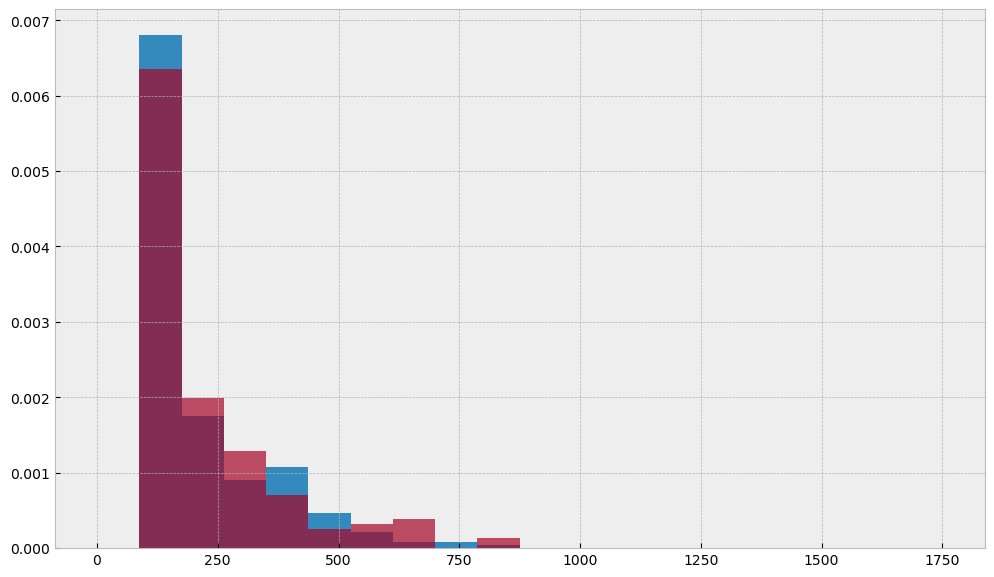

In [218]:
plt.rcParams["figure.figsize"] = (12,7)
plt.hist(train_data['ip_ss'], bins=20, range = [0, 1750], density = True)
plt.hist(test_data['ip_ss'], bins=20, range = [0, 1750], density = True, alpha = 0.7);

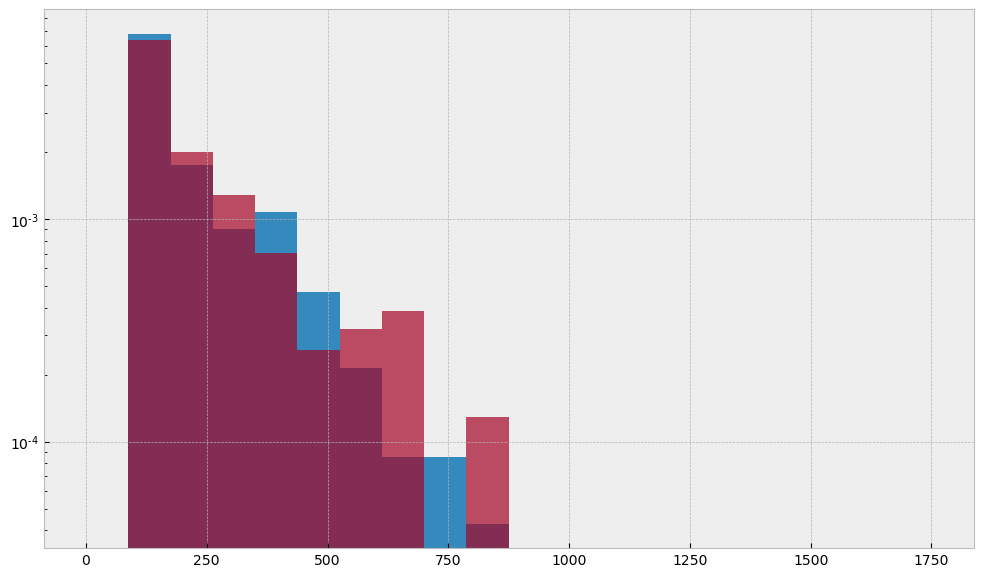

In [219]:
plt.hist(train_data['ip_ss'], bins=20, range = [0, 1750], log = True, density = True)
plt.hist(test_data['ip_ss'], bins=20, range = [0, 1750], log = True, density = True, alpha = 0.7);

In [82]:
original_features = [  # Define the features and target
    'max',
    'mean',
    # 'iqr',
    # 'rms', 
    # 'mad',
    'median',
    # 'kurt',
    # 'mode',
    #'variance',   
    'std_dev'
                    #  'shape_factor',
                     # 'avg_first_order_diff', 
                      #'slope', 
                    #  'skewness',
                    #  'crest_factor', 
                    #  'median_crossing_rate', 
                     ]
extra_features = [
    'ts_data_q99',
    # 'ts_data_q90', 
    # 'ts_data_q95',
    # 'ts_data_q98',
    # 'ts_data_q75',
    #  #'ts_data_q2',
    #  #'ts_data_q5',
    # #'ts_data_q10', 
    # 'ts_data_q25',
                #   'psd_peak',
                #   'psd_peak_freq',
                #    'psd_1st_band_norm',
                # #   'psd_1st_band',
                #    'psd_2nd_band_norm',
                #   'psd_2nd_band'
                  ]
ampl_features = [
    'ampl_mean',
    'ampl_q99',
    # 'ampl_std',
    # # 'ampl_var' 
                    # 'rel_ampl_mean',
                    # 'rel_ampl_q99', 
                    # 'rel_ampl_std', 
                    # 'rel_ampl_var'
                     ]
filtered_features = [
    # 'ts_data_q99_f',
    'maximum_f',
    # 'mean_f',
    # # 'variance_f',
    # 'std_dev_f',

    # 'ampl_mean_f',
    # 'ampl_q99_f',
    # 'ampl_std_f',
    # # 'ampl_var_f'    
                    # 'rel_ampl_mean_f',
                    # 'rel_ampl_q99_f', 
                    # 'rel_ampl_std_f', 
                    # 'rel_ampl_var_f'
                     ]
ip_stats_features = [
                      # 'ip_num',
                      # 'total_val_median_share',
                      # 'share_of_dominant_ip',
                      'q_99_dom_ip',
                      # 'ts_mean_dom_ip', 
                      # # 'iqr_dom_ip', 
                      # 'q_99_ips_mean', 
                      # 'ts_mean_ips_mean',
                      # 'iqr_ips_mean',                      
                      # 'q_99_ips_sum', 
                      # 'ts_mean_ips_sum',
                      # 'iqr_ips_sum'
                      ]    


features = original_features + extra_features +  filtered_features + ip_stats_features

#features = filtered_features ampl_features +
target = 'ip_ss'




In [220]:
X_train = train_data[features]
y_train = train_data[target]

X_test = test_data[features]
y_test = test_data[target]


#### Save train and test datasets

In [221]:
train_data_csv = pd.concat([train_data[['prediction_id', 'ip_ss']], X_train], axis=1)
test_data_csv = pd.concat([test_data[['prediction_id', 'ip_ss']], X_test], axis=1)

In [222]:
train_data_csv.to_csv('./train_test/train_data_csv')
test_data_csv.to_csv('./train_test/test_data_csv')

In [277]:
# import random
# total = len(df)
# train_count = int(0.8*total)
# test_count = total - train_count
# print(train_count, test_count)

In [ ]:
# #Dictionary with unique account_ids and number of prediction_ids for each of them (vector-metric should be filtered beforehand)  
# account_counts = df['account_id'].value_counts().to_dict()
# account_counts

In [100]:
# import random
# total = len(df)
# train_count = int(0.8*total)
# test_count = total - train_count

# train_set_ids = []
# test_set_ids = []
# cumulative_sum = 0

# account_counts = df['account_id'].value_counts().to_dict()
# account_ids = list(account_counts.keys())
# random.shuffle(account_ids)

# for account_id in account_ids:
#     class_count = account_counts[account_id]
#     cumulative_sum += class_count
#     if cumulative_sum <= train_count:
#         # Add all elements of this class to the train set        
#         train_set_ids.extend(df[df['account_id'] == account_id]['prediction_id'].tolist())       
#     else:
#         # Add all elements of this class to the test set
#         test_set_ids.extend(df[df['account_id'] == account_id]['prediction_id'].tolist())

#### Features VS. Target

In [158]:
filtered_data.loc[:,['ip_ss', *features]].corr()['ip_ss'].sort_values()

q_99_dom_ip    0.788853
median         0.808047
mean           0.840833
std_dev        0.869410
ts_data_q99    0.889845
max            0.905087
maximum_f      0.929560
ip_ss          1.000000
Name: ip_ss, dtype: float64

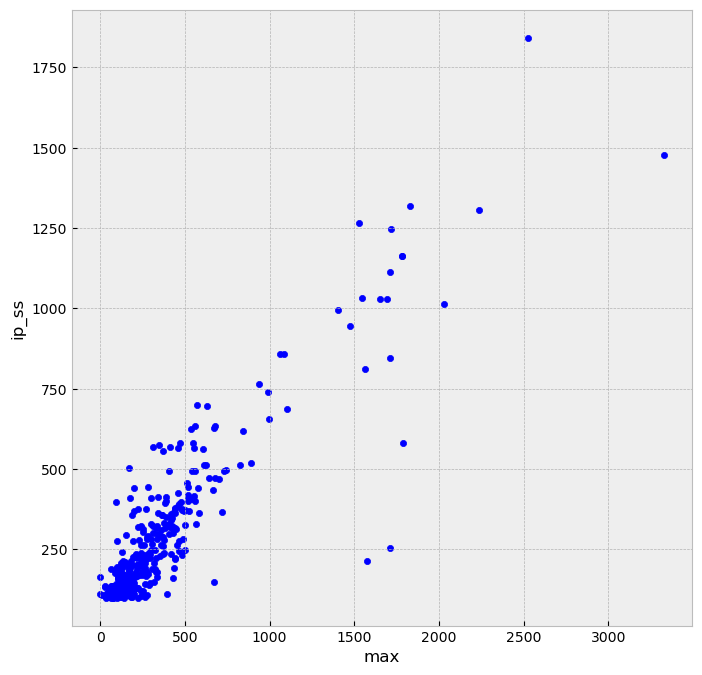

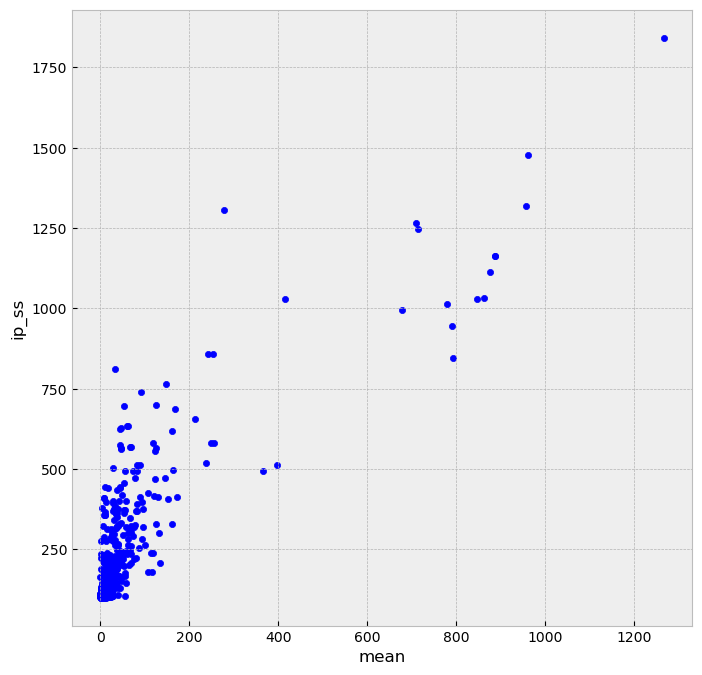

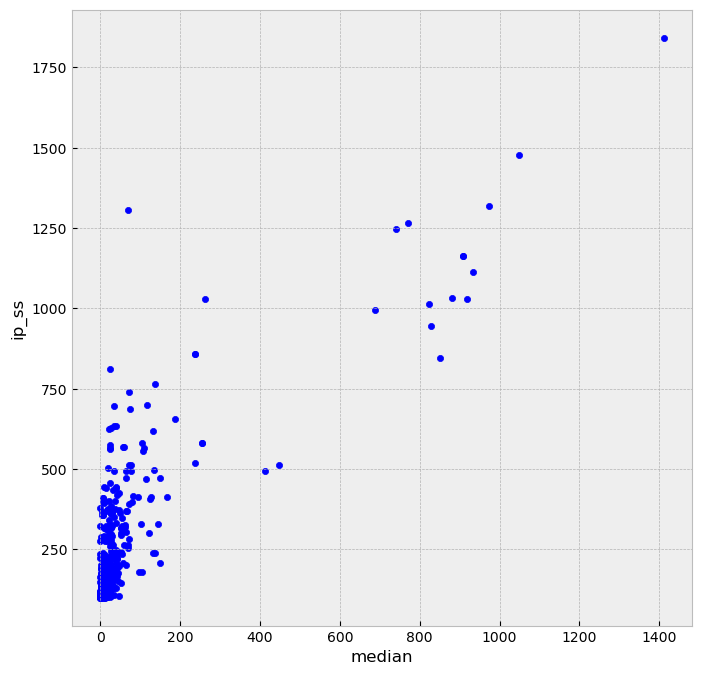

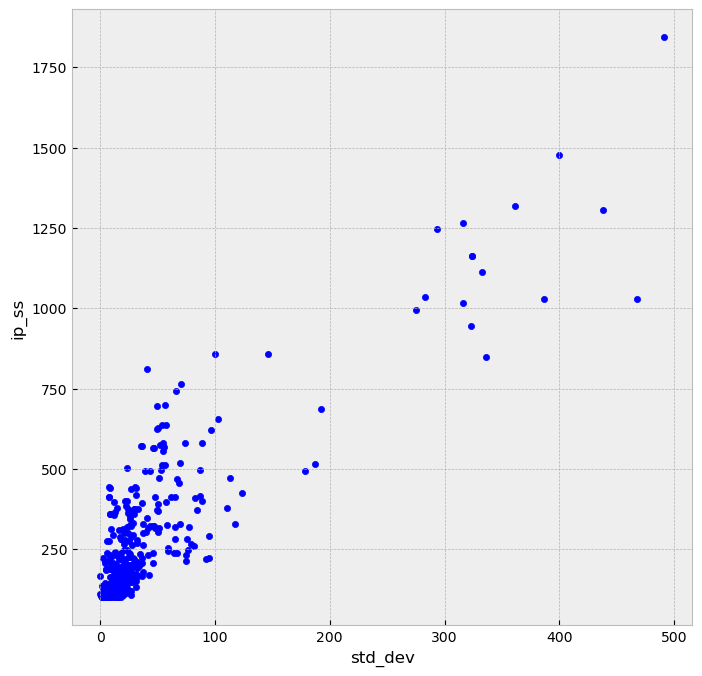

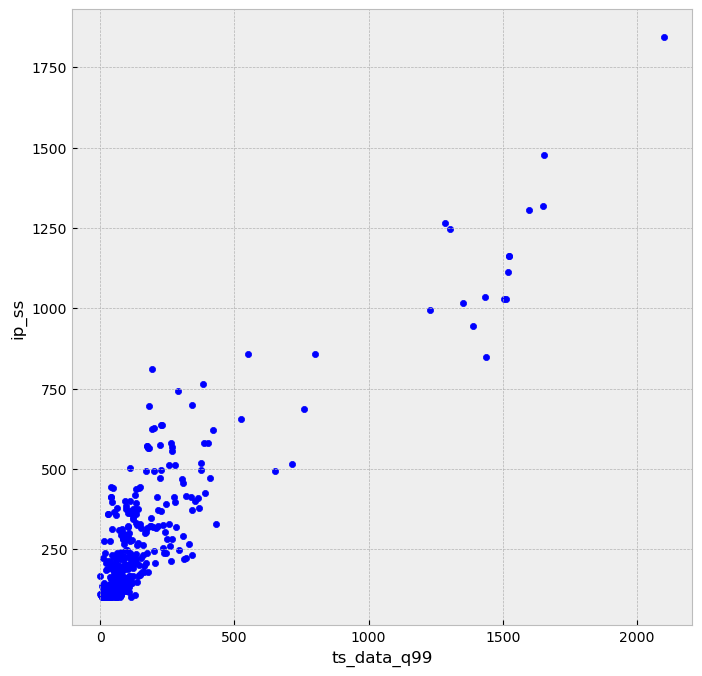

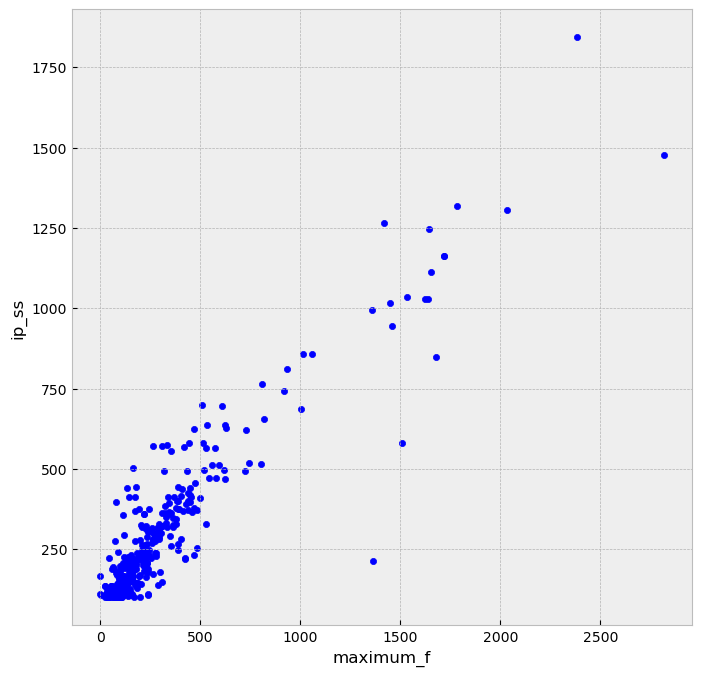

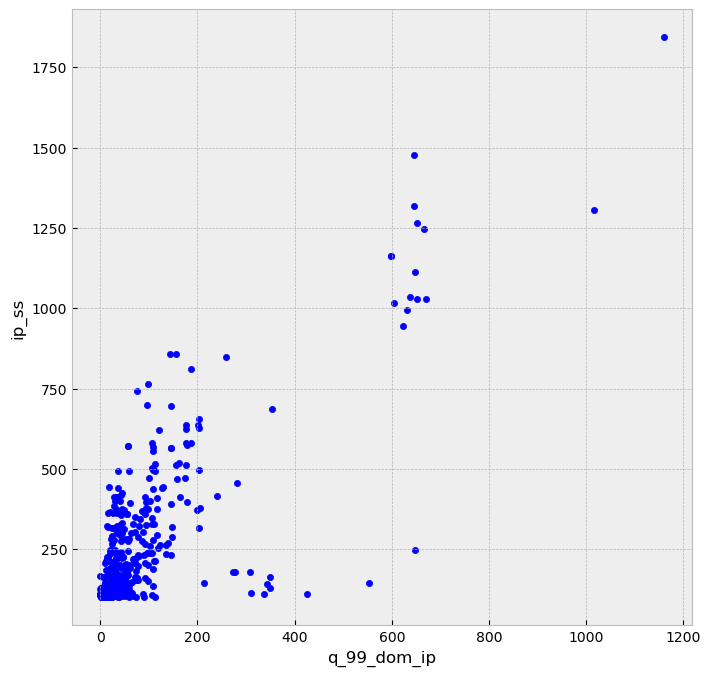

In [143]:
plt.rcParams["figure.figsize"] = (8,8)
for col in features:
    filtered_data.plot(x=col, y='ip_ss', kind='scatter')
    plt.xlabel(col)
    plt.ylabel('ip_ss')
    # plt.xscale('log')
    # plt.yscale('log')
    # #plt.ylim(0,1500)
    # plt.xlim(0,100)
    plt.show()


### MODELS

In [101]:
# Create the scatter trace
def plot_true_pred(y_test, y_pred):
    scatter_trace = go.Scatter(
        x=y_test,
        y=y_pred,
        mode='markers',
        hovertemplate='true: %{x}<br>pred: %{y}',
    )

    # scatter_trace = go.Scatter(
    #     x= y_test,
    #     y= np.abs((y_pred - y_test)/y_test),
    #     mode='markers',
    #     hovertemplate='true: %{x}<br>pred: %{y}',
    # )


    # # Create the scatter trace for the x = y line
    # line_trace = go.Scatter(
    #     x=[min(y_test), max(y_test)],
    #     y=[min(y_pred), max(y_pred)],
    #     mode='lines',
    #     line=dict(color='red', width=2),
    #     hoverinfo='skip',  # Disable hover for the line trace
    # )


    # Create the figure
    fig = go.Figure(data=[scatter_trace])
    # fig = go.Figure(data=[scatter_trace, line_trace])
    # Update the axis type to log scale
    fig.update_xaxes(type='log')
    fig.update_yaxes(type='log')

    # Update layout
    fig.update_layout(
        xaxis_title='True Values',
        yaxis_title='Predicted Values',
    )
    fig.update_layout(width=800, height=800)

    # Show the plot
    fig.show()

In [223]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import pickle

scalers = {
    # 'No Scaling': None,
    #'MinMaxScaler': MinMaxScaler(),
    'StandardScaler': StandardScaler(),
    #'RobustScaler': RobustScaler()
}

lin_models = {    
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'SVR': SVR()
}

# models = {
#     'RandomForestRegressor': RandomForestRegressor(),
#     'XGBoost': xgb.XGBRegressor(),
#     'CatBoost': CatBoostRegressor(silent=True)  # Disable verbose output
# }

results = []
best_models = []

for scaler_name, scaler in scalers.items():
    for model_name, model in lin_models.items():
        # pipeline 
        pipeline = Pipeline([
            ('scaler', scaler),
            ('model', model)
        ])
        
        # grid search
        param_grid = {}
        if model_name == 'Ridge':
            param_grid = {'model__alpha': [0.1, 0.2, 0.5, 0.9]}

        if model_name == 'Lasso':
            param_grid = {'model__alpha': [0.1, 0.2, 0.5, 0.9]}

        if model_name == 'SVR':
            param_grid = {'model__C': [0.1, 1, 10], 'model__kernel': ['linear', 'rbf', 'poly', 'sigmoid'], 'model__degree': [2, 3, 4], 'model__gamma': ['scale', 'auto'], 
                          'model__epsilon': [0.1, 0.15, 0.2]}

        # elif model_name == 'RandomForestRegressor':
        #     param_grid = {'model__n_estimators': [100, 500], 'model__max_depth': [None, 5, 10], 'model__bootstrap': [True]}

        # elif model_name == 'XGBoost':
        #     param_grid = {'model__learning_rate': [0.01, 0.1, 0.2, 0.5], 
        #                   'model__max_depth': [3, 5, 7, 10]
        #                   }
        # elif model_name == 'CatBoost':
        #     param_grid = {'model__iterations': [100, 500],   #use very large number of iterations with early stopping, like 10000, early stop 10-20
        #                   'model__learning_rate': [0.01, 0.1, 0.2], 
        #                   'model__depth': [3, 5, 10],
        #                 #   'model__l2_leaf_reg': [0.2, 0.5, 1, 3]
        #                 #early stopping???????????????????? 
        #                 # use best iteration/ model 
        #                   }
        

        grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5)
        # grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error')

        # Apply logarithmic transformation to the target variable


        y_train_log = np.log1p(y_train)
        X_train_log = np.log1p(X_train)
        X_test_log = np.log1p(X_test)

        # grid_search.fit(X_train, y_train)

        grid_search.fit(X_train_log, y_train_log)
        
        # Get the best model and its hyperparameters
        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_
        
        # # Make predictions on the test set using the best model
        # y_pred = best_model.predict(X_test)

        # Make predictions on the test set using the best model
        y_pred_log = best_model.predict(X_test_log)
        # Transform the predictions back to the original scale
        y_pred = np.expm1(y_pred_log)

        df = pd.DataFrame({'y_pred': y_pred, 'y_test': y_test})
        # Save DataFrame to a CSV file
        filename = f'{scaler_name}_{model_name}.csv'
        df.to_csv(os.path.join('./train_test/', filename), index=False)
        
        # Calculate evaluation metrics
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        hits = np.sum(np.abs((y_pred - y_test) / y_test) <= 0.15)
        total_samples = len(y_test)
        accuracy = hits / total_samples
                
        # Store the results
        results.append({
            'Scaler': scaler_name,
            'Model': model_name,
            'Best Params': best_params,
            'RMSE': rmse,
            'MAPE': mape,
            'R2': r2,
            'Accuracy': accuracy            
        })
        
        best_models.append(best_model)
   

        print(f"Scaler: {scaler_name}, Model: {model_name}")
        print(f"Best Hyperparameters: {best_params}")
        print(f"RMSE: {rmse}")
        print(f"MAPE: {mape}")
        print(f"R2: {r2}")
        print(f"Accuracy: {accuracy}")
        print()
        plot_true_pred(y_test, y_pred)
        print('---------------------------------------------------------------------------')  


Scaler: StandardScaler, Model: LinearRegression
Best Hyperparameters: {}
RMSE: 66.44675176692604
MAPE: 0.1862183868226888
R2: 0.8105987954034033
Accuracy: 0.5449438202247191



---------------------------------------------------------------------------
Scaler: StandardScaler, Model: Ridge
Best Hyperparameters: {'model__alpha': 0.9}
RMSE: 66.93022568871801
MAPE: 0.18650860846931258
R2: 0.8078325599008609
Accuracy: 0.5393258426966292



---------------------------------------------------------------------------
Scaler: StandardScaler, Model: Lasso
Best Hyperparameters: {'model__alpha': 0.1}
RMSE: 87.21351321873294
MAPE: 0.21450007034081345
R2: 0.6737107324751537
Accuracy: 0.4101123595505618



---------------------------------------------------------------------------
Scaler: StandardScaler, Model: SVR
Best Hyperparameters: {'model__C': 10, 'model__degree': 2, 'model__epsilon': 0.1, 'model__gamma': 'scale', 'model__kernel': 'rbf'}
RMSE: 61.38144373182862
MAPE: 0.1515623371548008
R2: 0.8383746701628826
Accuracy: 0.6404494382022472



---------------------------------------------------------------------------


In [224]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import pickle

scalers = {
    # 'No Scaling': None,
    'MinMaxScaler': MinMaxScaler(),
    'StandardScaler': StandardScaler(),
    'RobustScaler': RobustScaler()
}

lin_models = {    
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(alpha=0.5),
    'Lasso': Lasso(alpha=0.1),
    'SVR': SVR()
}

models = {
    'RandomForestRegressor': RandomForestRegressor(),
    # 'XGBoost': xgb.XGBRegressor(),
    'CatBoost': CatBoostRegressor(silent=True)  # Disable verbose output
}

results = []
best_models = []



for scaler_name, scaler in scalers.items():
    for model_name, model in models.items():
        # pipeline 
        pipeline = Pipeline([
            ('scaler', scaler),
            ('model', model)
        ])
        
        # grid search
        param_grid = {}
        if model_name == 'SVR':
            param_grid = {'model__C': [0.1, 1, 10], 'model__kernel': ['poly'], 'model__degree': [2, 3, 4], 'model__gamma': ['scale', 'auto']}
            # param_grid = {'model__C': [0.1, 1, 10], 'model__kernel': ['linear', 'rbf', 'poly'], 'model__degree': [2, 3, 4], 'model__gamma': ['scale', 'auto']}

        elif model_name == 'RandomForestRegressor':
            param_grid = {'model__n_estimators': [100, 500], 'model__max_depth': [None, 5, 10], 'model__bootstrap': [True]}

        # elif model_name == 'XGBoost':
        #     param_grid = {'model__learning_rate': [0.01, 0.1, 0.2, 0.5], 
        #                   'model__max_depth': [3, 5, 7, 10]
        #                   }
        elif model_name == 'CatBoost':
            param_grid = {'model__iterations': [10000],   #use very large number of iterations with early stopping, like 10000, early stop 10-20
                        #   'model__learning_rate': [0.01, 0.1, 0.2], 
                        #   'model__depth': [3, 5, 10],
                          'model__early_stopping_rounds': [30]
                        #   'model__l2_leaf_reg': [0.2, 0.5, 1, 3]
                        #early stopping???????????????????? 
                        # use best iteration/ model 
                          }
        

        grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5)
        # grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error')

        # Apply logarithmic transformation to the target variable
        y_train_log = np.log1p(y_train)
        X_train_log = np.log1p(X_train)
        X_test_log = np.log1p(X_test)

        # grid_search.fit(X_train, y_train)

        grid_search.fit(X_train_log, y_train_log)
        
        # Get the best model and its hyperparameters
        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_
        
        # # Make predictions on the test set using the best model
        # y_pred = best_model.predict(X_test)

        # Make predictions on the test set using the best model
        y_pred_log = best_model.predict(X_test_log)
        # Transform the predictions back to the original scale
        y_pred = np.expm1(y_pred_log)


        df = pd.DataFrame({'y_pred': y_pred, 'y_test': y_test})
        # Save DataFrame to a CSV file
        filename = f'{scaler_name}_{model_name}.csv'
        df.to_csv(os.path.join('./train_test/', filename), index=False)
        
        
        # Calculate evaluation metrics
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        hits = np.sum(np.abs((y_pred - y_test) / y_test) <= 0.15)
        total_samples = len(y_test)
        accuracy = hits / total_samples
                
        # Store the results
        results.append({
            'Scaler': scaler_name,
            'Model': model_name,
            'Best Params': best_params,
            'RMSE': rmse,
            'MAPE': mape,
            'R2': r2,
            'Accuracy': accuracy,
        })
        
        best_models.append(best_model)
   

        print(f"Scaler: {scaler_name}, Model: {model_name}")
        print(f"Best Hyperparameters: {best_params}")
        print(f"RMSE: {rmse}")
        print(f"MAPE: {mape}")
        print(f"R2: {r2}")
        print(f"Accuracy: {accuracy}")
        print()
        plot_true_pred(y_test, y_pred)
        print('---------------------------------------------------------------------------')  


Scaler: MinMaxScaler, Model: RandomForestRegressor
Best Hyperparameters: {'model__bootstrap': True, 'model__max_depth': 10, 'model__n_estimators': 100}
RMSE: 60.725114055988705
MAPE: 0.14485018340784023
R2: 0.8418125940361061
Accuracy: 0.6910112359550562



---------------------------------------------------------------------------
Scaler: MinMaxScaler, Model: CatBoost
Best Hyperparameters: {'model__early_stopping_rounds': 30, 'model__iterations': 10000}
RMSE: 63.28491455917211
MAPE: 0.13769805610845606
R2: 0.8281950698977643
Accuracy: 0.7191011235955056



---------------------------------------------------------------------------
Scaler: StandardScaler, Model: RandomForestRegressor
Best Hyperparameters: {'model__bootstrap': True, 'model__max_depth': None, 'model__n_estimators': 100}
RMSE: 61.27417280126662
MAPE: 0.14572654248175612
R2: 0.8389390931773113
Accuracy: 0.6853932584269663



---------------------------------------------------------------------------
Scaler: StandardScaler, Model: CatBoost
Best Hyperparameters: {'model__early_stopping_rounds': 30, 'model__iterations': 10000}
RMSE: 63.28491455917211
MAPE: 0.13769805610845606
R2: 0.8281950698977643
Accuracy: 0.7191011235955056



---------------------------------------------------------------------------
Scaler: RobustScaler, Model: RandomForestRegressor
Best Hyperparameters: {'model__bootstrap': True, 'model__max_depth': 10, 'model__n_estimators': 100}
RMSE: 59.122795139777004
MAPE: 0.1452563650214235
R2: 0.8500504586025208
Accuracy: 0.6797752808988764



---------------------------------------------------------------------------
Scaler: RobustScaler, Model: CatBoost
Best Hyperparameters: {'model__early_stopping_rounds': 30, 'model__iterations': 10000}
RMSE: 63.28491455917211
MAPE: 0.13769805610845606
R2: 0.8281950698977643
Accuracy: 0.7191011235955056



---------------------------------------------------------------------------


In [ ]:
    # # Calculate the residuals (errors)
    # residuals = y_test - y_pred

    # # Plot the true values against the residuals
    # plt.scatter(y_test, residuals)
    # plt.axhline(y=0, color='r', linestyle='-', lw=2)  # Add a horizontal line at y=0
    # plt.xlabel('True Values')
    # plt.ylabel('Residuals')

    # plt.title(f'Residual Plot ({scaler_name})')
    # plt.show()

In [ ]:
# # get feature importance from the trained Random Forest model
# feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': model.feature_importances_})
# feature_importance = feature_importance.sort_values('importance', ascending=False)
# feature_importance

In [ ]:
# import catboost as cb
# from catboost import CatBoostRegressor

# model_cbr = cb.CatBoostRegressor(loss_function='RMSE')
# train_dataset = cb.Pool(X_train, y_train) 
# test_dataset = cb.Pool(X_test, y_test)

# grid = {'iterations': [500],
#         'learning_rate': [0.1, 0.2, 0.5],
#         'depth': [4, 8, 10, 20],
#         'l2_leaf_reg': [0.2, 0.5, 1, 3]}
# model_cbr.grid_search(grid, train_dataset)

# #model_cbr.fit(X_train, y_train)
# y_pred = model_cbr.predict(X_test)

# # Calculate the accuracy based on the 10% deviation criterion
# hits = np.sum(np.abs((y_pred - y_test) / y_test) <= 0.15)
# total_samples = len(y_test)
# accuracy = hits / total_samples
# mape = mean_absolute_percentage_error(y_test, y_pred)
# rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))
# r2 = r2_score(y_test, y_pred)

# print(f"Accuracy:  {accuracy * 100:.2f}%")
# print(f"MAPE:  {mape * 100:.2f}%")
# print('RMSE: {:.2f}'.format(rmse))
# print('R2: {:.2f}'.format(r2))

### Date and time features:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
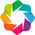

In [227]:
# Extra Libs
import matplotlib.dates as mdates
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')
from bokeh.models import HoverTool
from IPython.display import HTML, display
from scipy.signal import find_peaks
from statsmodels.tsa.seasonal import seasonal_decompose

Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
directory = Extracted_dir_tcp_pps

In [241]:
df = data_filt_noconst[
        (data_filt_noconst['prediction_id'] == '603f960a7c9f064b700c1e449dea1cba32b1b1a422add15a8c77ae217d19cd04') #| 
        # (data_filt_noconst['prediction_id'] == 'b3999926bc3c3326a15fdbb30ef9724ac49b873998dbc138fccfde00f2f9969c') |
        # (data_filt_noconst['prediction_id'] == '8fa477035e3ae9604273bf10b15665dae22334fd52a2d89adede052b2eef313f')
]

figures = []
for _, row in df.iterrows():
        Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
        directory = Extracted_dir_tcp_pps
        pred_id = row['prediction_id']
        parquet_file = row['ts_name']

        ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
        # result = seasonal_decompose(ts_data["total_val"],period=None)
        # #result.resid
        # plt.rcParams["figure.figsize"] = (20,8)
        # result.plot()
        # plt.show()

        ts_data.reset_index(inplace=True)
        ts_data = ts_data.rename(columns={'passed_tmstmp': 'timestamp'})
        ts_data = ts_data.drop(columns = ['total_val', 'blocked_val'])       
                # A variety of resamples 
        df_hourly = ts_data.set_index('timestamp').resample('H').max()
        # df_daily = ts_data.set_index('timestamp').resample('D').quantile(0.99).reset_index()  

        # Step 2: Calculate the 99th quantile for chunks of data with a window size of 24 hours
        window_size = '12H'
        quantile_threshold = 0.95
        

        rolling_quantile = df_hourly.rolling(window_size).quantile(quantile_threshold) #1

        rolling_mean = df_hourly.rolling(window_size).mean()
        rolling_std = df_hourly.rolling(window_size).std()
        rolling_mean_3std = rolling_mean + 3*rolling_std #2

        # Shift rolling quantile back by half of window_size
        rolling_quantile_shifted = rolling_quantile.shift(-6)
        rolling_mean_3std_shifted = rolling_mean_3std.shift(-6)

        # Step 3: Detect samples above the 99th quantiles in each chunk
        peaks = df_hourly[df_hourly > rolling_quantile_shifted] 
        peaks_3std = df_hourly[df_hourly > rolling_mean_3std_shifted]
        peaks_global = df_hourly[df_hourly > df_hourly.quantile(quantile_threshold)]

        # Create interactive plot using Plotly
        fig = go.Figure()

        # Add resampled data line plot
        fig.add_trace(go.Scatter(x=df_hourly.index, y=df_hourly['passed_val'],  mode='lines', name='Resampled Data'))

        # Add peaks thresholds line plot
        fig.add_trace(go.Scatter(x=rolling_quantile_shifted.index,  y=rolling_quantile_shifted['passed_val'],  mode='lines',  name='99th Quantile'))
        fig.add_trace(go.Scatter(x=rolling_mean_3std_shifted.index,  y=rolling_mean_3std_shifted['passed_val'],  mode='lines',  name='Mean + 3std'))
        #fig.add_trace(go.Scatter(x=rolling_quantile_shifted.index,  y=rolling_quantile_shifted['total_val'],  mode='lines',  name='99th Quantile'))




        # Add peaks scatter plot
        fig.add_trace(go.Scatter(x=peaks_global.index, y=peaks_global['passed_val'], mode='markers', name='peaks_global', marker=dict(color='green', size=8)))    
        fig.add_trace(go.Scatter(x=peaks.index, y=peaks['passed_val'], mode='markers', name='Peaks', marker=dict(color='red', size=8)))
        fig.add_trace(go.Scatter(x=peaks_3std.index, y=peaks_3std['passed_val'], mode='markers', name='peaks_3std', marker=dict(color='yellow', size=8)))
            
        # Set plot layout
        fig.update_layout(title='Peaks Detection', xaxis_title='Timestamp', yaxis_title='Value')

        # Show the interactive plot
        fig.show()

           

In [ ]:
df = data_filt_noconst[
        (data_filt_noconst['prediction_id'] == '603f960a7c9f064b700c1e449dea1cba32b1b1a422add15a8c77ae217d19cd04') | 
        (data_filt_noconst['prediction_id'] == 'b3999926bc3c3326a15fdbb30ef9724ac49b873998dbc138fccfde00f2f9969c') |
        (data_filt_noconst['prediction_id'] == '8fa477035e3ae9604273bf10b15665dae22334fd52a2d89adede052b2eef313f')
]

figures = []
for _, row in df.iterrows():
        Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
        directory = Extracted_dir_tcp_pps
        pred_id = row['prediction_id']
        parquet_file = row['ts_name']
        ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()

        
        hist, bin_edges = np.histogram(ts_data['passed_val'], bins = 10, density=True)

        
        

In [251]:
ts_data = pd.read_parquet(directory.joinpath('PT_TCP_PPS_603f960a7c9f064b700c1e449dea1cba32b1b1a422add15a8c77ae217d19cd04' + '.parquet'), engine='pyarrow').sort_index()
#df_hourly = ts_data.resample('H').max()
hist, bin_edges = np.histogram(ts_data['passed_val'], bins = 10, density=True)


In [252]:
hist

array([7.62434446e-02, 3.17934057e-04, 4.30461279e-04, 8.39488801e-05,
       2.85783422e-05, 1.96476102e-05, 1.25030247e-05, 1.25030247e-05,
       1.78614639e-06, 1.07168783e-05])

In [253]:
bin_edges

array([  3.08233 ,  16.042157,  29.001984,  41.961811,  54.921638,
        67.881465,  80.841292,  93.801119, 106.760946, 119.720773,
       132.6806  ])

In [242]:
# Create interactive plot using Plotly
fig = go.Figure()

# Add resampled data line plot
fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['passed_val'],  mode='lines', name='Raw Data'))
fig.show()

(array([7.62434446e-02, 3.17934057e-04, 4.30461279e-04, 8.39488801e-05,
        2.85783422e-05, 1.96476102e-05, 1.25030247e-05, 1.25030247e-05,
        1.78614639e-06, 1.07168783e-05]),
 array([  3.08233 ,  16.042157,  29.001984,  41.961811,  54.921638,
         67.881465,  80.841292,  93.801119, 106.760946, 119.720773,
        132.6806  ]),
 <BarContainer object of 10 artists>)

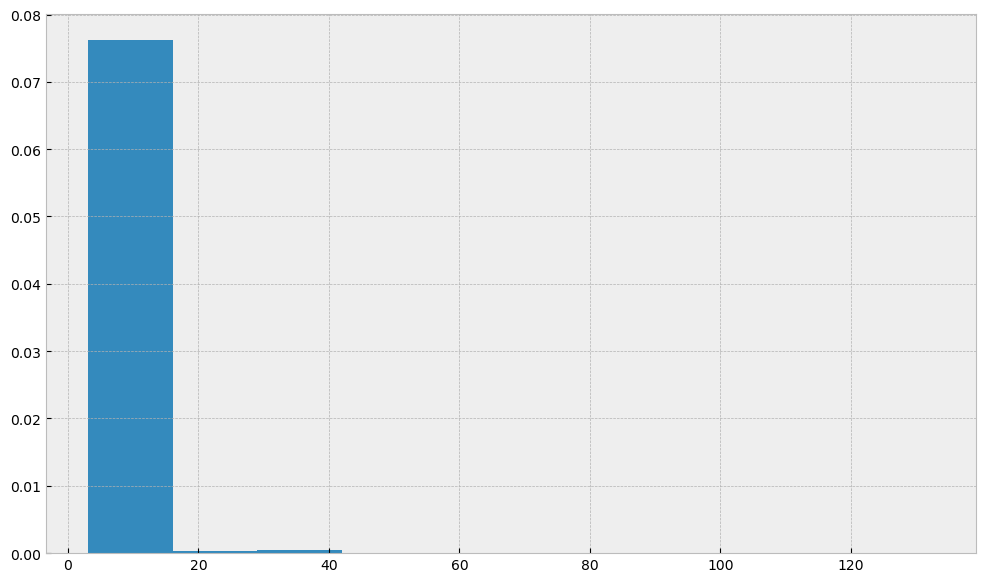

In [250]:
# Plot the histogram
plt.hist(ts_data['passed_val'], bins=10, density = True)

### Season

In [ ]:
import pickle
df = filtered_data[
     (filtered_data['prediction_id'] == '603f960a7c9f064b700c1e449dea1cba32b1b1a422add15a8c77ae217d19cd04') | 
(filtered_data['prediction_id'] == 'b3999926bc3c3326a15fdbb30ef9724ac49b873998dbc138fccfde00f2f9969c') 
]


save_pickle = False
filename = 'data_tcp_pps_filtered_ipss_214.pkl'


figures = []
for _, row in df.iterrows():
        pred_id = row['prediction_id']
        parquet_file = row['ts_name']

        ts_data = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()

        ts_data['ampl'] = ts_data['total_val'] - ts_data['total_val'].quantile(0.99)

        ampl_mean = ts_data[ts_data['ampl'] > 0]['ampl'].mean()
        ampl_q99 = ts_data[ts_data['ampl'] > 0]['ampl'].quantile(0.99)
        ampl_std = ts_data[ts_data['ampl'] > 0]['ampl'].std()
        ampl_var = ts_data[ts_data['ampl'] > 0]['ampl'].var()

        rel_ampl_mean = ampl_mean / ts_data['total_val'].quantile(0.99)
        rel_ampl_q99 = ampl_q99 / ts_data['total_val'].quantile(0.99)


        Q99_ampl_mean = ts_data['total_val'].quantile(0.99) + ampl_mean
        Q99_ampl_q99 = ts_data['total_val'].quantile(0.99) + ampl_q99
        Q99_ampl_3std = Q99_ampl_mean + 3*ampl_std


        ts_data_filt = ts_data[ts_data['total_val'] < Q99_ampl_q99]
        
        # A variety of resamples 
        df_hourly = ts_data.set_index('timestamp').resample('H').max().reset_index()

        df_daily = ts_data.set_index('timestamp').resample('D').quantile(0.99).reset_index()       
                

        fig = go.Figure()       
        fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['total_val'], mode='lines', name='total_val'))
        fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['passed_val'], mode='lines', name='passed_val'))
        fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data['blocked_val'], mode='lines', name='blocked_val'))
        fig.add_trace(go.Scatter(x=ts_data.index, y=ts_data_filt['total_val'], mode='lines', name='total_val_filt'))


        fig.add_trace(go.Scatter(x=ts_data.index, y=[Q99_ampl_mean]*len(ts_data), mode='lines', name='Q99+ampl_mean'))
        fig.add_trace(go.Scatter(x=ts_data.index, y=[Q99_ampl_q99]*len(ts_data), mode='lines', name='Q99+ampl_q99'))
        fig.add_trace(go.Scatter(x=ts_data.index, y=[Q99_ampl_3std]*len(ts_data), mode='lines', name='Q99+ampl_3std'))

        fig.add_trace(go.Scatter(x=ts_data.index, y=df_hourly['total_val'], mode='lines', name='total_val'))

            # plot features:

        for feature in features:
            fig.add_trace(go.Scatter(x=ts_data.index, y=[row[feature]]*len(ts_data), mode='lines', line=dict(dash='dash'), name=feature))


                                    # plot thresholds:
        fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_ss']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_ss'))
        # fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_sc']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_sc'))
        # fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_nw']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_nw'))
        # fig.add_trace(go.Scatter(x=ts_data.index, y=[row['ip_rl']]*len(ts_data), mode='lines', line=dict(dash='dash'), name='ip_rl'))


        if save_pickle == False:
            print('ts_name:', parquet_file)
            print('comment:', row['comment'])
            print('reason:', row['reason'])
            print('ampl_mean:', ampl_mean)
            print('ampl_q99:', ampl_q99)
            print('ampl_std:', ampl_std)
            print('ampl_var:', ampl_var)


            print('rel_ampl_mean:', rel_ampl_mean)
            print('rel_ampl_q99:', rel_ampl_q99)
            fig.show()
        else:
            # Add annotations to the figure
            fig.add_annotation(
            x=0.5, y=1.1,
            xref='paper', yref='paper',
            text=f"pred_id: {pred_id}\ncomment: {row['comment']}\nreason: {row['reason']}",
            showarrow=False,
            font=dict(size=12),
             )   
    
        figures.append(fig)

        
        # Save the figures to a file
        
with open(filename, 'wb') as file:
    if save_pickle == True:
        pickle.dump(figures, file)   

In [42]:
def plot_date_time(parquet_file):
    Extracted_dir_tcp_pps = pathlib.Path("./../../itay_and_mila_imperva_data/PT_TCP_PPS_extracted_ts/")
    directory = Extracted_dir_tcp_pps


    df = pd.read_parquet(directory.joinpath(parquet_file + '.parquet'), engine='pyarrow').sort_index()
    df.reset_index(inplace=True)
    df = df.rename(columns={'passed_tmstmp': 'timestamp'})
    df = df.drop(columns = ['passed_val', 'blocked_val'])
    #df    
    Minutes = hv.Curve(df.set_index('timestamp')).opts(
        opts.Curve(title="minutes", xlabel="", ylabel="total_val",
                   width=1000, height=300,tools=['hover'],show_grid=True))
    
    Hourly = hv.Curve(df.set_index('timestamp').resample('H').max()).opts(
      opts.Curve(title="Hourly", xlabel="", ylabel="total_val",
                  width=1000, height=300,tools=['hover'],show_grid=True))

    Daily = hv.Curve(df.set_index('timestamp').resample('D').max()).opts(
      opts.Curve(title="Daily", xlabel="", ylabel="total_val",
                width=1000, height=300,tools=['hover'],show_grid=True))

    Weekly = hv.Curve(df.set_index('timestamp').resample('W').max()).opts(
        opts.Curve(title="Weekly", xlabel="Date", ylabel="total_val",
                   width=1000, height=300,tools=['hover'],show_grid=True))


    plot_date_time = (Minutes + Hourly + Daily + Weekly).opts(shared_axes=False).cols(1)
    return plot_date_time

In [43]:
plot_date_time('PT_TCP_PPS_b3999926bc3c3326a15fdbb30ef9724ac49b873998dbc138fccfde00f2f9969c')

:Layout
   .Curve.I   :Curve   [timestamp]   (total_val)
   .Curve.II  :Curve   [timestamp]   (total_val)
   .Curve.III :Curve   [timestamp]   (total_val)
   .Curve.IV  :Curve   [timestamp]   (total_val)

In [44]:
plot_date_time('PT_TCP_PPS_603f960a7c9f064b700c1e449dea1cba32b1b1a422add15a8c77ae217d19cd04')

:Layout
   .Curve.I   :Curve   [timestamp]   (total_val)
   .Curve.II  :Curve   [timestamp]   (total_val)
   .Curve.III :Curve   [timestamp]   (total_val)
   .Curve.IV  :Curve   [timestamp]   (total_val)

In [88]:
# A variety of resamples 
df_hourly = df.set_index('timestamp').resample('H').mean().reset_index()
df_daily = df.set_index('timestamp').resample('D').mean().reset_index()
df_weekly = df.set_index('timestamp').resample('W').mean().reset_index()

In [89]:
# New features 
# Loop to cycle through both DataFrames
for DataFrame in [df_hourly, df_daily]:
    DataFrame['Weekday'] = (pd.Categorical(DataFrame['timestamp'].dt.strftime('%A'),
                                           categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday', 'Saturday', 'Sunday'])
                           )
    DataFrame['Hour'] = DataFrame['timestamp'].dt.hour
    DataFrame['Day'] = DataFrame['timestamp'].dt.weekday
    DataFrame['Month'] = DataFrame['timestamp'].dt.month
    DataFrame['Year'] = DataFrame['timestamp'].dt.year
    DataFrame['Month_day'] = DataFrame['timestamp'].dt.day
    DataFrame['Lag'] = DataFrame['total_val'].shift(1)
    DataFrame['Rolling_Mean'] = DataFrame['total_val'].rolling(7, min_periods=1).mean()
    DataFrame = DataFrame.dropna()

In [90]:
(hv.Distribution(df['total_val'])
.opts(opts.Distribution(title="Overall Value Distribution",
                        xlabel="Value",
                        ylabel="Density",
                        width=1000, height=300,
                        tools=['hover'], show_grid=True)
     ))

:Distribution   [total_val]   (Density)

In [92]:
by_weekday_mean = df_hourly.groupby(['Hour','Weekday']).mean()
by_weekday_mean.head(20)

total_val  Day  Month    Year  Month_day       Lag  \
Hour Weekday                                                         
0    Monday      5.431362  0.0  10.75  2021.0      12.25  5.402184   
     Tuesday     5.661557  1.0  10.75  2021.0      13.25  5.651215   
     Wednesday   5.943032  2.0  10.75  2021.0      14.25  5.855658   
     Thursday    6.926132  3.0  10.75  2021.0      15.25  5.722393   
     Friday      6.265046  4.0  10.75  2021.0      16.25  5.655408   
     Saturday    5.906997  5.0  10.60  2021.0      18.40  5.838745   
     Sunday      6.974140  6.0  10.60  2021.0      19.40  6.200046   
1    Monday      4.696229  0.0  10.75  2021.0      12.25  5.431362   
     Tuesday     4.969669  1.0  10.75  2021.0      13.25  5.661557   
     Wednesday   4.986905  2.0  10.75  2021.0      14.25  5.943032   
     Thursday    5.069268  3.0  10.75  2021.0      15.25  6.926132   
     Friday      4.917695  4.0  10.75  2021.0      16.25  6.265046   
     Saturday    5.144552  5.0  10.60  2021.0      18.40  5.906997   
     Sunday      5.393469  6.0  10.60  2021.0      19.40  6.974140   
2    Monday      5.235670  0.0  10.75  2021.0      12.25  4.696229   
     Tuesday     5.813404  1.0  10.75  2021.0      13.25  4.969669   
     Wednesday   5.884209  2.0  10.75  2021.0      14.25  4.986905   
     Thursday    5.657267  3.0  10.75  2021.0      15.25  5.069268   
     Friday      5.436037  4.0  10.75  2021.0      16.25  4.917695   
     Saturday    5.508031  5.0  10.60  2021.0      18.40  5.144552   

                Rolling_Mean  
Hour Weekday                  
0    Monday         7.001106  
     Tuesday        7.430648  
     Wednesday      7.459781  
     Thursday       7.549105  
     Friday         7.406301  
     Saturday       7.221679  
     Sunday         7.602117  
1    Monday         6.412662  
     Tuesday        6.745089  
     Wednesday      6.873751  
     Thursday       7.010934  
     Friday         6.829686  
     Saturday       6.703891  
     Sunday         7.095513  
2    Monday         6.001356  
     Tuesday        6.409764  
     Wednesday      6.531411  
     Thursday       6.675780  
     Friday         6.444596  
     Saturday       6.364469

In [93]:
by_weekday_max = df_hourly.groupby(['Hour','Weekday']).max()
by_weekday_max.head(20)

timestamp  total_val  Day  Month  Year  Month_day  \
Hour Weekday                                                                 
0    Monday    2021-11-15 00:00:00   6.129425    0     11  2021         25   
     Tuesday   2021-11-16 00:00:00   6.370302    1     11  2021         26   
     Wednesday 2021-11-17 00:00:00   7.552319    2     11  2021         27   
     Thursday  2021-11-18 00:00:00   8.794316    3     11  2021         28   
     Friday    2021-11-19 00:00:00   7.839621    4     11  2021         29   
     Saturday  2021-11-20 00:00:00   7.100033    5     11  2021         30   
     Sunday    2021-11-21 00:00:00  10.452234    6     11  2021         31   
1    Monday    2021-11-15 01:00:00   5.234790    0     11  2021         25   
     Tuesday   2021-11-16 01:00:00   5.433783    1     11  2021         26   
     Wednesday 2021-11-17 01:00:00   5.802030    2     11  2021         27   
     Thursday  2021-11-18 01:00:00   5.743083    3     11  2021         28   
     Friday    2021-11-19 01:00:00   5.396632    4     11  2021         29   
     Saturday  2021-11-20 01:00:00   5.880487    5     11  2021         30   
     Sunday    2021-11-21 01:00:00   6.242716    6     11  2021         31   
2    Monday    2021-11-15 02:00:00   5.799376    0     11  2021         25   
     Tuesday   2021-11-16 02:00:00   7.446941    1     11  2021         26   
     Wednesday 2021-11-17 02:00:00   6.572362    2     11  2021         27   
     Thursday  2021-11-18 02:00:00   6.452268    3     11  2021         28   
     Friday    2021-11-19 02:00:00   5.940842    4     11  2021         29   
     Saturday  2021-11-20 02:00:00   6.266966    5     11  2021         30   

                      Lag  Rolling_Mean  
Hour Weekday                             
0    Monday      6.292545      8.158475  
     Tuesday     6.325797      8.499937  
     Wednesday   6.855198      8.929467  
     Thursday    6.575169      8.711444  
     Friday      6.400762      8.336195  
     Saturday    6.814592      8.471838  
     Sunday      7.226911      8.854551  
1    Monday      6.129425      7.429464  
     Tuesday     6.370302      7.461886  
     Wednesday   7.552319      8.197823  
     Thursday    8.794316      8.061425  
     Friday      7.839621      7.713248  
     Saturday    7.100033      7.886763  
     Sunday     10.452234      8.285045  
2    Monday      5.234790      6.855609  
     Tuesday     5.433783      7.294318  
     Wednesday   5.802030      7.701247  
     Thursday    5.743083      7.644484  
     Friday      5.396632      7.256119  
     Saturday    5.880487      7.444665

In [94]:
by_weekday_max = df_hourly.groupby(['Hour','Weekday']).max()['total_val'].unstack()
plot = hv.Distribution(by_weekday_max['Monday'], label='Monday') * hv.Distribution(by_weekday_max['Tuesday'], label='Tuesday') * hv.Distribution(by_weekday_max['Wednesday'], label='Wednesday') * hv.Distribution(by_weekday_max['Thursday'], label='Thursday') * hv.Distribution(by_weekday_max['Friday'], label='Friday') * hv.Distribution(by_weekday_max['Saturday'], label='Saturday') *hv.Distribution(by_weekday_max['Sunday'], label='Sunday').opts(opts.Distribution(title="MAXIMUM total_val Density by Day & Hour"))
plot.opts(opts.Distribution(width=1000, height=400,tools=['hover'],show_grid=True, ylabel="Density", xlabel="total_val"))


:Overlay
   .Distribution.Monday    :Distribution   [Monday]   (Density)
   .Distribution.Tuesday   :Distribution   [Tuesday]   (Density)
   .Distribution.Wednesday :Distribution   [Wednesday]   (Density)
   .Distribution.Thursday  :Distribution   [Thursday]   (Density)
   .Distribution.Friday    :Distribution   [Friday]   (Density)
   .Distribution.Saturday  :Distribution   [Saturday]   (Density)
   .Distribution.Sunday    :Distribution   [Sunday]   (Density)

In [95]:
by_weekday_mean = df_hourly.groupby(['Hour','Weekday']).mean()['total_val'].unstack()
plot = hv.Distribution(by_weekday_mean['Monday'], label='Monday') * hv.Distribution(by_weekday_mean['Tuesday'], label='Tuesday') * hv.Distribution(by_weekday_mean['Wednesday'], label='Wednesday') * hv.Distribution(by_weekday_mean['Thursday'], label='Thursday') * hv.Distribution(by_weekday_mean['Friday'], label='Friday') * hv.Distribution(by_weekday_mean['Saturday'], label='Saturday') *hv.Distribution(by_weekday_mean['Sunday'], label='Sunday').opts(opts.Distribution(title="MEAN total_val Density by Day & Hour"))
plot.opts(opts.Distribution(width=1000, height=400,tools=['hover'],show_grid=True, ylabel="Density", xlabel="total_val"))


:Overlay
   .Distribution.Monday    :Distribution   [Monday]   (Density)
   .Distribution.Tuesday   :Distribution   [Tuesday]   (Density)
   .Distribution.Wednesday :Distribution   [Wednesday]   (Density)
   .Distribution.Thursday  :Distribution   [Thursday]   (Density)
   .Distribution.Friday    :Distribution   [Friday]   (Density)
   .Distribution.Saturday  :Distribution   [Saturday]   (Density)
   .Distribution.Sunday    :Distribution   [Sunday]   (Density)

In [96]:
hv.Bars(df_hourly[['total_val','Weekday']].groupby('Weekday').max()).opts(
    opts.Bars(title="MAXIMUM total_val by Day", xlabel="", ylabel="total_val",
               width=700, height=300,tools=['hover'],show_grid=True))

:Bars   [Weekday]   (total_val)

In [97]:
hv.Bars(df_hourly[['total_val','Weekday']].groupby('Weekday').mean()).opts(
    opts.Bars(title="MEAN total_val by Day", xlabel="", ylabel="total_val",
               width=700, height=300,tools=['hover'],show_grid=True))

:Bars   [Weekday]   (total_val)

Let's look at hourly traffic.

In [ ]:
hv.Curve(df_hourly[['total_val','Hour']].groupby('Hour').mean()).opts(
    opts.Curve(title="MEAN total_val Hourly", xlabel="Hour", ylabel="total_val",
               width=700, height=300,tools=['hover'],show_grid=True))

:Curve   [Hour]   (total_val)

In [ ]:
hv.Bars(df_hourly[['total_val','Hour']].groupby('Hour').mean()).opts(
    opts.Bars(title="MEAN total_val by hour", xlabel="", ylabel="total_val",
               width=700, height=300,tools=['hover'],show_grid=True))

:Bars   [Hour]   (total_val)

In [ ]:
hv.Curve(df_hourly[['total_val','Hour']].groupby('Hour').max()).opts(
    opts.Curve(title="MAXIMUM total_val Hourly", xlabel="Hour", ylabel="total_val",
               width=700, height=300,tools=['hover'],show_grid=True))

:Curve   [Hour]   (total_val)

### Extracting trends and seasonality

In [160]:
ts_data = read_ts(data_tcp_pps, ['PT_TCP'], ['PPS'], ['2aa6d45332ddb5651754a94b7ede4a47ac090a233159ad987fc599c5173f09cd'], Extracted_dir_tcp_pps)
ts_data.head()

,passed_val,blocked_val,total_val
passed_tmstmp,,,
2019-11-08 12:14:00,14.355,0.0,14.355
2019-11-08 12:15:00,15.129,0.0,15.129
2019-11-08 12:16:00,14.964,0.0,14.964
2019-11-08 12:17:00,15.971,0.0,15.971
2019-11-08 12:18:00,15.922,0.0,15.922


In [161]:
ts_data.shape

(43171, 3)

In [162]:
result = seasonal_decompose(ts_data["passed_val"], period = 24*60)

In [ ]:
plt.rcParams["figure.figsize"] = (20,8)
result.plot();

In [ ]:
ts_data2 = read_ts(data_tcp_pps, ['PT_TCP'], ['PPS'], ['2aa6d45332ddb5651754a94b7ede4a47ac090a233159ad987fc599c5173f09cd'], Extracted_dir_tcp_pps)
ts_data2.head()

result2 = seasonal_decompose(ts_data2["passed_val"], period = 24*60)

In [ ]:
plt.rcParams["figure.figsize"] = (20,8)
result2.plot();

In [ ]:
train["std_of_diff_between_cells"] = train.filter(like="val_").diff(axis=1).std(axis=1)

### Insights: 
- STD of the diff between cells looks like a good separator. 
- Maybe we should find a better diff - let's try to find the diff between 2 minimaz or maximaz:

In [ ]:
train["std_of_diff_between_24_cells"] = train.filter(like="val_").diff(periods = -24, axis=1).std(axis = 1)

### Extracting trends and seasonality

In [ ]:
ts_data = read_ts(data, ['PT_SYN'], ['PPS'], ['a85101f9a44c3e7fa26ad3a8f5258b1f6b780aed7e1c38ed176b7e993e7de776'], Extracted_dir)
ts_data.head()

,passed_val,blocked_val,total_val
passed_tmstmp,,,
2019-12-03 02:22:00,0.080,0.0,0.080
2019-12-03 02:23:00,0.090,0.0,0.090
2019-12-03 02:24:00,0.101,0.0,0.101
2019-12-03 02:25:00,0.088,0.0,0.088
2019-12-03 02:26:00,0.091,0.0,0.091


In [ ]:
ts_data.shape

(43170, 3)

In [ ]:
result = seasonal_decompose(ts_data["passed_val"], period = 24*60)
#result.resid

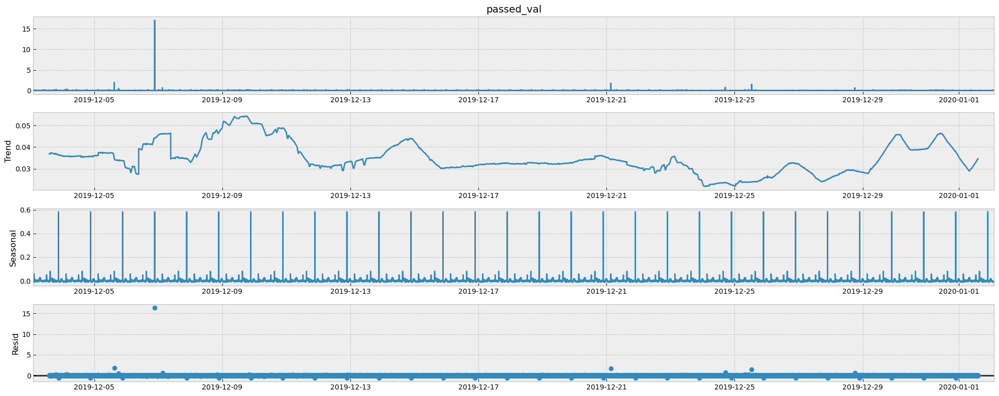

In [ ]:
plt.rcParams["figure.figsize"] = (20,8)

result.plot()
plt.show()

### Welch transform

In [40]:
fs = 1/60 #sampling rate   1/60
f, Pxx_den = signal.welch(ts_data.passed_val, fs, nperseg=4*4096, noverlap=3*4096)

#Plot
plt.semilogy(3600*f, Pxx_den)
plt.xscale('log')
plt.xlim(0, 10)
#plt.ylim([0.5e-3, 1])
plt.xlabel('frequency [1/hour]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

NameError: name 'signal' is not defined

In [ ]:
psd_peak = np.argmax(Pxx_den)
psd_peak

34

In [ ]:
psd_peak_freq = f[np.argmax(Pxx_den)]*3600
psd_peak_freq

0.12451171875

In [ ]:
psd_first_band_norm = (Pxx_den[f * 3600 < 1e-1]/Pxx_den.sum()).sum() #normalized
psd_first_band_norm

0.016705561399322187

In [ ]:
psd_first_band = (Pxx_den[f * 3600 < 1e-1]).sum()
psd_first_band

75.66851564446948

In [ ]:
psd_second_band_norm = (Pxx_den[(f * 3600 >= 1e-1) & (f * 3600 < 1) ]/Pxx_den.sum()).sum()
psd_second_band_norm

0.10512274386251783

In [ ]:
psd_second_band = (Pxx_den[(f * 3600 >= 1e-1) & (f * 3600 < 1) ]).sum()
psd_second_band

476.15771768515566

In [ ]:
#(Pxx_den[(f * 3600 >= 1) & (f * 3600 < 10) ]/Pxx_den.sum()).sum()

### Carrying signal 

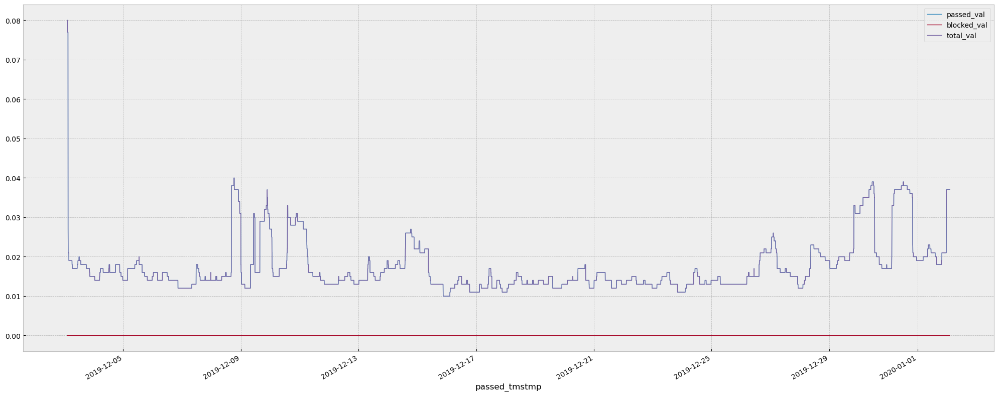

In [ ]:
ts_data.rolling("4H").min().plot(linewidth=1, ax=plt.gca())
plt.tight_layout()

In [ ]:
signal.welch?